## Rainfall Weather Forecasting Project

In [1]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Importing the dataset
df=pd.read_csv(r'D:\Files\weatherAUS.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


This data frame contains information related to **Rainfall Weather Forecasting**. It contains **8425 rows and 23 columns** out of which **21 columns are inputs** and **2 columns are target variable** i.e. **'RainTomorrow' and 'Rainfall' columns**.  
  
The data frame contains both  **numeric and catagorical data.**  
  
We are going to treat **'Rainfall' as Target variable** and **rest of the columns as inputs.**  
  
**'Rainfall' column has numeric data,** thus it represents **Regression Problem**.  
  
***The goal is to predict how much rainfall could be there.***   

In [3]:
df.columns#checking columns of data frame

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [4]:
#Checking data type of columns
df.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

There are **two types** of data present in this data frame which are **object and float64**. **'Date' feature** contains date thus it's data type should be **'datetime64'** instead of 'object'.

In [5]:
#checking for whitespace characters in columns of data frame
col=df.columns.tolist() #Storing columns name as list in 'col' variable

space=''#Initilizing empty 'space' variable
validation=0#Initilizaing variable

for i in col:#Iterating through columns
    
    for a in range(1,11): #Iterating for 10 number of times i.e. it can detect upto 10 number of whitespaces per row
        space+=' ' #Incrementing one white space character per iteration
        
        if not df.loc[df[i]==space].empty:#Checking if any row contains white space characters
            
            validation+=1#increasing 1 in 'validation' variable
            
            print(f'There are white space characters present in {i} Column with length of  {len(space)}  white space characters')#Printing if a column contains white space character along with number of  white space characters present in a single row(Note:It does not print total number of white space characters present in a column)
            
    space=''#Reseting 'space' variable
    
if validation==0:#Using 'if' to check whether 'validation' variable's value matches to '0' or not.
    print('This data frame does not contains any whitespace characters.')

This data frame does not contains any whitespace characters.


In [6]:
df.isnull().sum() #Checking if null values are present in data frame 

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

**All** of the columns **have** null values except for **'Date' and 'Location'** columns.

In [7]:
null_c=list(col) #copying data of 'col' list

null_c.remove('Date') #removing 'Date' feature 
null_c.remove('Location') #removing 'Location' feature 

for i in null_c: #iterating through 'null_c' list
    
    if df[i].dtypes=='object': #using if condition to check for columns which have 'object' data type
             
            mode=df[i].mode()[0] #getting mode 
            
            print(f'Using mode as "{mode}" of "{i}" column \n')#printing
            
            df[i].fillna(mode,inplace=True)#filling null values
            
    elif df[i].dtypes=='float64': #using if condition to check for columns which have 'float64' data type
            
            mean=df[i].mean() #calculating mean
            
            print(f'Using mean as "{mean}" of "{i}" column \n')#printing
            
            df[i].fillna(mean,inplace=True)#filling null values

Using mean as "13.193305389221557" of "MinTemp" column 

Using mean as "23.85997609085475" of "MaxTemp" column 

Using mean as "2.8059132559560167" of "Rainfall" column 

Using mean as "5.38939548137594" of "Evaporation" column 

Using mean as "7.632204919882645" of "Sunshine" column 

Using mode as "N" of "WindGustDir" column 

Using mean as "40.174468657519505" of "WindGustSpeed" column 

Using mode as "N" of "WindDir9am" column 

Using mode as "SE" of "WindDir3pm" column 

Using mean as "13.847646424721523" of "WindSpeed9am" column 

Using mean as "18.533661937965856" of "WindSpeed3pm" column 

Using mean as "67.82249581639971" of "Humidity9am" column 

Using mean as "51.2497897392767" of "Humidity3pm" column 

Using mean as "1017.640233277122" of "Pressure9am" column 

Using mean as "1015.2360747926332" of "Pressure3pm" column 

Using mean as "4.566622251832112" of "Cloud9am" column 

Using mean as "4.5031825795644895" of "Cloud3pm" column 

Using mean as "17.762014577607836" of "T

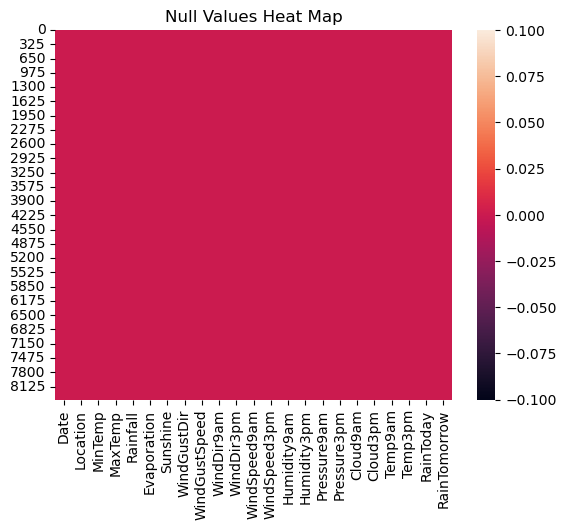

In [8]:
sb.heatmap(df.isnull())#Visualizing null values via Heatmap
plt.title('Null Values Heat Map')
plt.show()

We can confirm that now this **data frame does not have null values present in it.**

In [9]:
#creating a function named 'dup' to check for duplicate values in data frame

def dup(x):#takes one argument i.e variable which stores data frame
    
    a=x.duplicated().sum()#storing sum of duplicate values in 'a' variable
    
    if a==0:#first condition
        print('This data frame does not contains duplicate values.')#printing
    
    elif a==1:#second condition
        print('There is only 1 duplicate value present in the data frame.')#printing
    
    else:
        print(f'Total duplicate values present in DataFrame are {x.duplicated().sum()}.')#printing
    
dup(df)

Total duplicate values present in DataFrame are 1663.


In [10]:
df.drop_duplicates(inplace=True)#dropping duplicate values

dup(df)#re-checking for duplicate values

This data frame does not contains duplicate values.


In [11]:
#changing data type of 'Date' feature
df['Date']=pd.to_datetime(df.Date,format='%Y-%m-%d')
df.dtypes

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RainTomorrow             object
dtype: object

Now the data frame has **three data types** which are **datetime64[ns], float64 and object**. 'Date' feature's data type is **changed** from 'object' **to 'datetime64[ns]' successfully.**
  
**Majority** of data types are **float64**

In [12]:
df.info()#Checking more information related to data frame

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6762 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           6762 non-null   datetime64[ns]
 1   Location       6762 non-null   object        
 2   MinTemp        6762 non-null   float64       
 3   MaxTemp        6762 non-null   float64       
 4   Rainfall       6762 non-null   float64       
 5   Evaporation    6762 non-null   float64       
 6   Sunshine       6762 non-null   float64       
 7   WindGustDir    6762 non-null   object        
 8   WindGustSpeed  6762 non-null   float64       
 9   WindDir9am     6762 non-null   object        
 10  WindDir3pm     6762 non-null   object        
 11  WindSpeed9am   6762 non-null   float64       
 12  WindSpeed3pm   6762 non-null   float64       
 13  Humidity9am    6762 non-null   float64       
 14  Humidity3pm    6762 non-null   float64       
 15  Pressure9am    6762 n

This shows **information** related to the **columns** and about their **Non-null count** and **Dtype.** It also shows the memory usage , which is **1.2+ MB** in this case.

In [13]:
#fetching details of columns, such as Unique values, Number of unique values and their value counts 
for i in col:#Iterating through 'col' variable
    print('\n',i,':-\nUnique values:',df[i].unique(),'\nNumber of unique values:',df[i].nunique(),'\n\n',df[i].value_counts().to_frame('Value Counts'))#Printing


 Date :-
Unique values: ['2008-12-01T00:00:00.000000000' '2008-12-02T00:00:00.000000000'
 '2008-12-03T00:00:00.000000000' ... '2013-06-06T00:00:00.000000000'
 '2013-06-07T00:00:00.000000000' '2013-06-08T00:00:00.000000000'] 
Number of unique values: 3004 

             Value Counts
2011-02-11             4
2011-02-18             4
2011-03-18             4
2011-03-19             4
2011-03-20             4
...                  ...
2016-11-03             1
2016-11-02             1
2016-11-01             1
2016-10-31             1
2013-06-08             1

[3004 rows x 1 columns]

 Location :-
Unique values: ['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru'] 
Number of unique values: 12 

               Value Counts
PerthAirport          1204
Albury                 907
Newcastle              822
Melbourne              811
Williamtown            615
CoffsHarbour           611
Brisbane               5

This gives a breif information about **unique values, count of unique values and value counts** of each column present in the data frame.  
Target variable has 251 unique values.

In [14]:
df.set_index('Date',inplace=True)#setting date as index of the data frame
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No


**'Date' feature** is **set as index** successfully. Now data frame has **22 columns** out of which **21 columns are inputs** and **remaing column is target variable.**

In [15]:
df.to_csv(r'D:\Files\R-RWF.csv')#exporting data frame as csv 

In [16]:
df.describe()#Using describe function on data frame

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.110016,24.096335,2.780674,5.339977,7.767098,39.144388,12.792133,17.585384,67.509082,50.478258,1017.629004,1015.142442,4.400224,4.372235,17.894035,22.704947
std,5.540673,6.130161,10.482770,3.343991,2.736693,13.382876,9.788112,9.549341,17.182723,18.498573,6.027916,5.967815,2.476781,2.324720,5.722423,5.971925
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.000000,19.600000,0.000000,4.000000,7.632205,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000
50%,13.193305,23.500000,0.000000,5.389395,7.632205,39.000000,11.000000,17.000000,68.000000,50.000000,1017.640233,1015.236075,4.566622,4.503183,17.900000,22.300000
75%,17.400000,28.400000,1.200000,5.389395,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


This gives the statistical information of the numerical columns. From the above description we can observe the following:   
  
1)There are no missing values.    
  
2)Mean is oddly greater than 50% in **'MaxTemp'** and **Rainfall** columns which means that these data **might** be **skewed to the right** in these columns.    
  
3)There is huge jump between max and 75% in **'MaxTemp', 'Rainfall', 'Evaporation', 'WindGustSpeed','WindSpeed9am',  'WindSpeed3pm', and 'Humidity3pm'** columns which means that there **might** be **outliers present** in these columns.

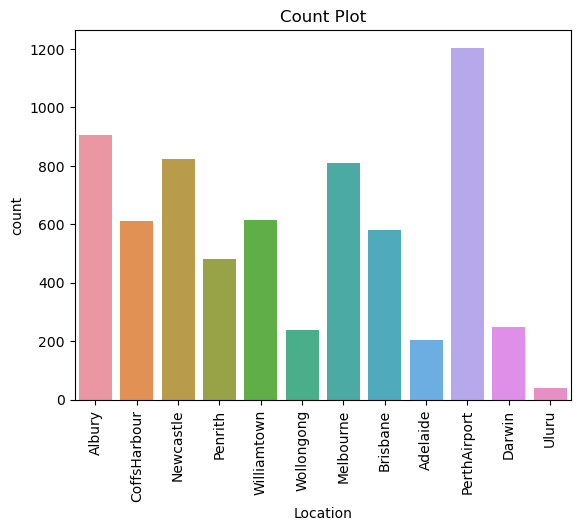

In [17]:
#checking count of values present in 'Location' feature
sb.countplot(data=df,x='Location')
plt.title('Count Plot')
plt.xticks(rotation=90)
plt.show()

**'PerthAirport'** location has the **highest frequency**.

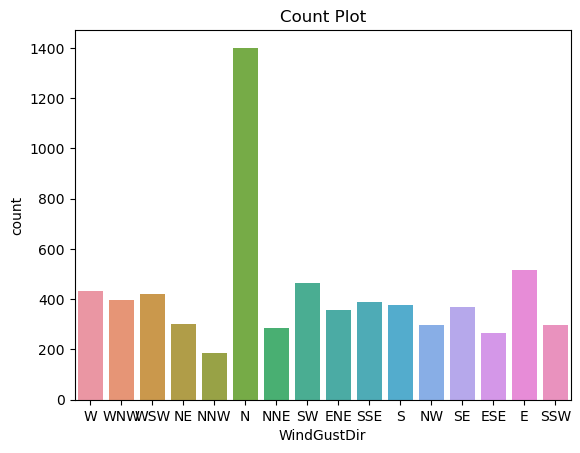

In [18]:
#checking count of values present in 'WindGustDir' feature
sb.countplot(data=df,x='WindGustDir')
plt.title('Count Plot')
plt.show()

**'N'** WindGustDir has the **highest frequency.**

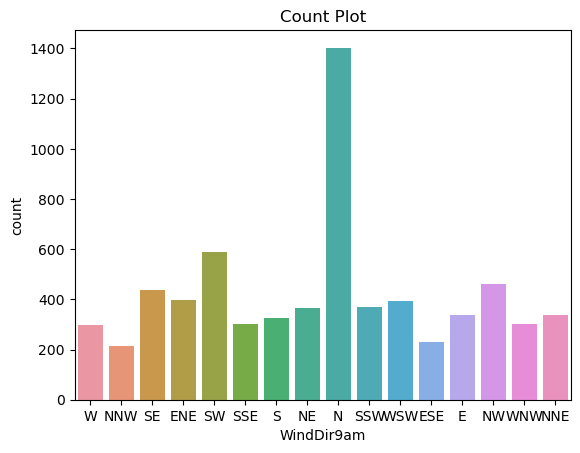

In [19]:
#checking count of values present in 'WindDir9am' feature
sb.countplot(data=df,x='WindDir9am')
plt.title('Count Plot')
plt.show()

**'N'** WindDir9am has the **highest frequency.**

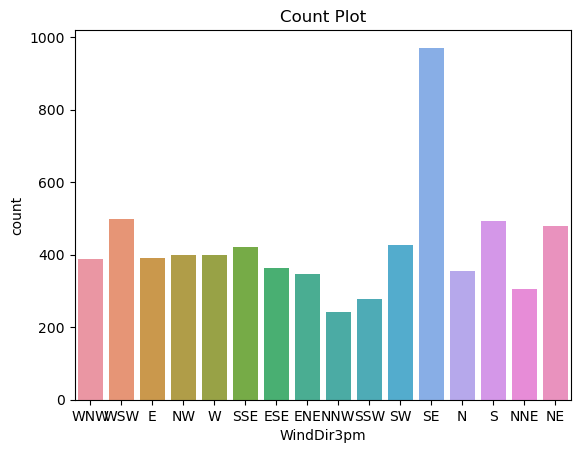

In [20]:
#checking count of values present in 'WindDir3pm' feature
sb.countplot(data=df,x='WindDir3pm')
plt.title('Count Plot')
plt.show()

**'SE'** WindDir3pm has the **highest frequency.**

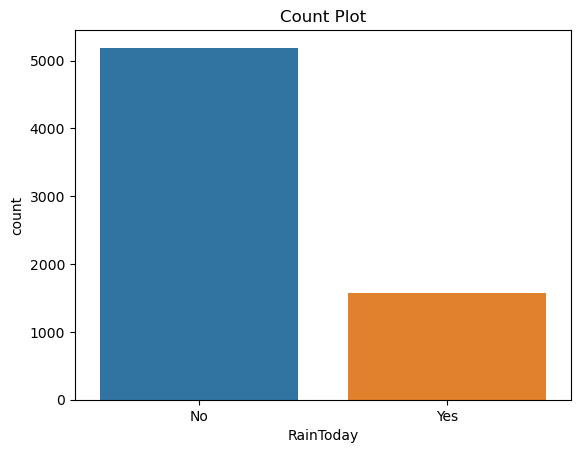

In [21]:
#checking count of values present in 'RainToday' feature
sb.countplot(data=df,x='RainToday')
plt.title('Count Plot')
plt.show()

**'No'**  has the **highest frequency** in **'RainToday'** feature.

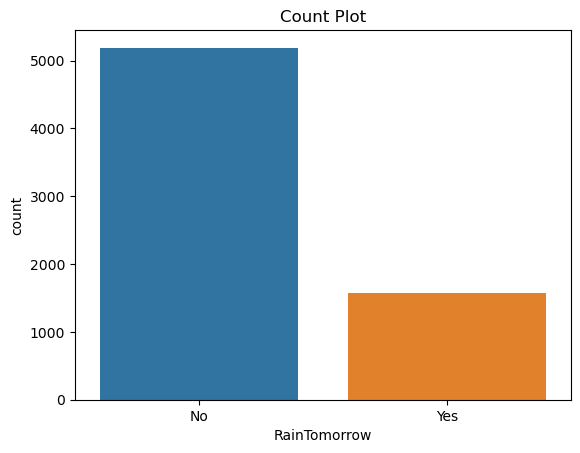

In [22]:
#checking count of values present in 'RainTomorrow' column
sb.countplot(data=df,x='RainTomorrow')
plt.title('Count Plot')
plt.show()

**'No'**  has the **highest frequency** in **'RainTomorrow'** column.

In [23]:
col=df.columns.to_list()#updating 'col' list


#creating empty list
num_c=[]
cat_c=[]

for i in col:#iterating through 'col' variable 
    
    if df[i].dtypes=='float64':#using if condition to execute the following code only if the columns contains numeric values
        num_c.append(i)#appending 'i' in 'num_c' list

    elif df[i].dtypes=='object':#using if condition to execute the following code only if the columns contains catagorical values
        cat_c.append(i)#appending 'i' in 'cat_c' list

log=[]#creating empty list which is stored in 'log' variable 

def re():#creating a function named 're'
    
    for i in num_c:#iterating through 'num_c' variable
        if i not in log:#using if condition to plot graphs
            sb.lmplot(data=df,x=log[-1],y=i)
            plt.title('Linear Model Plot')
    plt.show()

In [24]:
num_c#checking contents of 'num_c' list

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

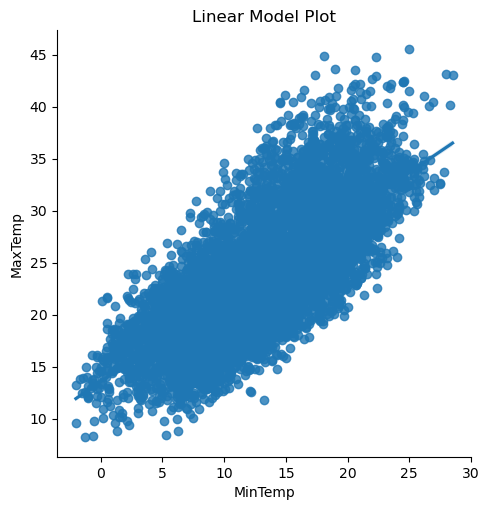

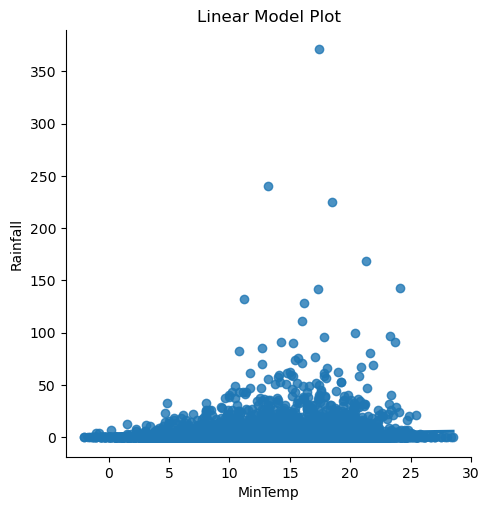

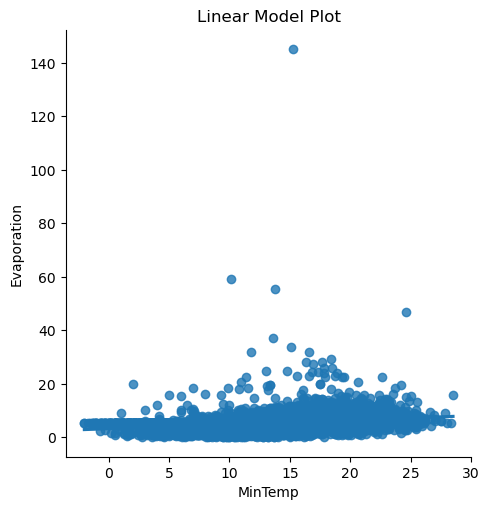

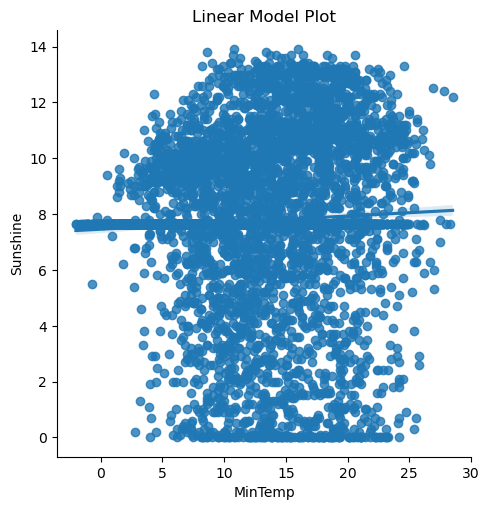

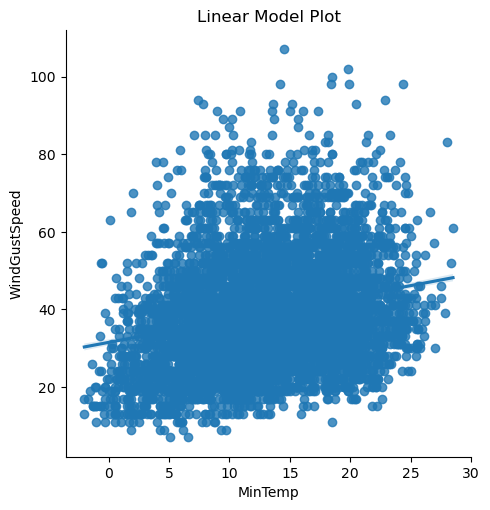

...

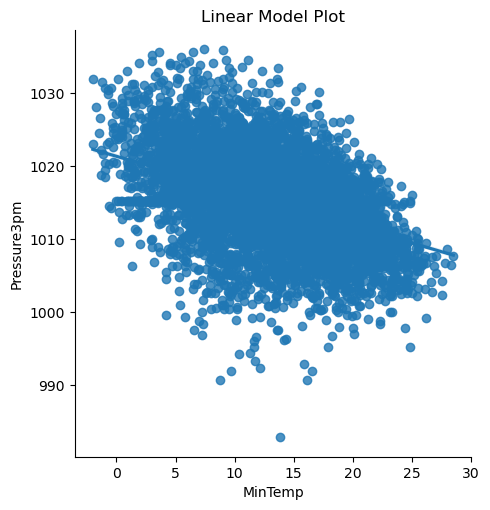

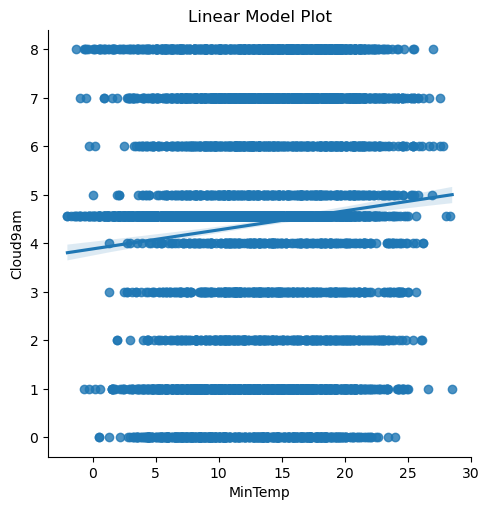

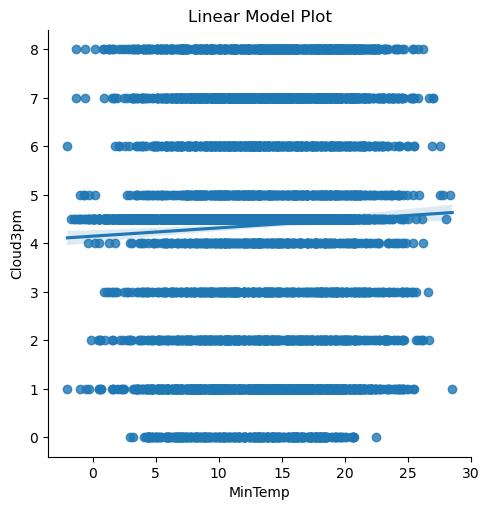

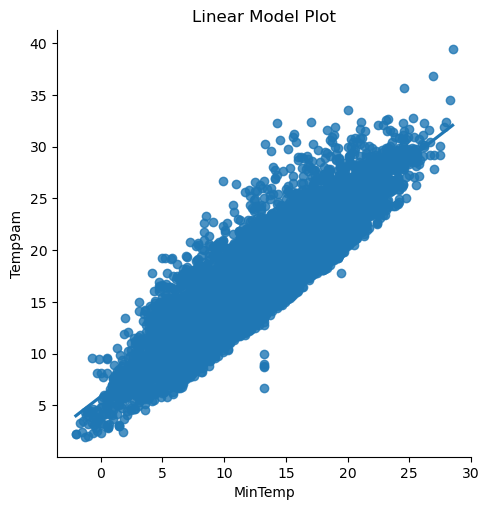

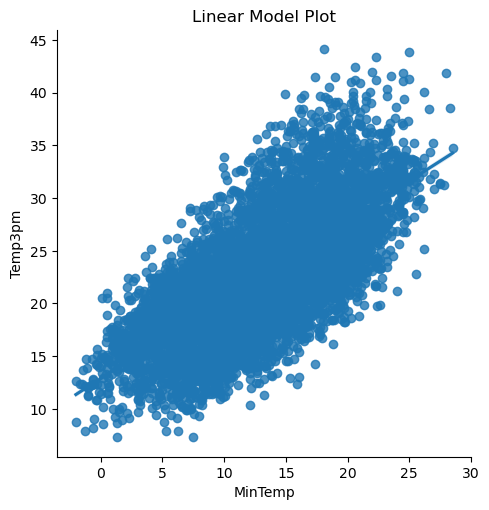

In [25]:
#checking linear relation of 'MinTemp' feature with other features 
log.append('MinTemp')#Appending feature
re()#calling function

**'MinTemp'** feature has **low positive linear relation** with **'WindGustSpeed'** feature.    
  
**'MinTemp'** feature has **high positive linear relation** with **'MaxTemp', 'Temp9am' and 'Temp3pm'** features.  
  
**'MinTemp'** feature has **high negative linear relation** with **'Pressure9am' and 'Pressure3pm'** features.  
  
**'MinTemp'** feature has **almost no linear relation** with other remaining columns.

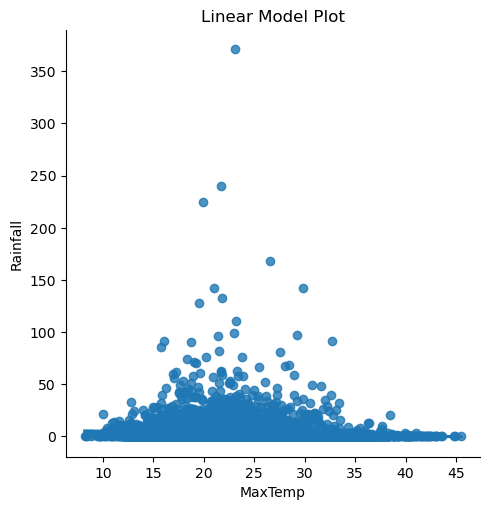

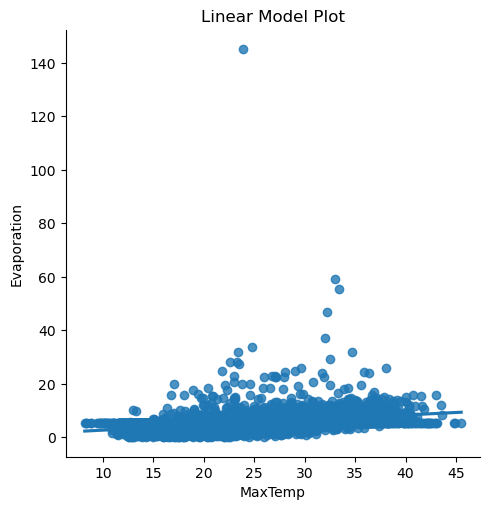

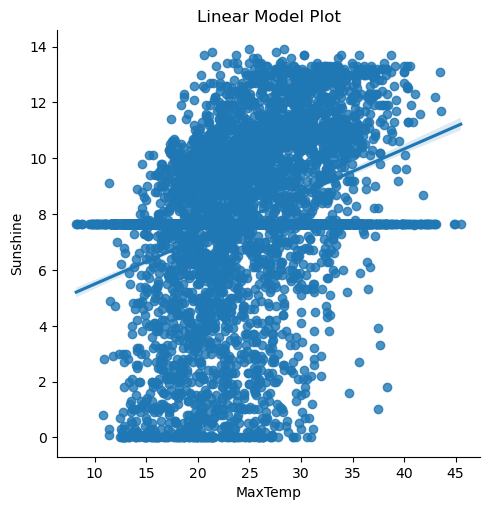

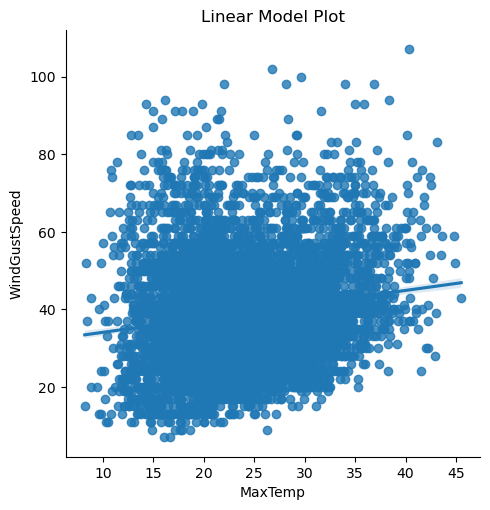

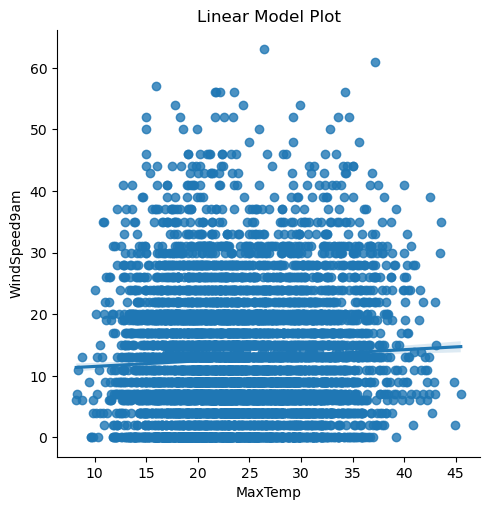

...

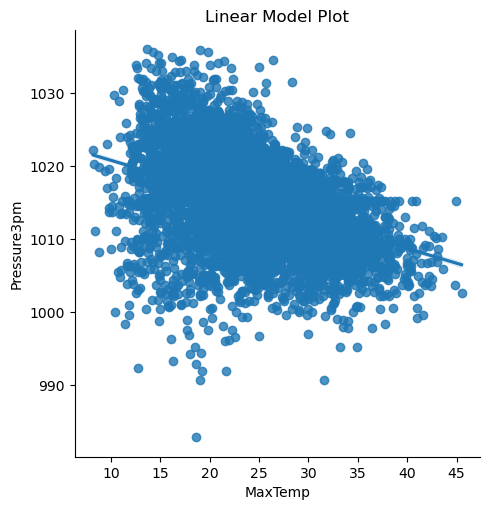

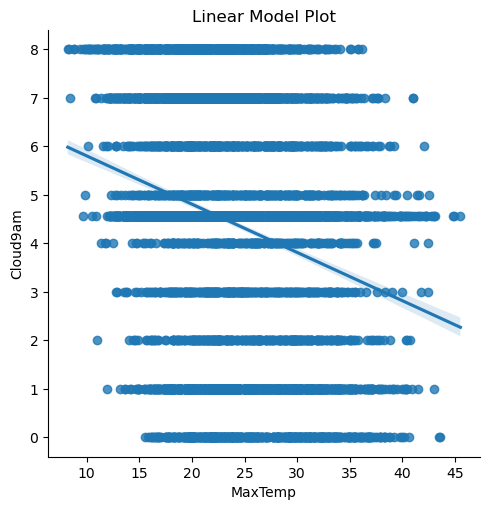

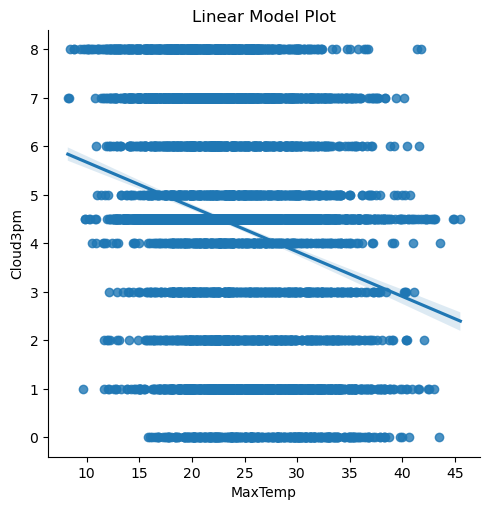

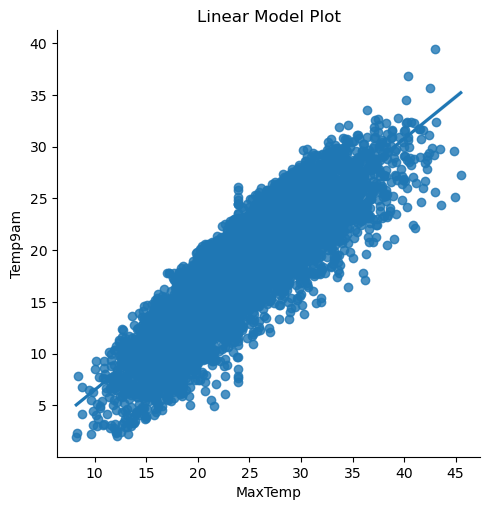

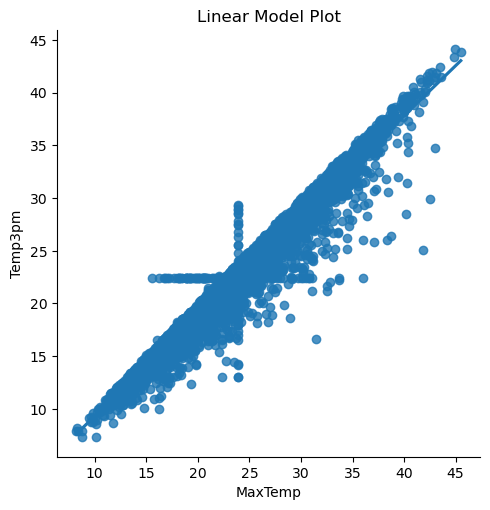

In [26]:
#checking linear relation of 'MaxTemp' feature with other features 
log.append('MaxTemp')#Appending feature
re()#calling function

**'MaxTemp'** feature has **high positive linear relation** with **'Temp9am' and 'Temp3pm'** features.  
  
**'MaxTemp'** feature has **high negative linear relation** with **'Humidity9am', 'Humidity3pm', 'Pressure9am' and 'Pressure3pm'** features.  
  
**'MaxTemp'** feature has **almost no linear relation** with other remaining columns.

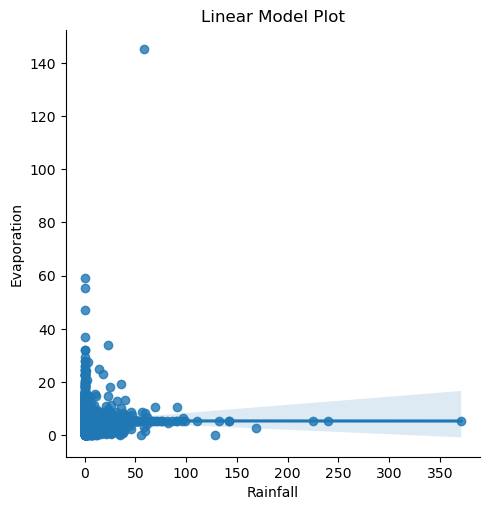

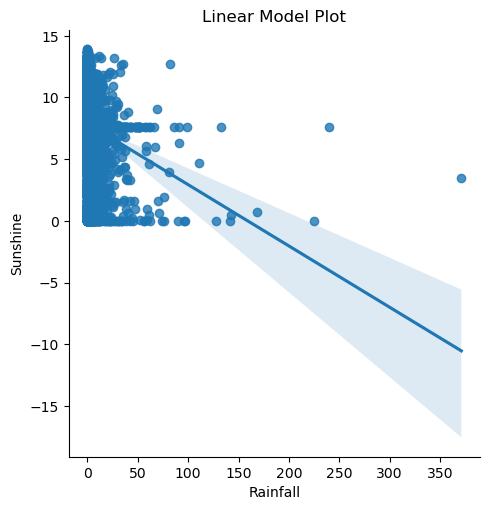

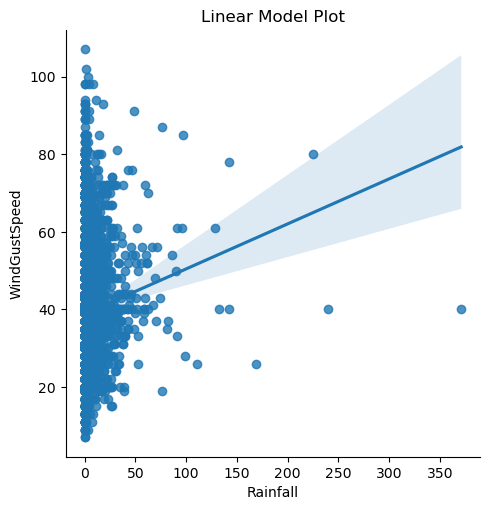

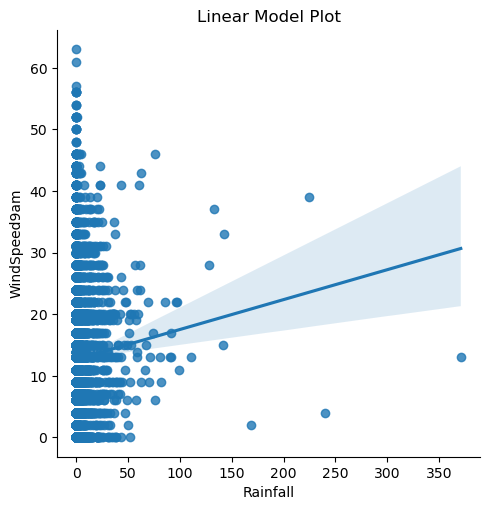

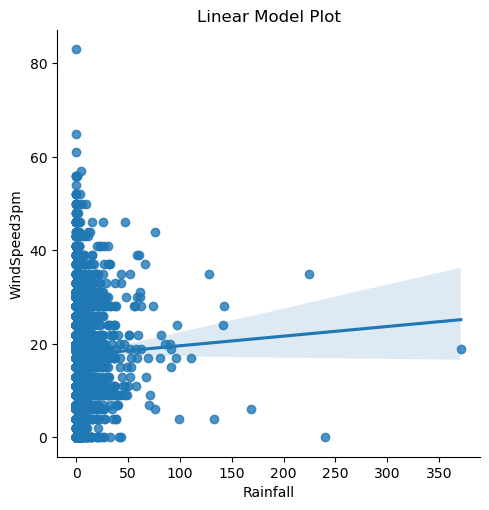

...

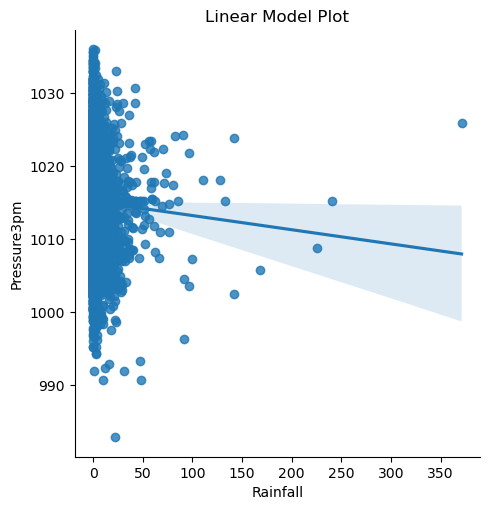

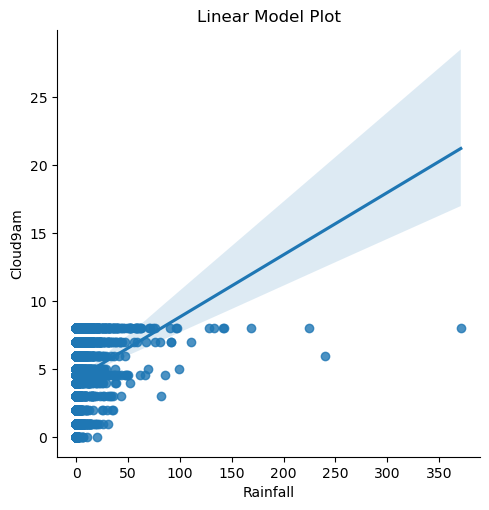

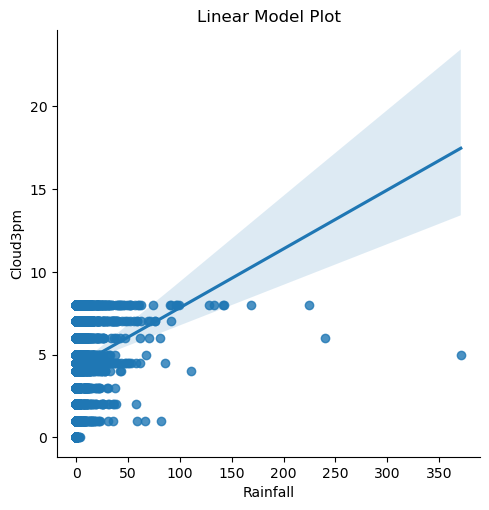

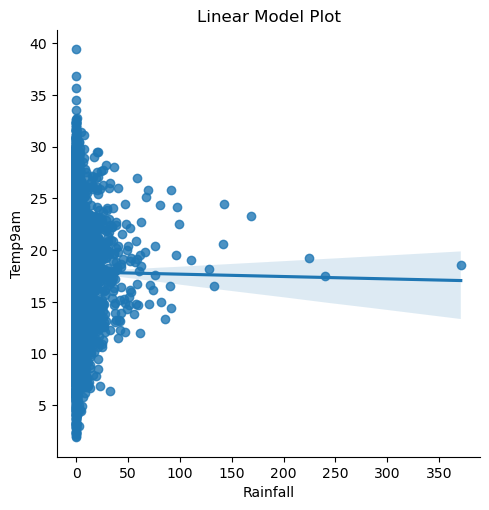

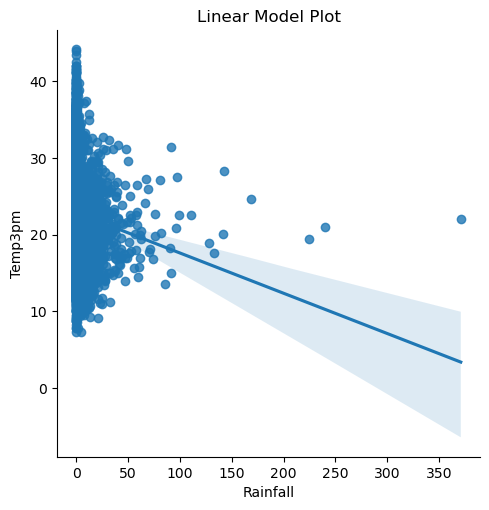

In [27]:
#checking linear relation of 'Rainfall' column with other features 
log.append('Rainfall')#Appending column
re()#calling function

**'Rainfall'** column has **high positive linear relation** with **'Humidity9am', 'Humidity3pm', 'Cloud9am' and 'Cloud3pm'** features.  
  
**'Rainfall'** column has **high negative linear relation** with **'Temp3pm'** feature.  
  
**'Rainfall'** column has **low negative linear relation** with **'Evaporation', 'WindSpeed9am' and 'WindSpeed3pm'** features.  
    
**'Rainfall'** column has **almost no linear relation** with other remaining columns.

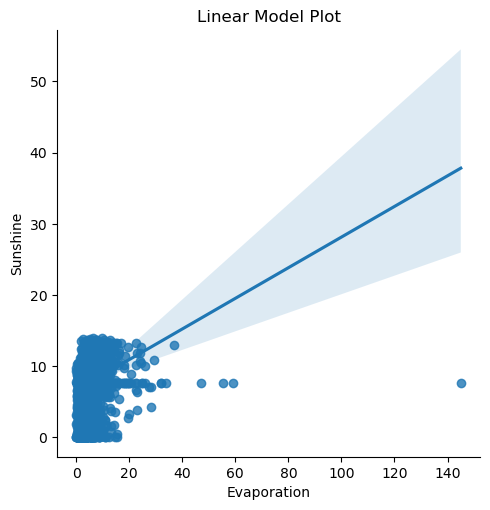

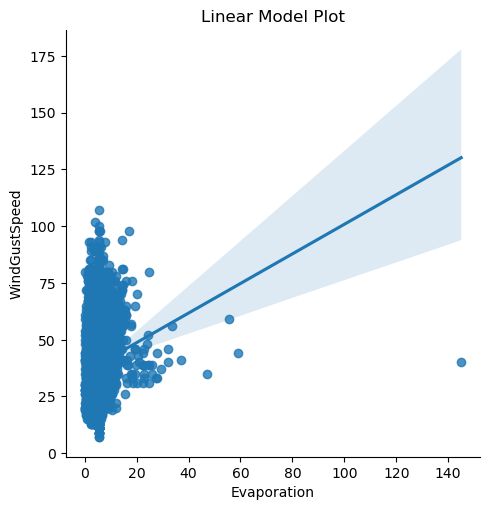

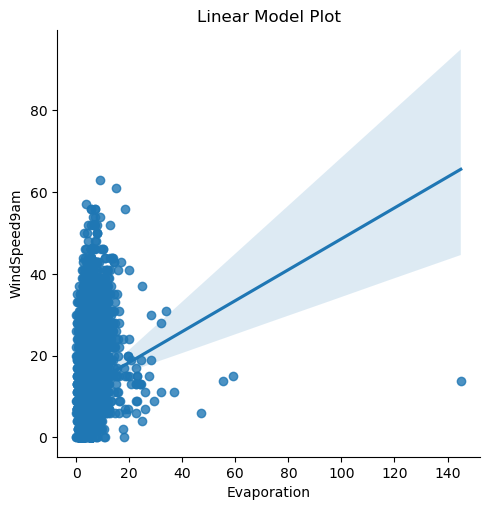

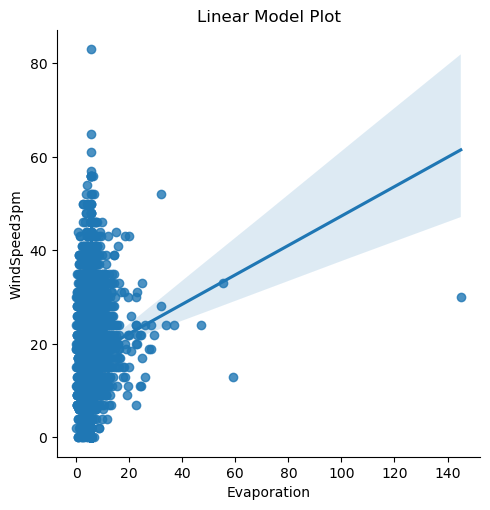

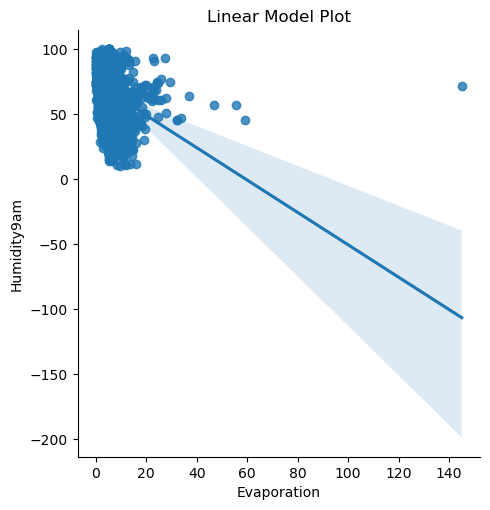

...

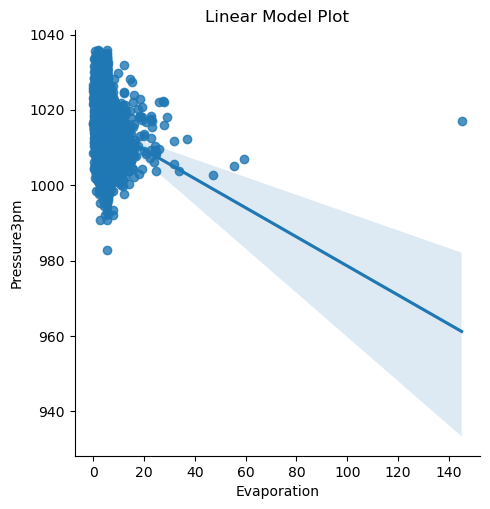

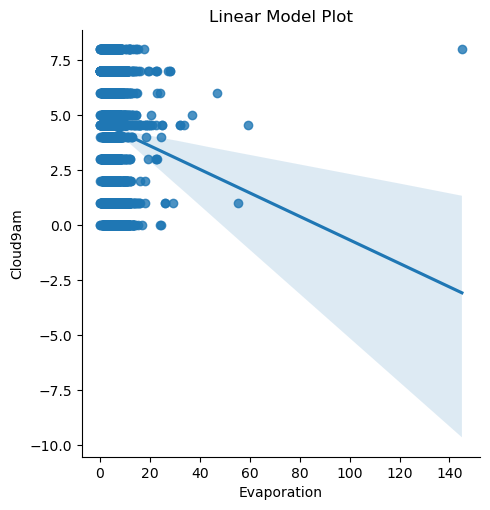

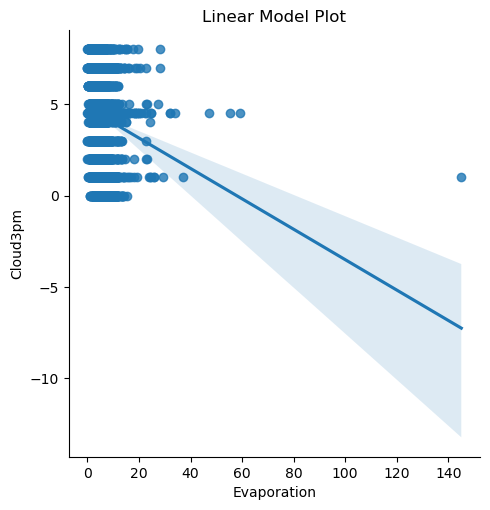

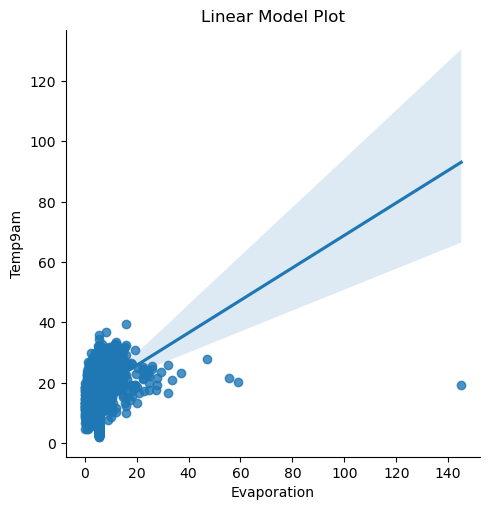

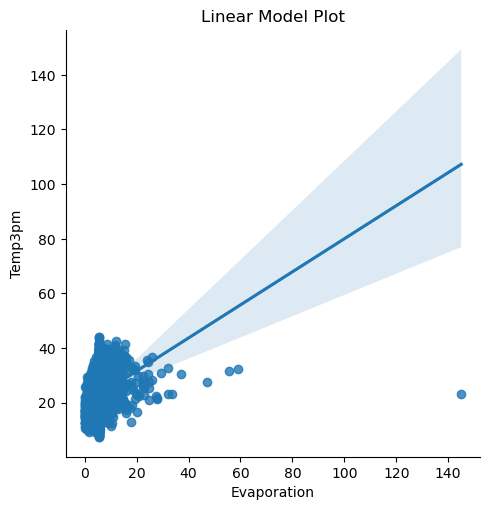

In [28]:
#checking linear relation of 'Evaporation' feature with other features 
log.append('Evaporation')#Appending feature
re()#calling function

**'Evaporation'** feature has **high positive linear relation** with **'Sunshine', 'Temp9am' and 'Temp3pm'** features.  
   
**'Evaporation'** feature has **almost no linear relation** with other remaining features.

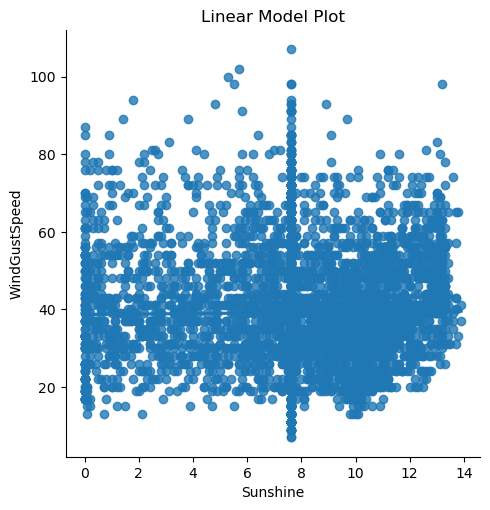

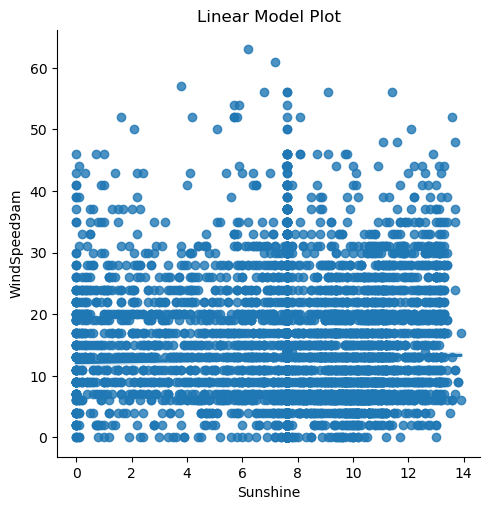

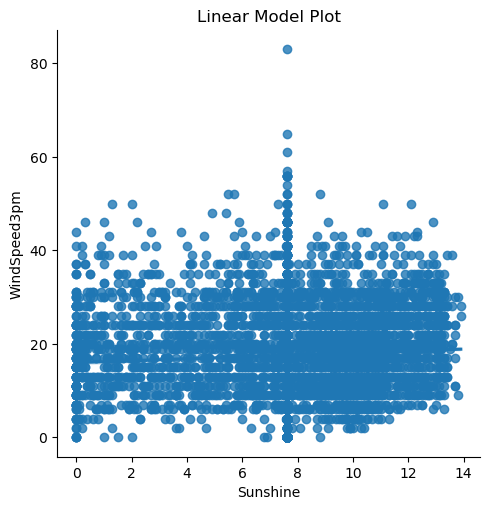

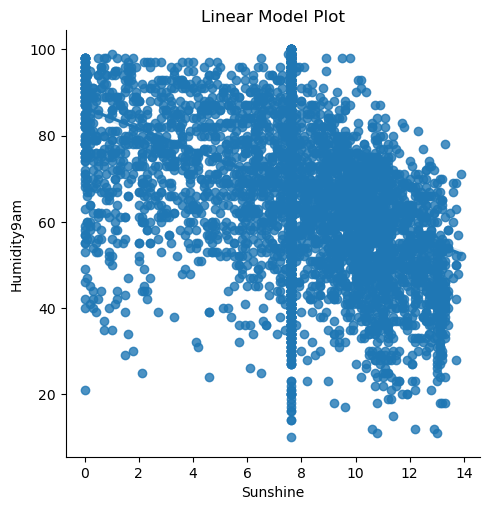

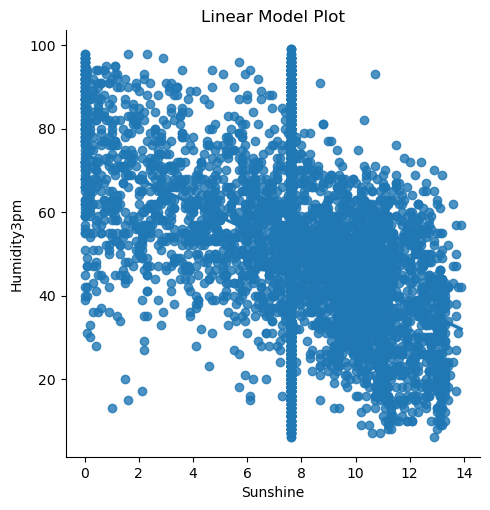

...

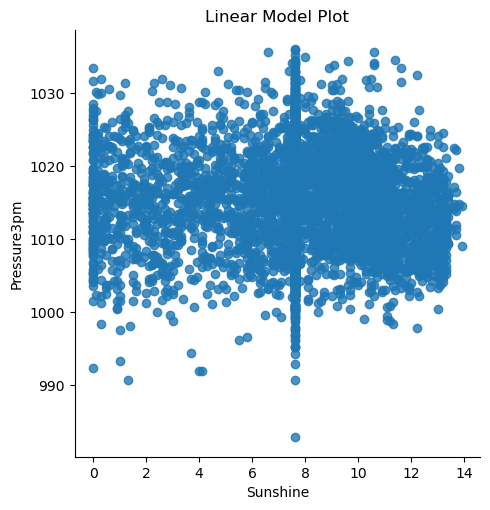

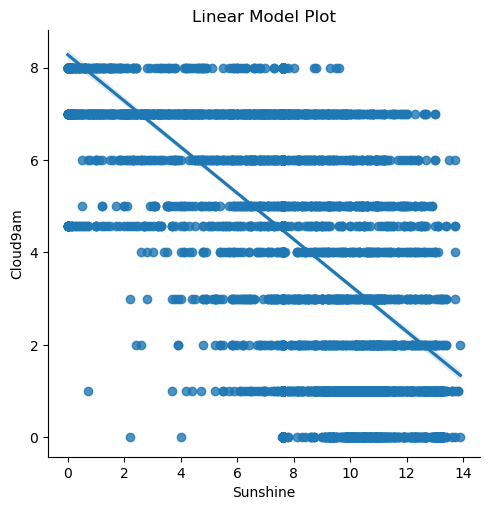

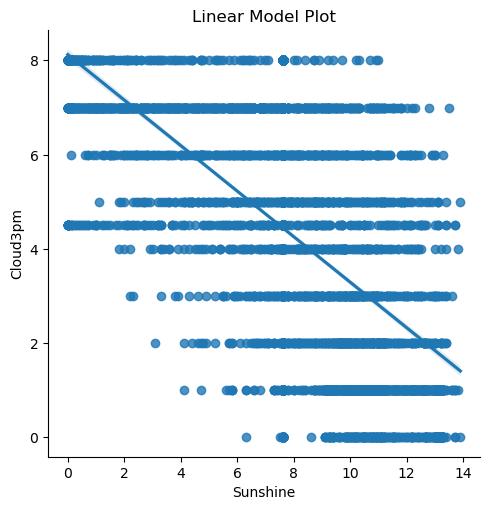

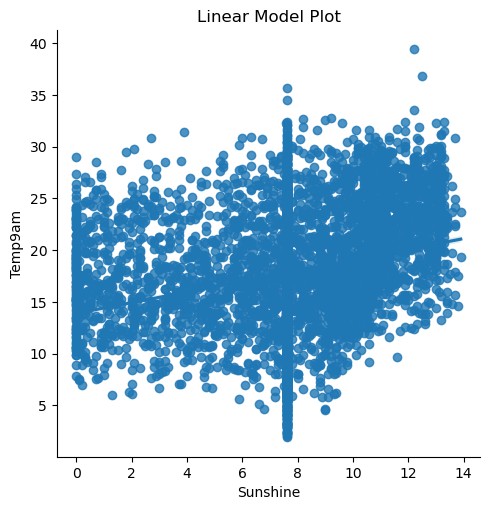

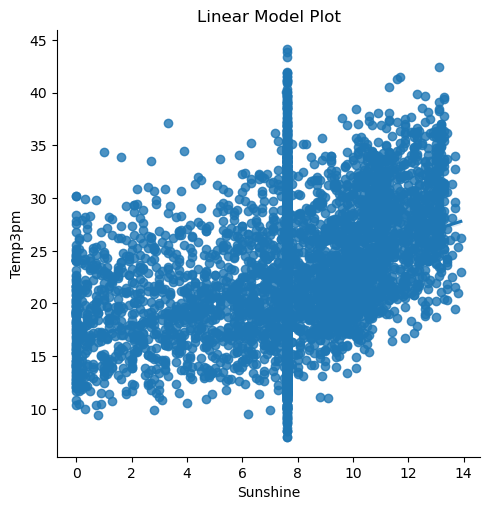

In [29]:
#checking linear relation of 'Sunshine' feature with other features 
log.append('Sunshine')#Appending feature
re()#calling function


**'Sunshine'** feature has **high positive linear relation** with **'Temp3pm'** feature.  
  
**'Sunshine'** feature has **high negative linear relation** with **'Humidity9am' and 'Humidity3pm'** features.  
  
**'Sunshine'** feature has **almost no linear relation** with other remaining features.

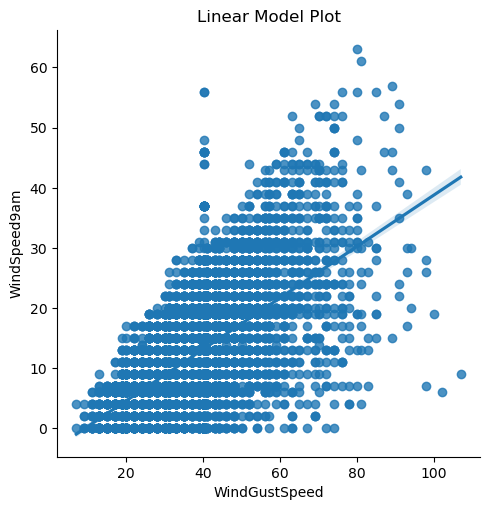

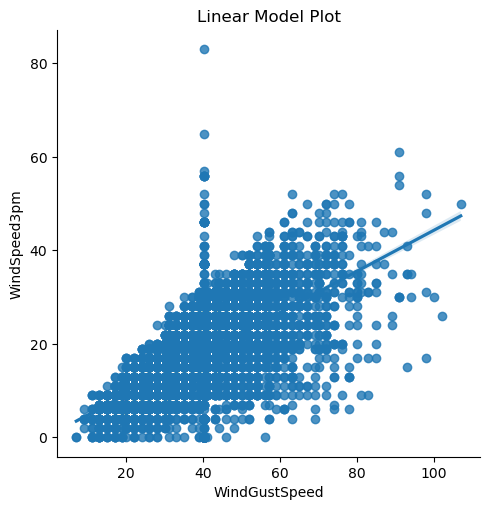

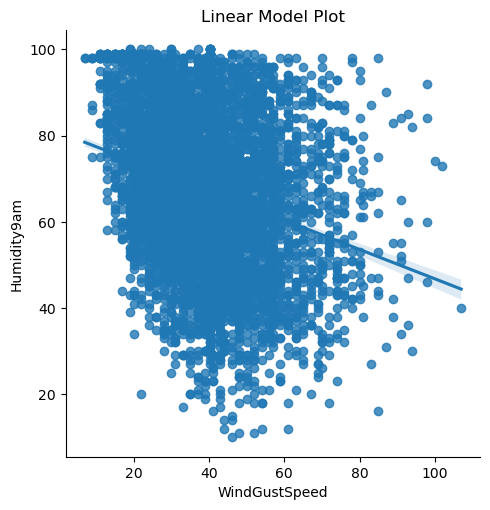

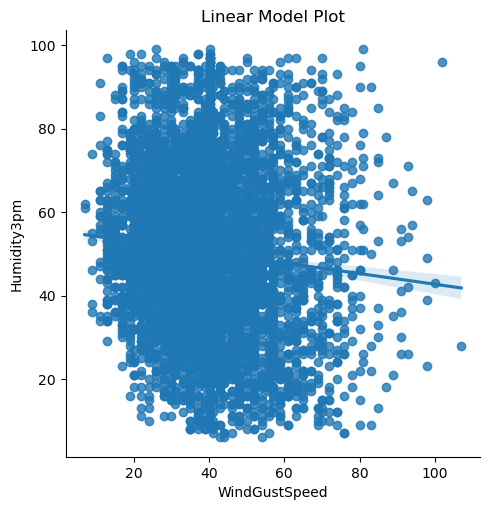

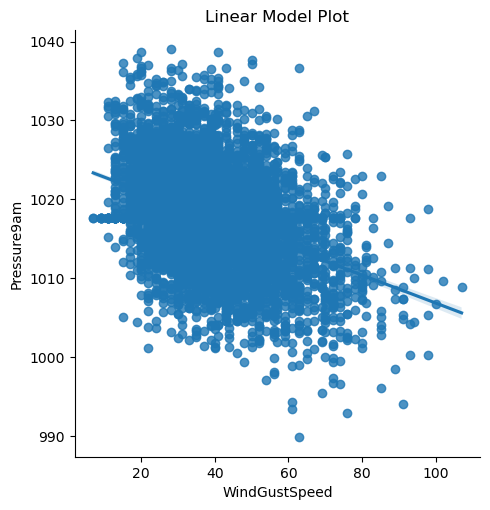

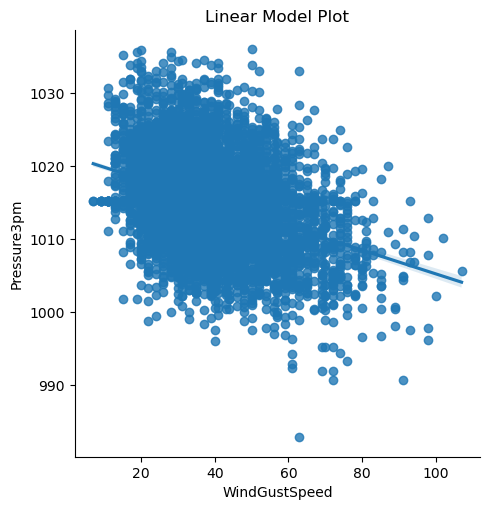

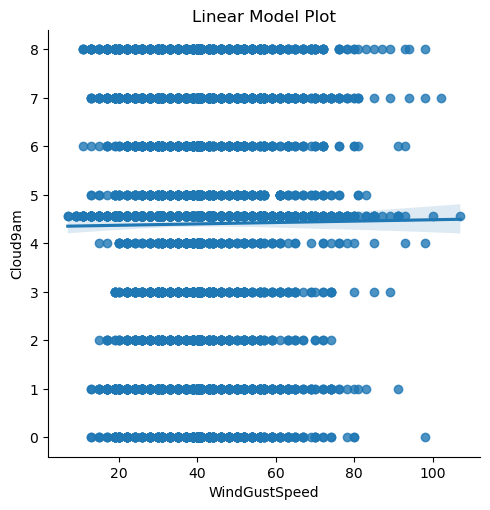

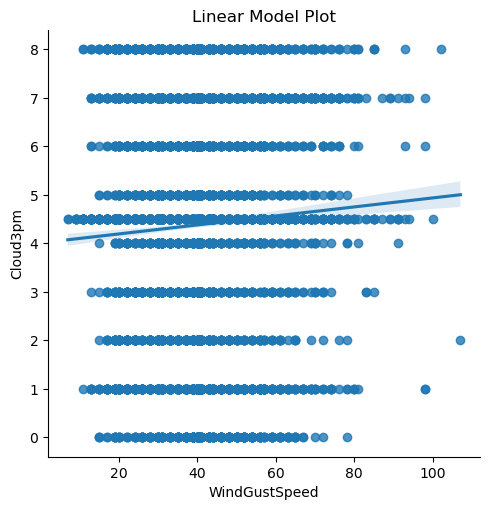

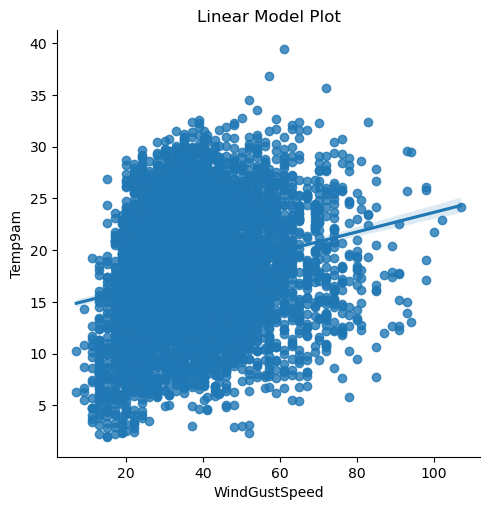

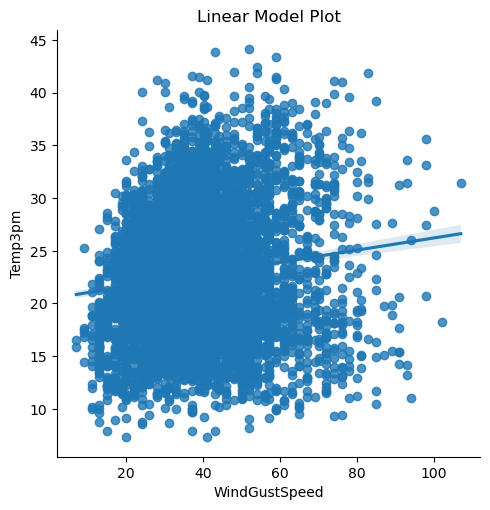

In [30]:
#checking linear relation of 'WindGustSpeed' feature with other features 
log.append('WindGustSpeed')#Appending feature
re()#calling function

**'WindGustSpeed'** feature has **high positive linear relation** with **'WindSpeed9am', 'WindSpeed3pm', 'Temp9am' and 'Temp3pm'** features.  
  
**'WindGustSpeed'** feature has **high negative linear relation** with **'Humidity9am', 'Pressure9am' and  'Pressure3pm'** features.  
  
**'WindGustSpeed'** feature has **almost no linear relation** with other remaining features.

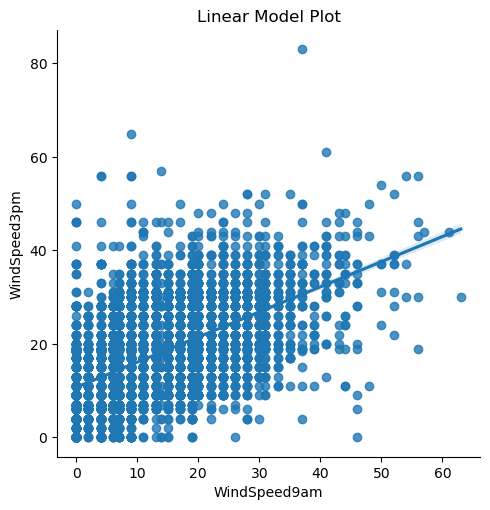

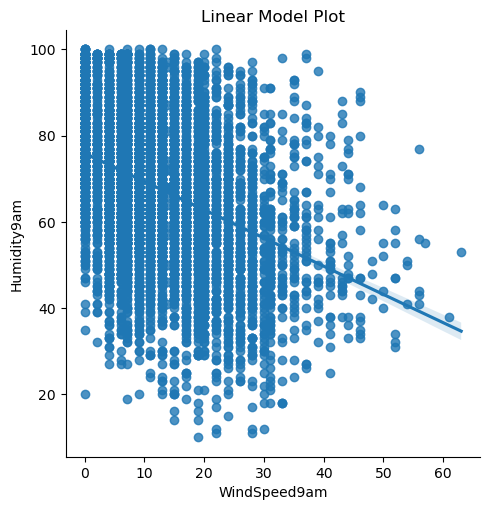

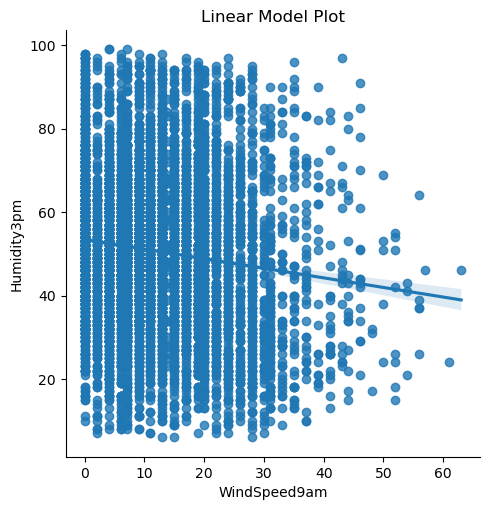

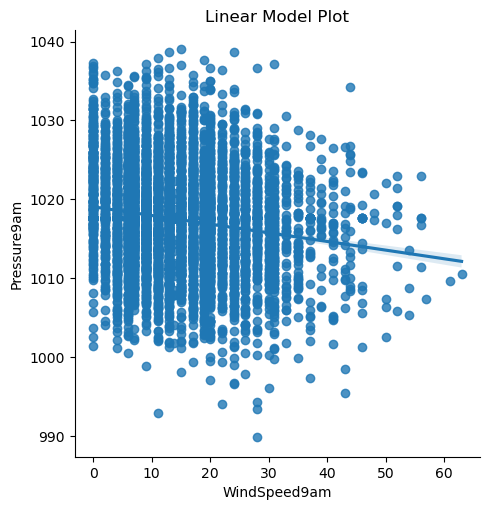

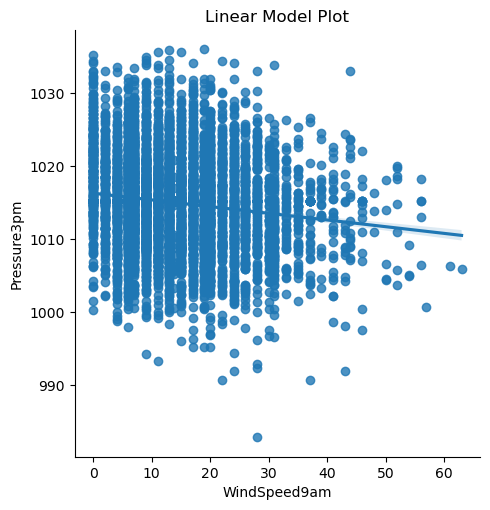

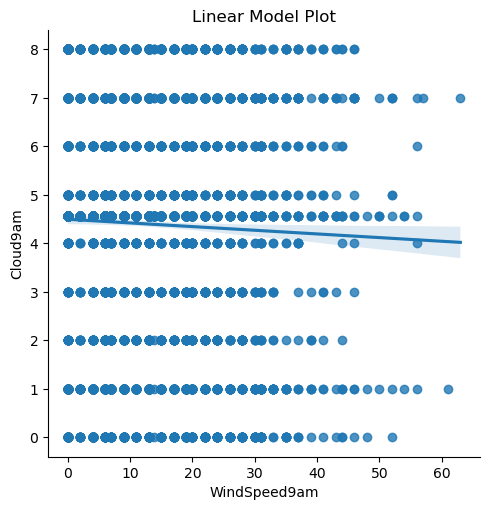

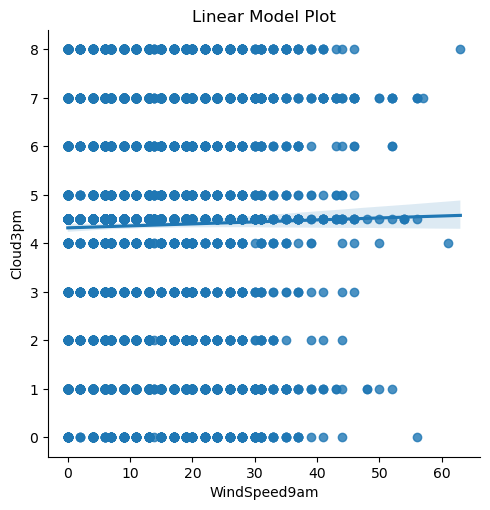

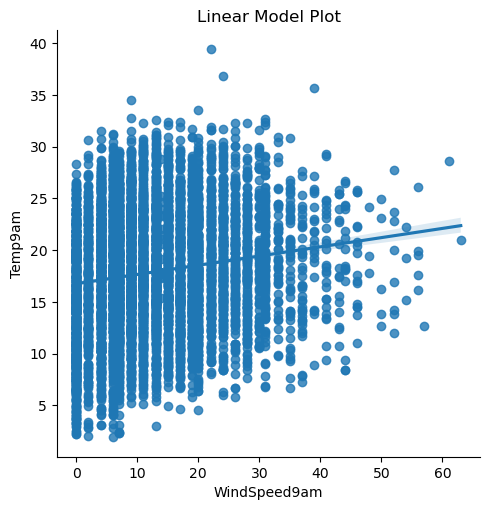

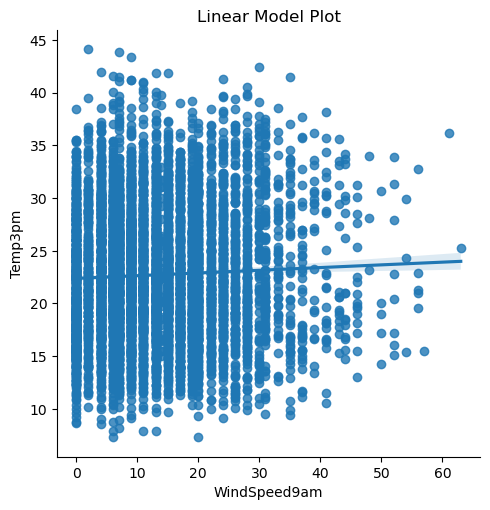

In [31]:
#checking linear relation of 'WindSpeed9am' feature with other features 
log.append('WindSpeed9am')#Appending feature
re()#calling function

**'WindSpeed9am'** feature has **high positive linear relation** with **'WindSpeed3pm' and 'Humidity9am'** features.  
  
**'WindSpeed9am'** feature has **high negative linear relation** with **'Humidity9am'** feature.  

**'WindSpeed9am'** feature has **almost no linear relation** with other remaining features.

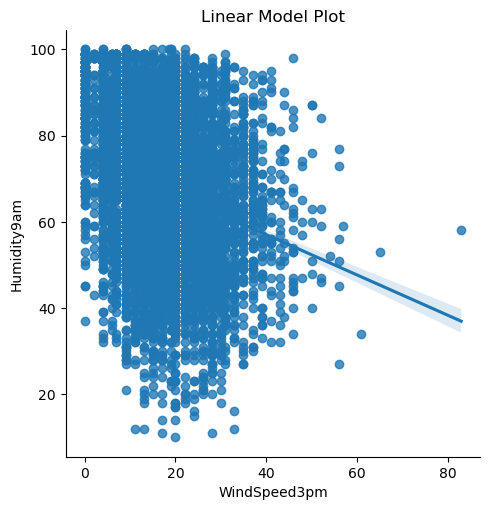

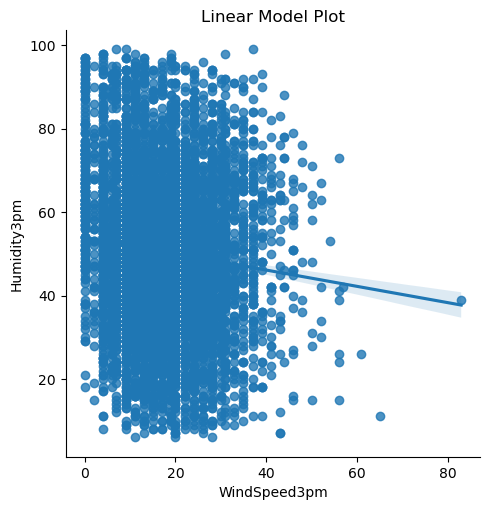

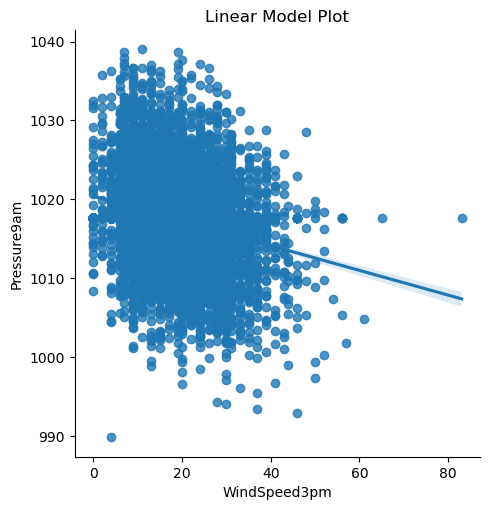

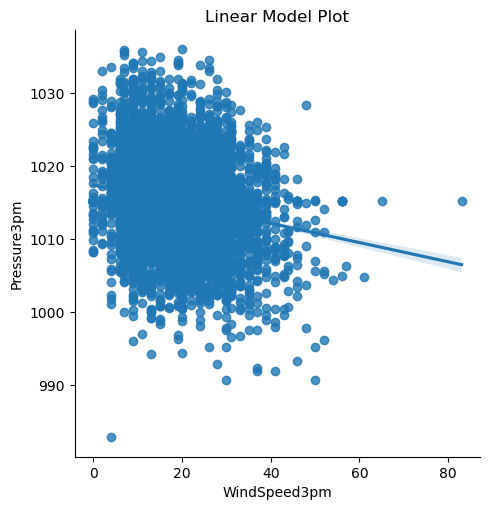

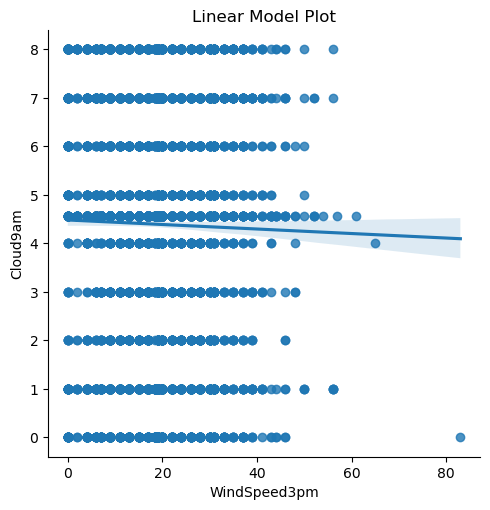

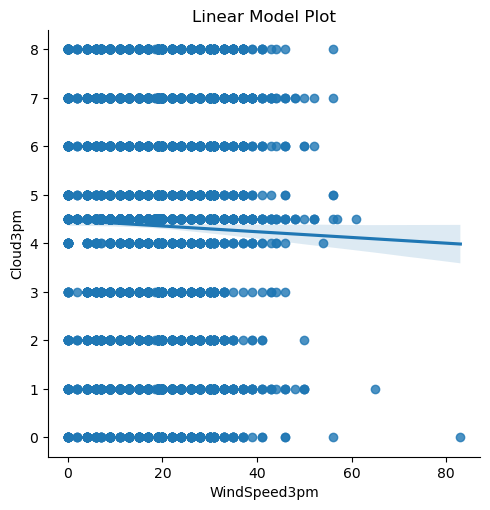

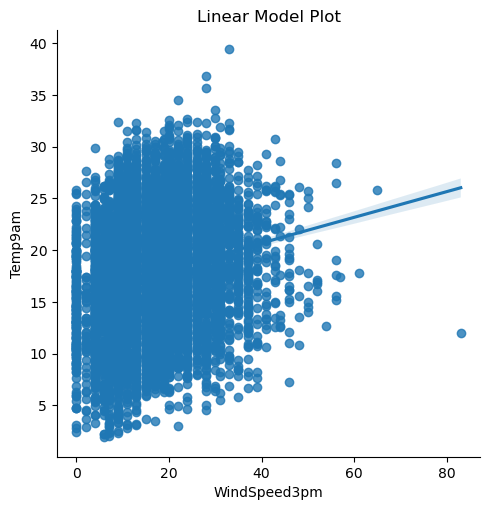

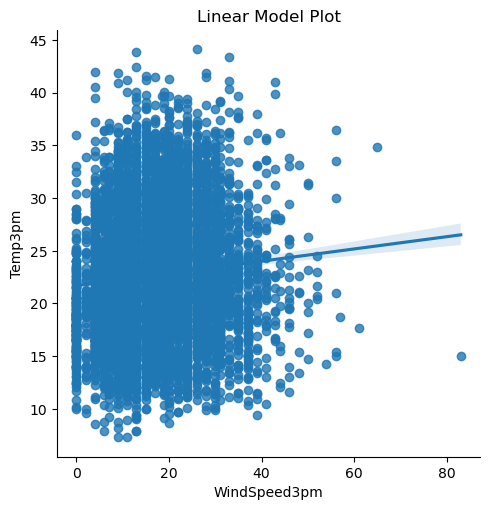

In [32]:
#checking linear relation of 'WindSpeed3pm' feature with other features 
log.append('WindSpeed3pm')#Appending feature
re()#calling function

**'WindSpeed3pm'** column has **low negative linear relation** with **'Humidity9am'** feature. 
    
**'WindSpeed3pm'** column has **almost no linear relation** with other remaining features.

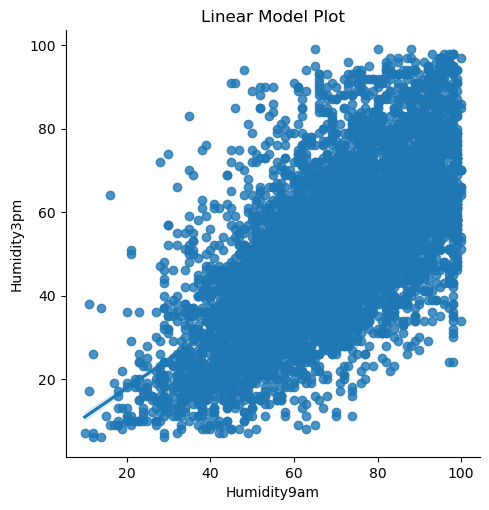

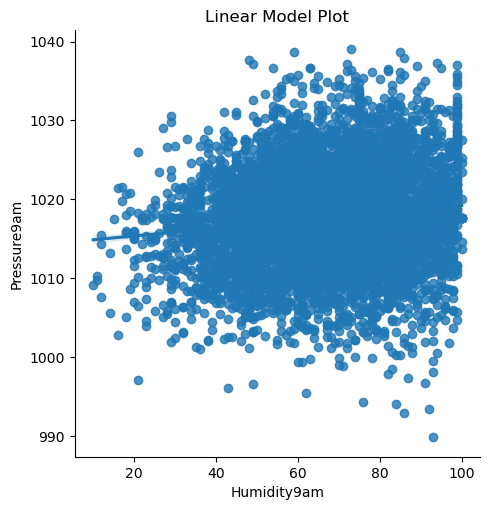

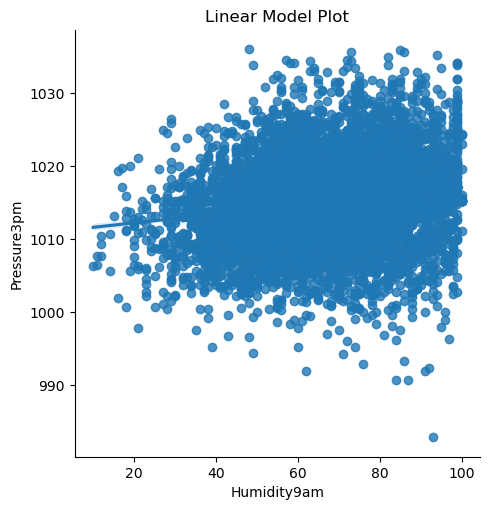

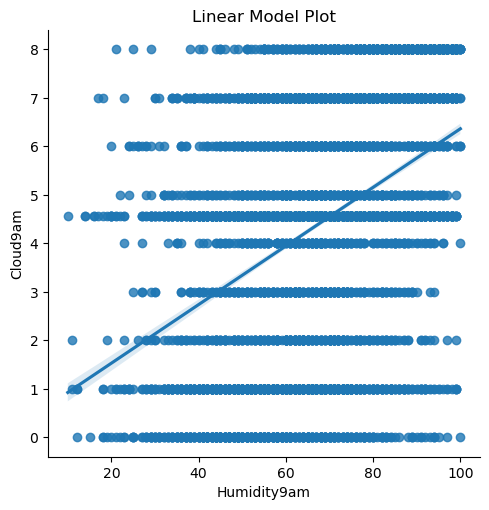

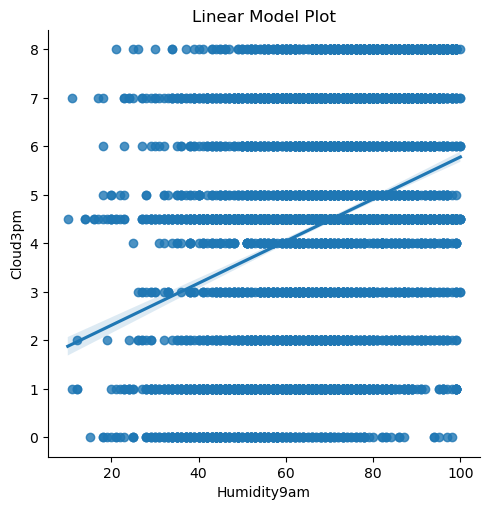

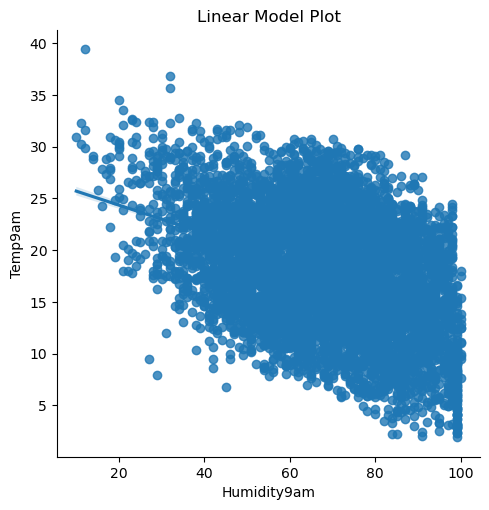

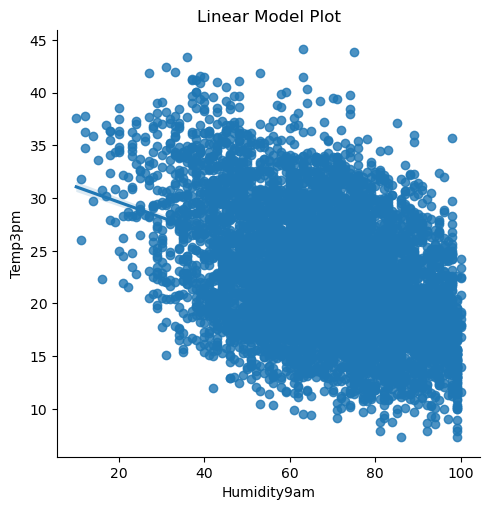

In [33]:
#checking linear relation of 'Humidity9am' feature with other features 
log.append('Humidity9am')#Appending feature
re()#calling function

**'Humidity9am'** feature has **high positive linear relation** with **'Humidity3pm'** features.  
  
**'Humidity9am'** feature has **high negative linear relation** with **'Temp9am' and 'Temp3pm'** features.  
  
**'Humidity9am'** feature has **almost no linear relation** with other remaining features.

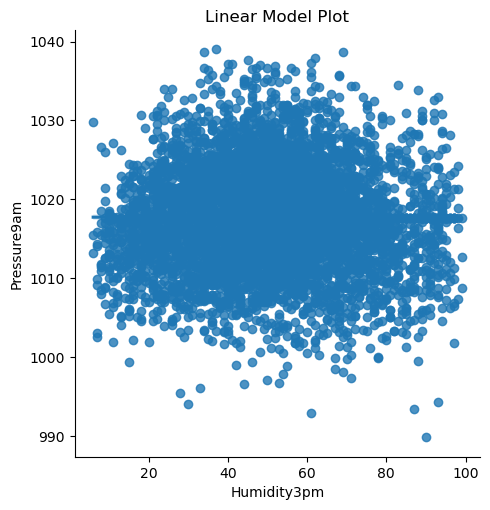

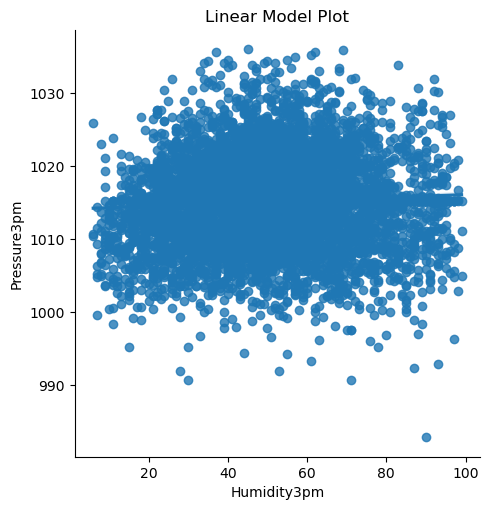

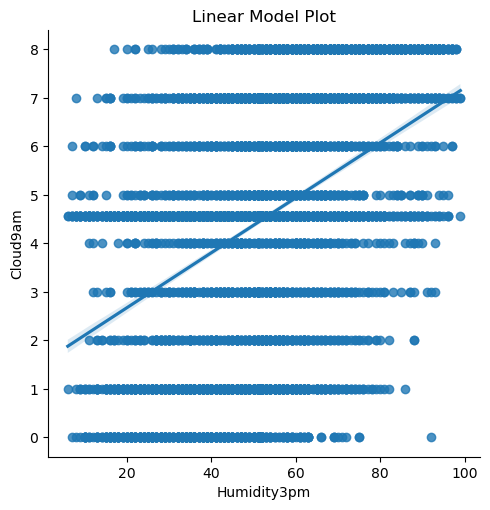

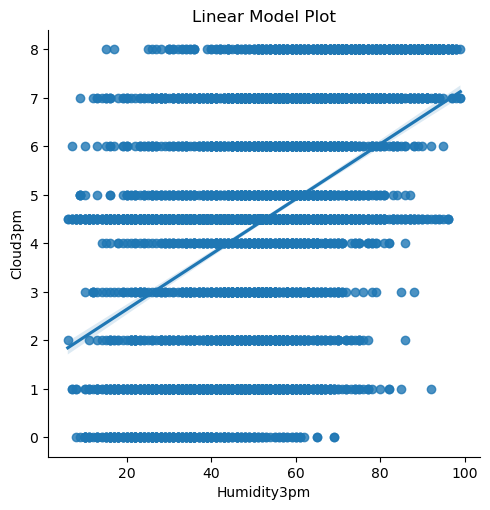

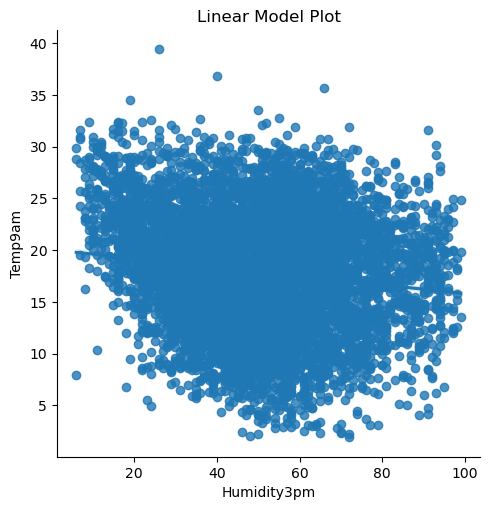

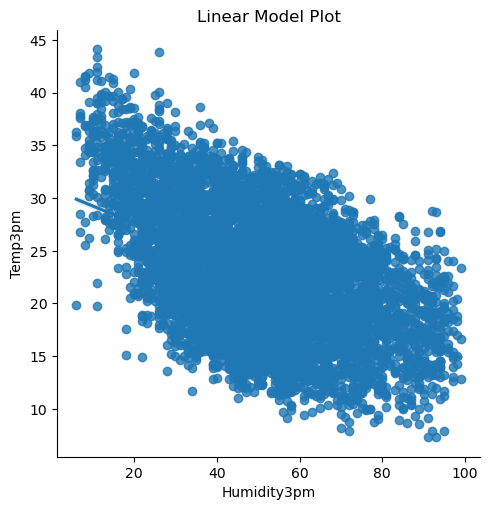

In [34]:
#checking linear relation of 'Humidity3pm' feature with other features 
log.append('Humidity3pm')#Appending feature
re()#calling function

**'Humidity3pm'** feature has **high negative linear relation** with **'Temp3pm' and 'Temp9am'** feature.  
  
**'Humidity3pm'** feature has **almost no linear relation** with other remaining columns.

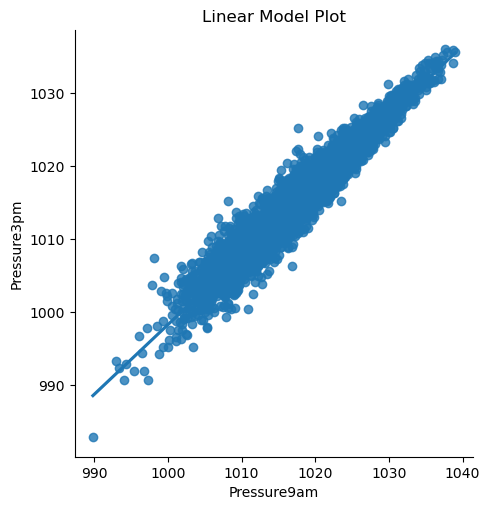

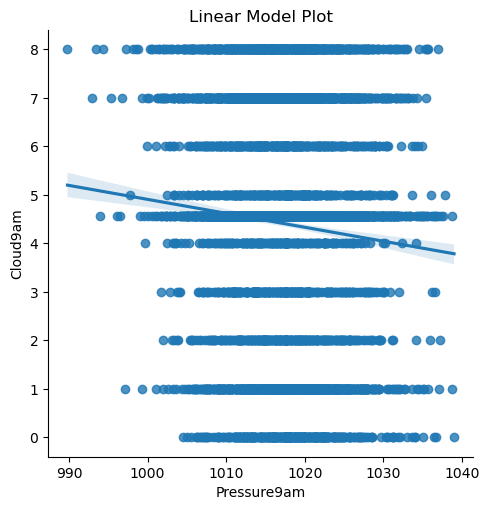

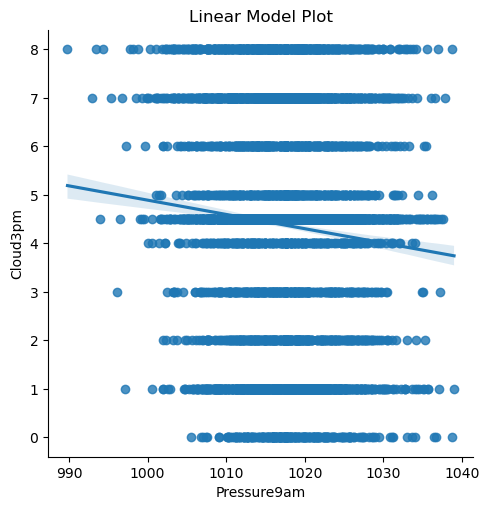

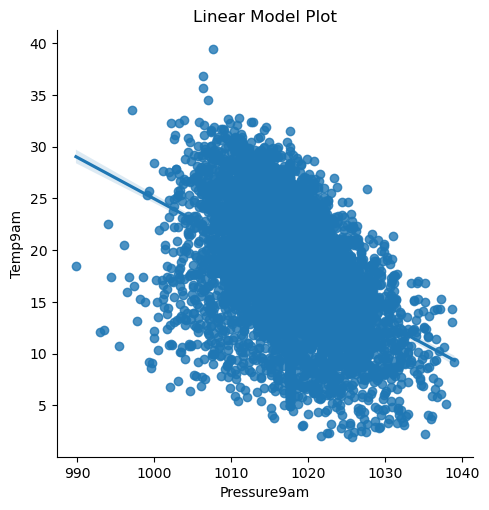

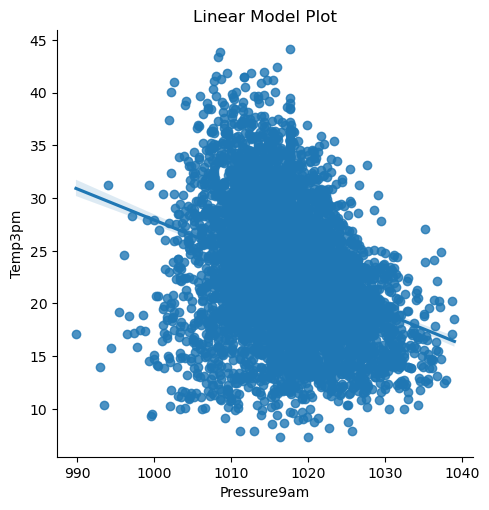

In [35]:
#checking linear relation of 'Pressure9am' feature with other features 
log.append('Pressure9am')#Appending feature
re()#calling function

**'Pressure9am'** column has **high positive linear relation** with **'Pressure3pm'** feature.  
  
**'Pressure9am'** column has **high negative linear relation** with **'Temp9pm' and 'Temp3pm'** features.  
      
**'Pressure9am'** column has **almost no linear relation** with other remaining features.

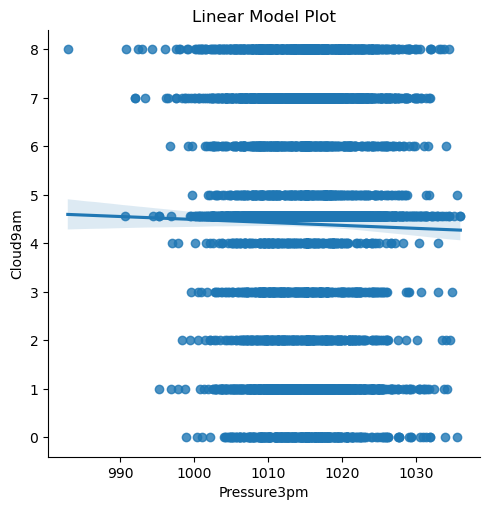

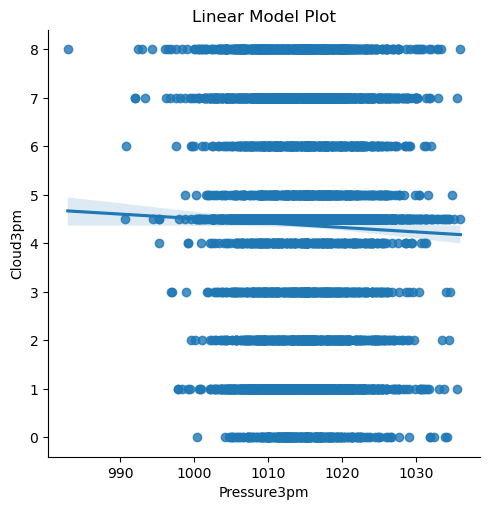

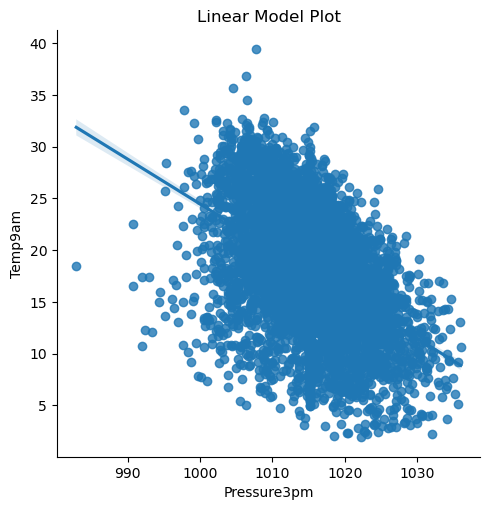

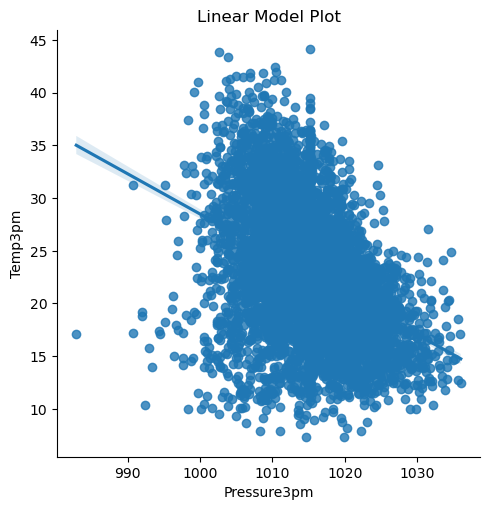

In [36]:
#checking linear relation of 'Pressure3pm' feature with other features 
log.append('Pressure3pm')#Appending feature
re()#calling function

**'Pressure3pm'** column has **high negative linear relation** with **'Temp9am' and 'Temp3pm'** feature.  
  
**'Pressure3pm'** column has **almost no linear relation** with other remaining features.

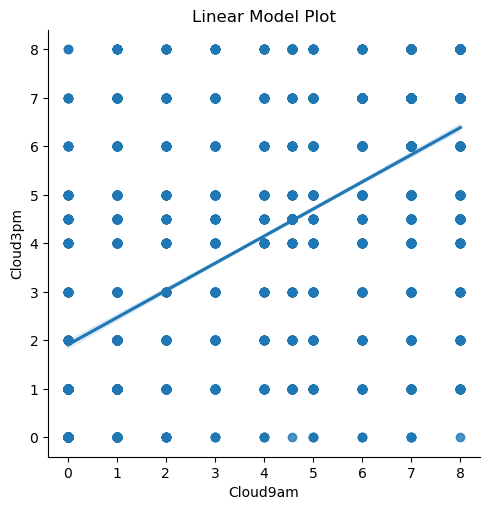

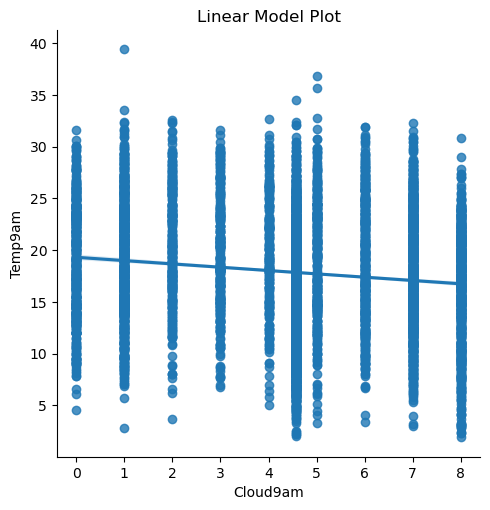

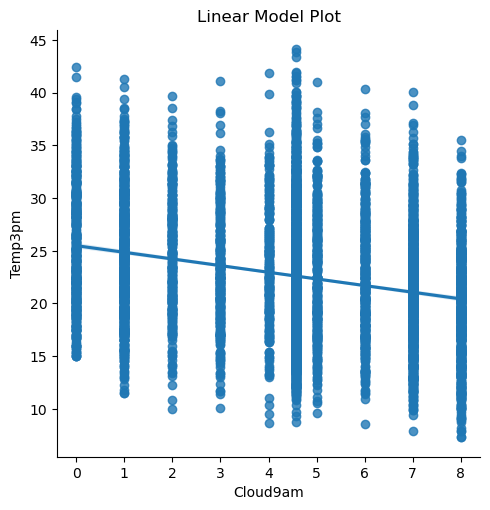

In [37]:
#checking linear relation of 'Cloud9am' feature with other features 
log.append('Cloud9am')#Appending feature
re()#calling function

**'Cloud9am'** column has **almost no linear relation** with other remaining features.

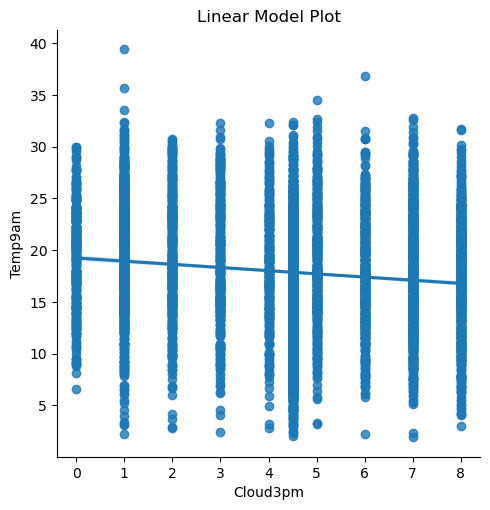

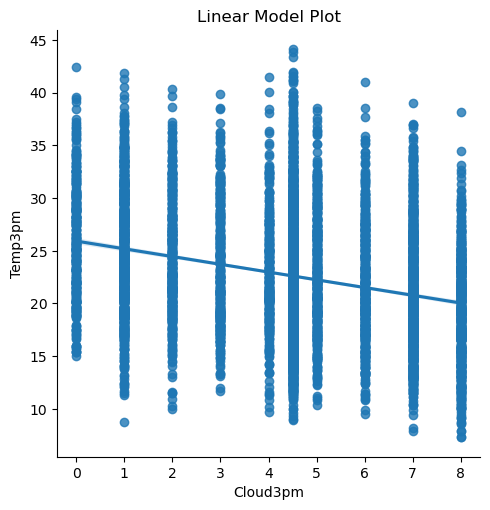

In [38]:
#checking linear relation of 'Cloud3pm' feature with other features 
log.append('Cloud3pm')#Appending feature
re()#calling function

**'Cloud3pm'** feature has **almost no linear relation** with other remaining features.

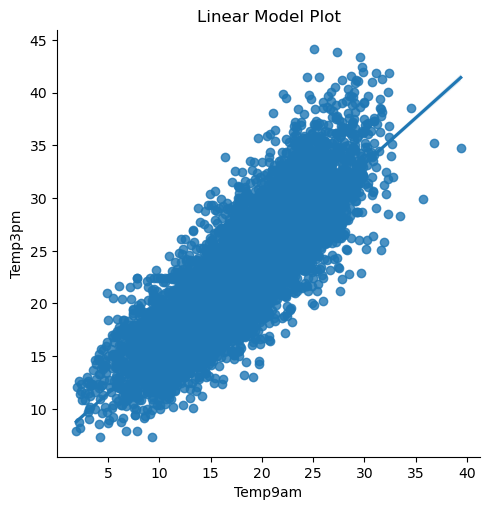

In [39]:
#checking linear relation between 'Temp9am' and  'Temp3pm' features
log.append('Temp9am')#Appending feature
re()#calling function

**'Temp9am' and  'Temp3pm'** features have **high positive linear relation** between them.

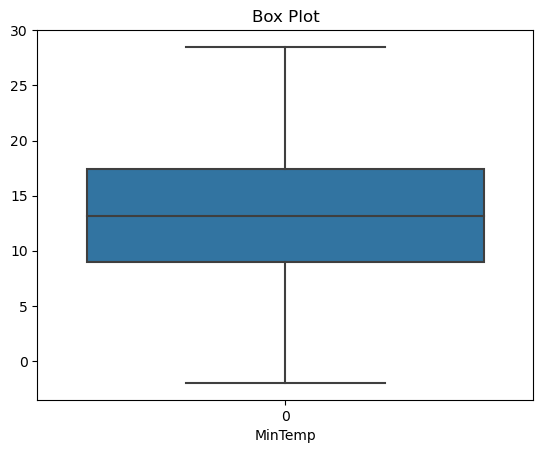

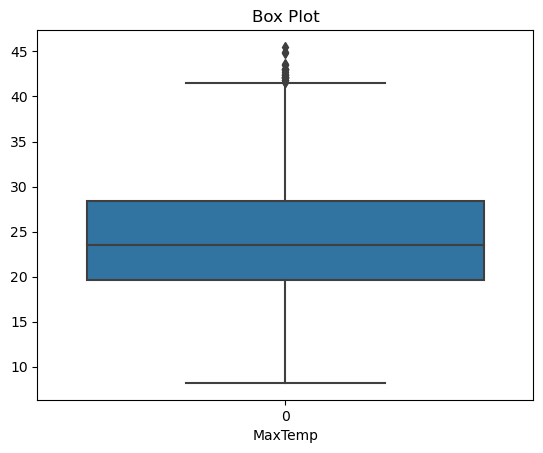

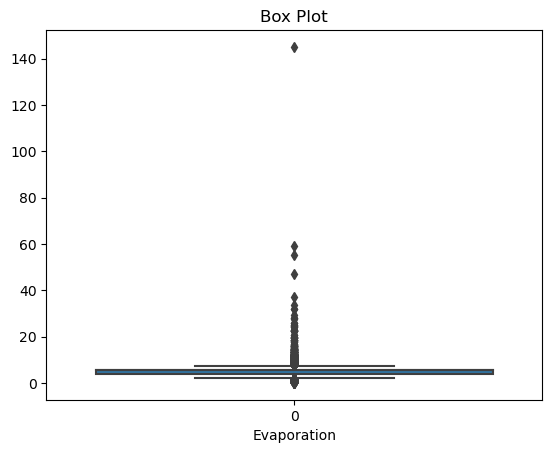

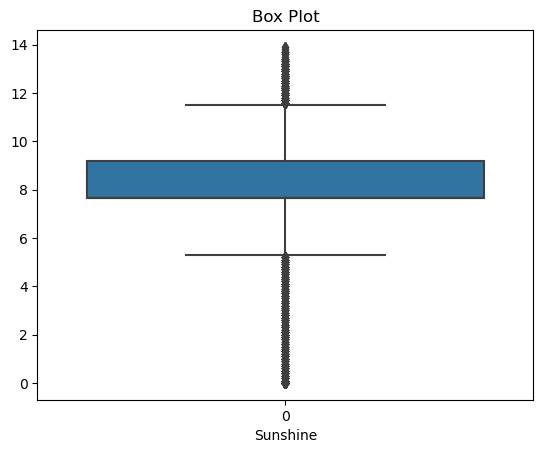

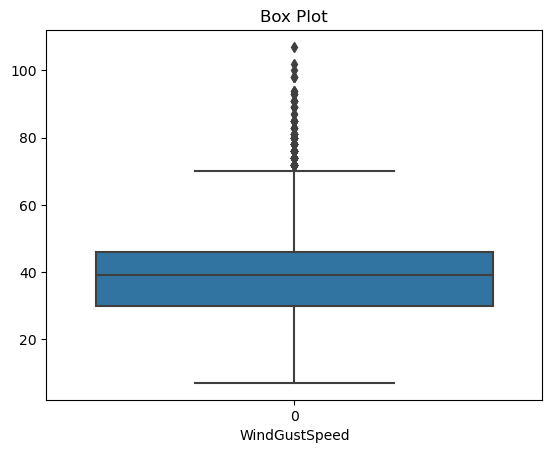

...

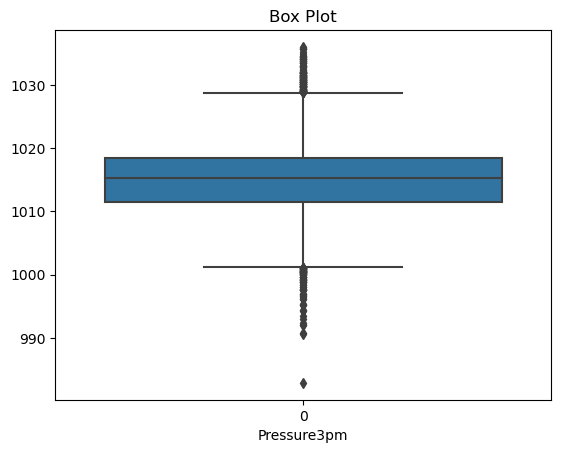

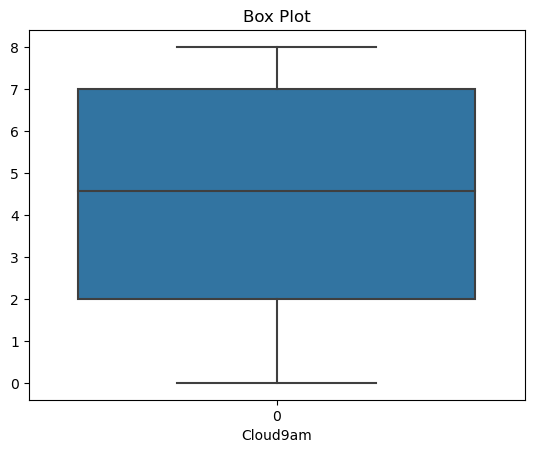

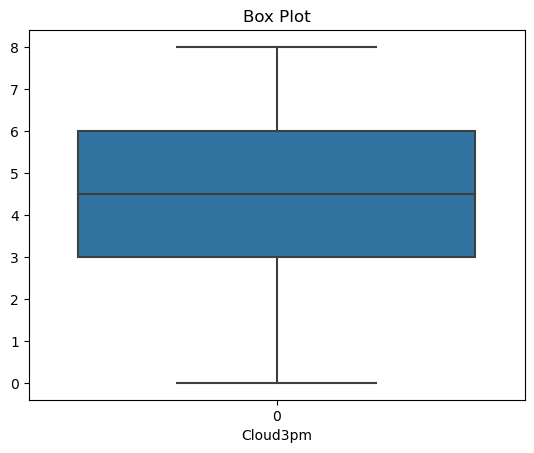

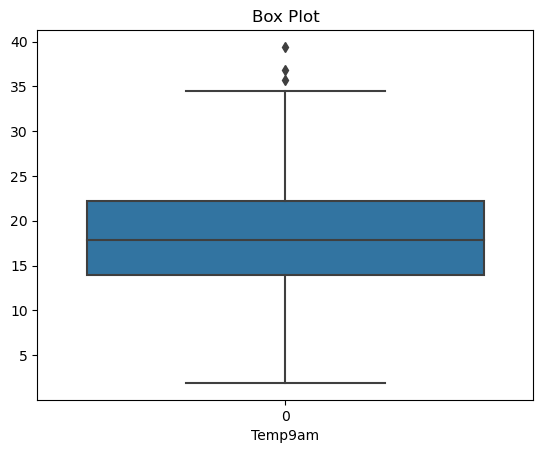

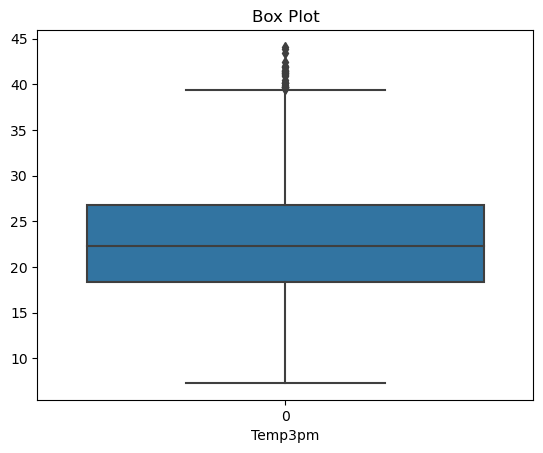

In [40]:
#Checking outliers via Box Plot
out=list(num_c)#creating new list with same data as 'num_c'

out.remove('Rainfall')#removing column from the list

for i in out:
    sb.boxplot(df[i])
    plt.xlabel(i)
    plt.title('Box Plot')
    plt.show()

**All of these features** contains outliers **except** for **'MinTemp', 'Cloud9am' and 'Cloud3pm'** features.

In [41]:
out.remove('MinTemp')#removing 'MinTemp' feature from the list
out.remove('Cloud9am')#removing 'Cloud9am' feature from the list
out.remove('Cloud3pm')#removing 'Cloud3pm' feature from the list

#removing outliers using zscore method
#Importing necessary libraries
from scipy.stats import zscore as zs

f_outlier=df[out]
z=np.abs(zs(f_outlier))
z

,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
Date,,,,,,,,,,,,
2008-12-01,0.195170,0.014779,0.049294,0.362850,0.736444,0.671784,0.203179,1.539598,1.647292,1.347736,0.173722,0.151545
2008-12-02,0.163738,0.014779,0.049294,0.362850,0.898312,0.462330,1.368283,1.377411,1.166162,1.230431,0.121292,0.267112
2008-12-03,0.261622,0.014779,0.049294,0.512305,0.634272,0.881238,1.717496,1.107100,1.663883,1.079611,0.542811,0.082903
2008-12-04,0.636844,0.014779,0.049294,1.131708,0.183106,0.899122,1.310080,1.863971,0.004812,0.392542,0.035995,0.635529
2008-12-05,1.338345,0.014779,0.049294,0.138666,0.591796,0.252876,0.843405,0.944913,1.132980,1.532071,0.016434,1.171410
...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,0.113600,0.014779,0.049294,0.608613,0.021238,0.689668,0.960867,1.431473,1.156538,0.864293,1.362117,0.051067
2017-06-22,0.196366,0.014779,0.049294,1.281164,0.021238,0.899122,0.669855,1.593660,0.974040,0.663199,1.222306,0.300604
2017-06-23,0.457390,0.014779,0.049294,0.160246,0.387451,0.899122,0.844462,1.431473,0.559272,0.277770,0.942683,0.568544


The **variable 'z'** holds the **zscores values** of these features.

In [42]:
#checking outliers as per the threshold value as '3'
np.where(z>3)

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
          62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
         381,  405,  406,  407,  466,  466,  563,  567,  568,  568,  569,
         602,  602,  603,  683,  683,  748,  748,  795,  928,  980,  980,
        1189, 1535, 1587, 1644, 1665, 1898, 1903, 1945, 2016, 2028, 2043,
        2074, 2186, 2219, 2219, 2230, 2500, 2505, 2527, 2527, 2827, 2835,
        2849, 2855, 2859, 2863, 2869, 2877, 2883, 2891, 2897, 2900, 2905,
        2911, 2919, 2925, 2933, 2939, 2947, 2953, 2961, 2967, 2975, 2989,
        3027, 3045, 3051, 3055, 3058, 3059, 3059, 3060, 3066, 3067, 3067,
        3067, 3068, 3070, 3082, 3082, 3082, 3089, 3089, 3099, 3099, 3101,
        3141, 3143, 3150, 3153, 3153, 3157, 3157, 3164, 3167, 3169, 3172,
        3172, 3178, 3185, 3192, 3206, 3212, 3212, 3212, 3213, 3221, 3227,
        3234, 3248, 3256, 3260, 3278, 3278, 3280, 3291, 3302, 3302, 3303,
        3360, 3446, 3449, 3449, 3449, 

In [43]:
#checking value of the outliers
z.iloc[8,3]

3.053053245174385

In [44]:
z.iloc[12,8]

3.8704468972704786

In [45]:
z.iloc[12,9]

3.71058425323124

In [46]:
z.iloc[44,0]

3.0839420651839156

We can confirm that these values holds outlier as per the threshold value.

In [47]:
#Removing outliers 
zscore=df[(z<3).all(axis=1)]#storing values in 'zscore' variable

In [48]:
#Using IQR method to remove outliers from the original data frame
q1=f_outlier.quantile(.25)
q3=f_outlier.quantile(.75)
iqr=q3-q1
IQR=df[~((df< (q1-1.5*iqr)) | (df>(q3+1.5*iqr))).any(axis=1)]

In [49]:
print('Data loss percentage after removing outliers via zscore method',((df.shape[0]-zscore.shape[0])/df.shape[0])*100)
print('Data loss percentage after removing outliers via IQR method',((df.shape[0]-IQR.shape[0])/df.shape[0])*100)

Data loss percentage after removing outliers via zscore method 3.9781129843241643
Data loss percentage after removing outliers via IQR method 35.96569062407572


We can observe that **zscore method performed well** than IQR method, hence, we will **update** the data frame with **zscore method.**

In [50]:
outliers=df.shape[0]-zscore.shape[0]#storing number of outliers removed in 'outliers' variable

print(f'Outliers removed : {outliers}')#printing
df=zscore#Updating data frame

Outliers removed : 269


In [51]:
df.shape#checking shape of data frame

(6493, 22)

Now the data frame has **6493 rows.**

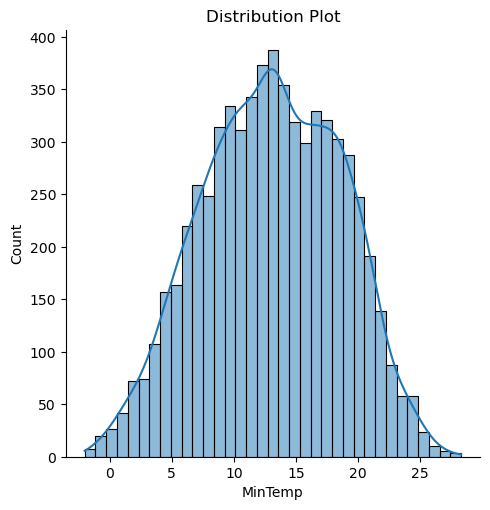

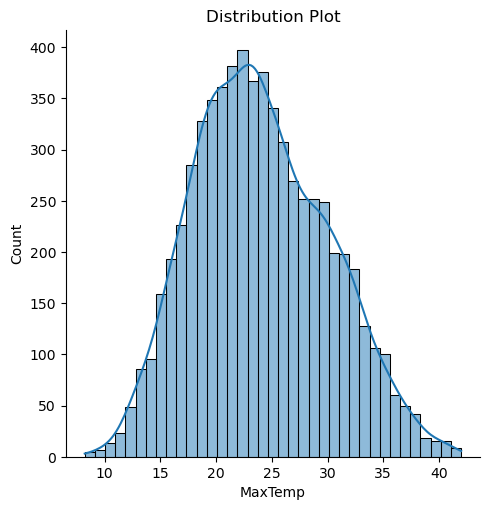

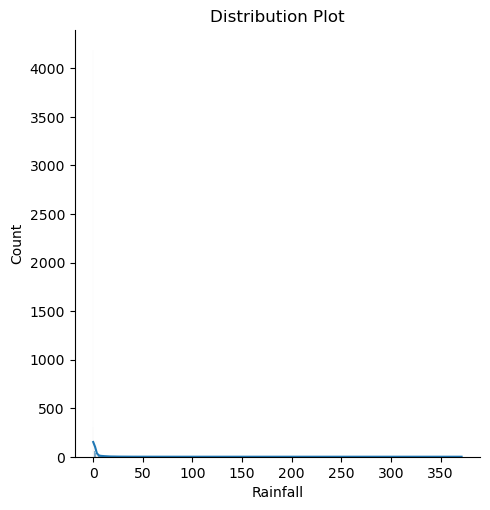

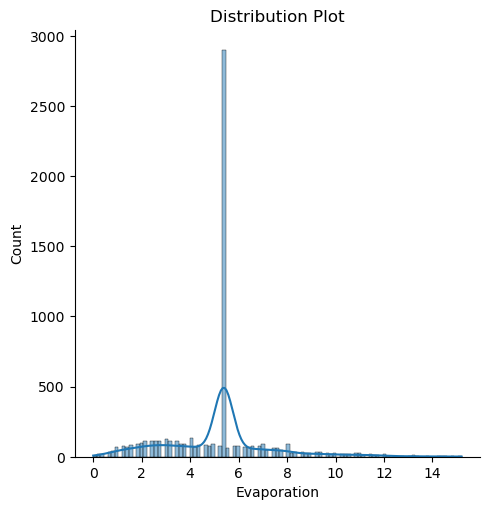

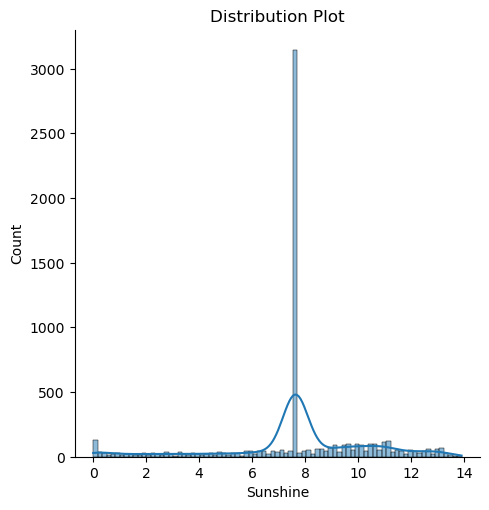

...

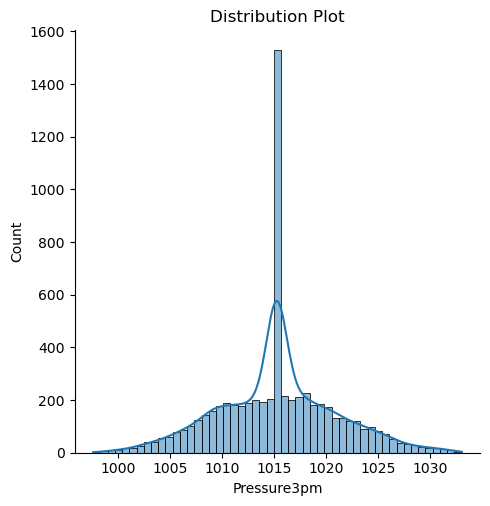

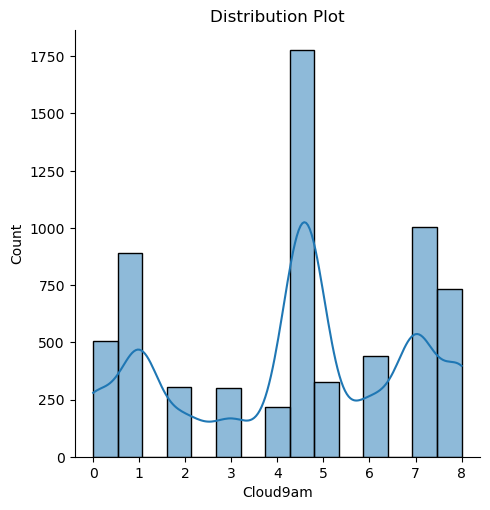

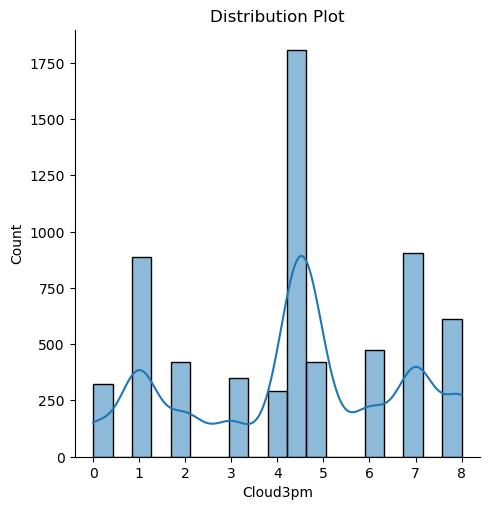

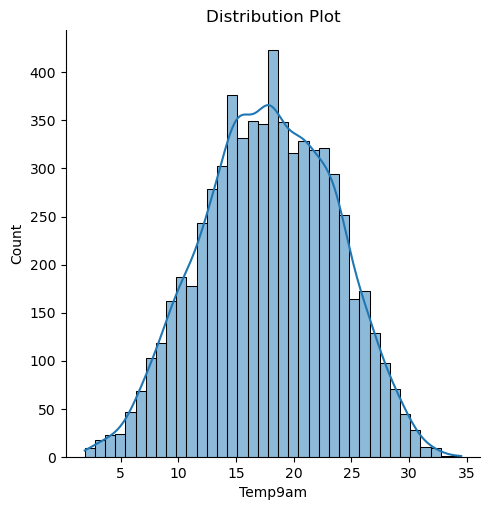

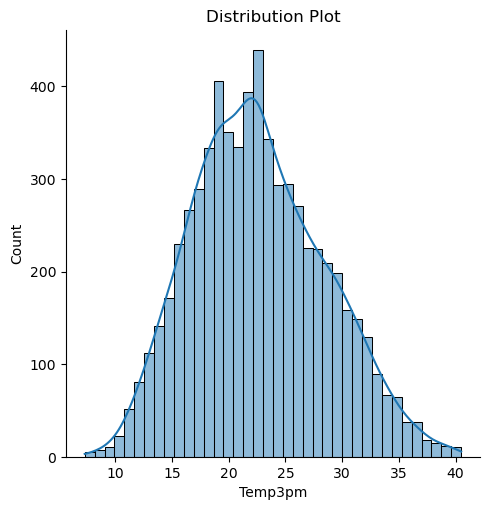

In [52]:
#checking distribution of columns
for i in num_c:
    sb.displot(df[i],kde=True)
    plt.title('Distribution Plot')    

**'Rainfall', 'Evaporation' and 'WindSpeed9am'** columns are skewed to the right.  
  
**'Sunshine'** feature is skewed to the left.

In [53]:
df.skew()

MinTemp          -0.089051
MaxTemp           0.274453
Rainfall         14.239631
Evaporation       0.663913
Sunshine         -0.757206
WindGustSpeed     0.434741
WindSpeed9am      0.672929
WindSpeed3pm      0.337061
Humidity9am      -0.239570
Humidity3pm       0.154838
Pressure9am       0.065782
Pressure3pm       0.079656
Cloud9am         -0.287306
Cloud3pm         -0.219786
Temp9am          -0.071891
Temp3pm           0.299371
dtype: float64

**'Rainfall', 'Evaporation', 'WindSpeed9am' and 'Sunshine'** columns are in **unacceptable range**, thus , we can use **yeojohnson method** to remove skewness. 

In [54]:
a=['Rainfall', 'Evaporation', 'WindSpeed9am' , 'Sunshine'] #creating list

from scipy.stats import yeojohnson as yj #importing library

for i in a:#iterating through 'a' variable
    df[i],p=yj(df[i])

df.skew()

MinTemp         -0.089051
MaxTemp          0.274453
Rainfall         0.951346
Evaporation      0.072598
Sunshine        -0.043532
WindGustSpeed    0.434741
WindSpeed9am    -0.132985
WindSpeed3pm     0.337061
Humidity9am     -0.239570
Humidity3pm      0.154838
Pressure9am      0.065782
Pressure3pm      0.079656
Cloud9am        -0.287306
Cloud3pm        -0.219786
Temp9am         -0.071891
Temp3pm          0.299371
dtype: float64

Skewness is reduced, however **'Rainfall'** column is still in  **unacceptable range**, thus , we can try **square root method**.         

In [55]:
df['Rainfall']=np.sqrt(df['Rainfall']) 

df.skew()

MinTemp         -0.089051
MaxTemp          0.274453
Rainfall         0.753359
Evaporation      0.072598
Sunshine        -0.043532
WindGustSpeed    0.434741
WindSpeed9am    -0.132985
WindSpeed3pm     0.337061
Humidity9am     -0.239570
Humidity3pm      0.154838
Pressure9am      0.065782
Pressure3pm      0.079656
Cloud9am        -0.287306
Cloud3pm        -0.219786
Temp9am         -0.071891
Temp3pm          0.299371
dtype: float64

Skewness is reduced, however **'Rainfall'** column is still in  **unacceptable range**, thus , we can try **log + 1 method**.         

In [56]:
df['Rainfall']=np.log1p(df['Rainfall']) 

df.skew()

MinTemp         -0.089051
MaxTemp          0.274453
Rainfall         0.707475
Evaporation      0.072598
Sunshine        -0.043532
WindGustSpeed    0.434741
WindSpeed9am    -0.132985
WindSpeed3pm     0.337061
Humidity9am     -0.239570
Humidity3pm      0.154838
Pressure9am      0.065782
Pressure3pm      0.079656
Cloud9am        -0.287306
Cloud3pm        -0.219786
Temp9am         -0.071891
Temp3pm          0.299371
dtype: float64

Skewness is reduced, however **'Rainfall'** column is still in  **unacceptable range**, thus , we can try **cuberoot method**.         

In [57]:
df['Rainfall']=np.cbrt(df['Rainfall']) 

df.skew()

MinTemp         -0.089051
MaxTemp          0.274453
Rainfall         0.604101
Evaporation      0.072598
Sunshine        -0.043532
WindGustSpeed    0.434741
WindSpeed9am    -0.132985
WindSpeed3pm     0.337061
Humidity9am     -0.239570
Humidity3pm      0.154838
Pressure9am      0.065782
Pressure3pm      0.079656
Cloud9am        -0.287306
Cloud3pm        -0.219786
Temp9am         -0.071891
Temp3pm          0.299371
dtype: float64

Skewness is reduced, however **'Rainfall'** column is still in  **unacceptable range**. We have applied various applicable methods, thus we can **accept  this value as a threshold value**.           

In [58]:
#Encoding categorical columns using Label Encoder
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.771280,3.651036,15.440553,W,44.000000,W,WNW,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,-0.000000,3.651036,15.440553,WNW,44.000000,NNW,WSW,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,-0.000000,3.651036,15.440553,WSW,46.000000,W,WSW,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,-0.000000,3.651036,15.440553,NE,24.000000,SE,E,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,0.796898,3.651036,15.440553,W,41.000000,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,-0.000000,3.651036,15.440553,E,31.000000,SE,ENE,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,-0.000000,3.651036,15.440553,NNW,22.000000,SE,N,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,-0.000000,3.651036,15.440553,N,37.000000,SE,WNW,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No


In [59]:
for i in cat_c:#iterating through 'cat_c' list
    
    df[i]=le.fit_transform(df[i])#Transforming columns
    
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,1,13.4,22.900000,0.771280,3.651036,15.440553,13,44.000000,13,14,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0
2008-12-02,1,7.4,25.100000,-0.000000,3.651036,15.440553,14,44.000000,6,15,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0
2008-12-03,1,12.9,25.700000,-0.000000,3.651036,15.440553,15,46.000000,13,15,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0
2008-12-04,1,9.2,28.000000,-0.000000,3.651036,15.440553,4,24.000000,9,0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0
2008-12-05,1,17.5,32.300000,0.796898,3.651036,15.440553,13,41.000000,1,7,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,9,2.8,23.400000,-0.000000,3.651036,15.440553,0,31.000000,9,1,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,0
2017-06-22,9,3.6,25.300000,-0.000000,3.651036,15.440553,6,22.000000,9,3,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,0
2017-06-23,9,5.4,26.900000,-0.000000,3.651036,15.440553,3,37.000000,9,14,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,0


All the catagorical data have been encoded. 

In [60]:
#Checking correlation between independant and dependant variables
cor=df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,1.000000,0.086679,0.070596,0.013672,0.121313,0.063862,-0.073088,0.275094,-0.100253,0.002582,...,-0.033912,-0.002381,-0.029313,-0.014446,-0.010983,-0.011042,0.094408,0.066544,-0.006643,-0.004165
MinTemp,0.086679,1.000000,0.726970,0.064394,0.354211,0.074135,-0.155120,0.243174,-0.019481,-0.145479,...,-0.140602,0.085428,-0.446510,-0.446499,0.094126,0.044631,0.891914,0.695997,0.083371,0.099820
MaxTemp,0.070596,0.726970,1.000000,-0.262586,0.464774,0.382919,-0.223107,0.165387,-0.193544,-0.167320,...,-0.414968,-0.417140,-0.348961,-0.427147,-0.242891,-0.241539,0.864560,0.974979,-0.220852,-0.159654
Rainfall,0.013672,0.064394,-0.262586,1.000000,-0.208642,-0.306342,0.127938,0.065324,0.152272,0.113513,...,0.440414,0.412460,-0.104400,-0.025259,0.326626,0.289046,-0.125800,-0.274199,0.776309,0.320837
Evaporation,0.121313,0.354211,0.464774,-0.208642,1.000000,0.405212,-0.140625,0.202949,-0.130870,-0.023463,...,-0.319096,-0.246147,-0.281287,-0.300926,-0.106150,-0.156380,0.413950,0.454384,-0.174366,-0.106757
Sunshine,0.063862,0.074135,0.382919,-0.306342,0.405212,1.000000,-0.109942,0.054701,-0.082461,-0.057887,...,-0.426070,-0.446848,-0.038811,-0.100925,-0.563161,-0.580432,0.280178,0.399149,-0.255155,-0.337041
WindGustDir,-0.073088,-0.155120,-0.223107,0.127938,-0.140625,-0.109942,1.000000,-0.009452,0.386366,0.503096,...,0.034728,0.039658,-0.097388,-0.013753,0.117665,0.083995,-0.175485,-0.234513,0.117232,0.037125
WindGustSpeed,0.275094,0.243174,0.165387,0.065324,0.202949,0.054701,-0.009452,1.000000,-0.072207,0.089690,...,-0.258176,-0.090623,-0.359418,-0.323708,-0.001916,0.035174,0.220328,0.133733,0.084194,0.169259
WindDir9am,-0.100253,-0.019481,-0.193544,0.152272,-0.130870,-0.082461,0.386366,-0.072207,1.000000,0.209864,...,0.004299,0.122392,-0.021595,0.057662,0.074271,0.055985,-0.067566,-0.202027,0.155084,0.039204
WindDir3pm,0.002582,-0.145479,-0.167320,0.113513,-0.023463,-0.057887,0.503096,0.089690,0.209864,1.000000,...,-0.004328,-0.013053,-0.129536,-0.039979,0.069379,0.047501,-0.153347,-0.178872,0.092989,-0.001313


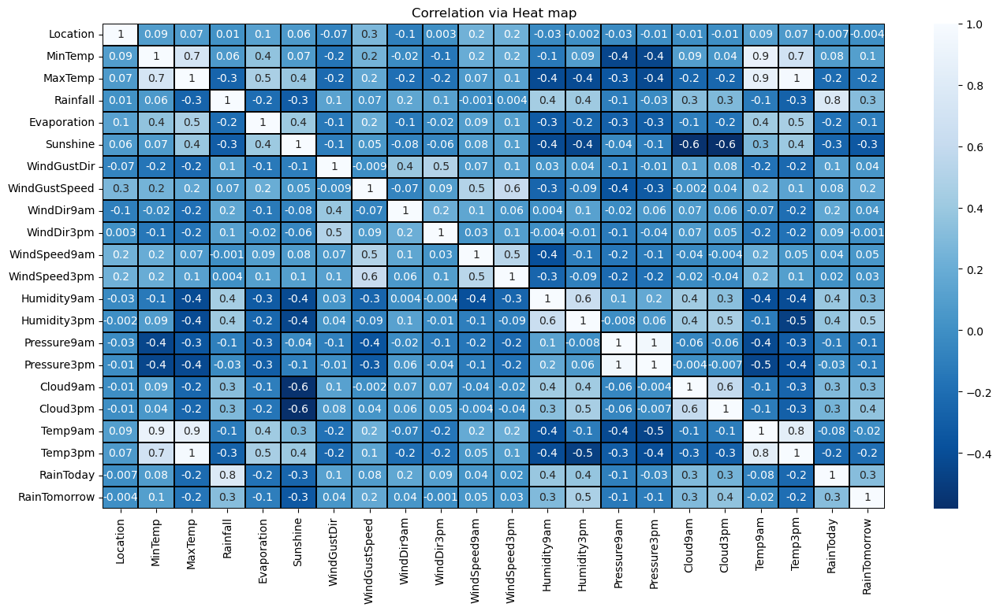

In [61]:
#Visualizing correlation via heat map
plt.figure(figsize=(16,8))
sb.heatmap(cor,annot=True,cmap="Blues_r",linecolor='black',linewidths=0.1,fmt='0.1g')
plt.title('Correlation via Heat map')
plt.show()

We can observe the following from this heatmap:  
  
1)**'Location', 'MinTemp', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed3pm', 'Cloud9am','Cloud3pm' and 'RainTomorrow'** features have **low positive correlation** with **target variable.**  
  
2)**'Humidity9am' and 'Humidity3pm'** features have **moderate positive correlation** with **target variable.** 
  
3)**'RainToday'** feature has **high positive correlation** with **target variable.**  
  
4)**'MaxTemp', 'Evaporation', 'Sunshine', 'WindSpeed9am', 'Pressure9am', 'Pressure3pm', 'Temp9am' and 'Temp3pm'** features have **low negative correlation** with  **target variable.**   
    
5)These are the following **pairs with high positive correlation with each other:**  
  
**'MinTemp' and 'Temp9am'** features   
**'MaxTemp' and 'Temp9am'** features  
**'Rainfall' and 'RainToday'** features   
**'Pressure9am' and 'Pressure3pm'** features  
**'Temp9am' and 'Temp3pm'** features   

In [62]:
#Separating features and target variable 
x=df.drop('Rainfall',axis=1)
y=df['Rainfall']

In [63]:
#checking dimensions of features and label 
print('Dimensions of features:',x.shape,'\nDimensions of label:',y.shape)

Dimensions of features: (6493, 21) 
Dimensions of label: (6493,)


We can observe that both features and lable have **same number of rows**.  
**'x'** contains **21 features**.

In [64]:
#Importing required library to apply StandardScaler
from sklearn.preprocessing import StandardScaler as sc

sc=sc()#creating instance

x=pd.DataFrame(sc.fit_transform(x),columns=x.columns)#transforming data
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,-1.391031,0.062237,-0.187334,0.170903,-0.141998,1.248145,0.463334,1.310579,1.374094,0.900021,...,0.186193,-1.564740,-1.759024,-1.442730,1.452768,0.063442,-0.164266,-0.145334,-0.551194,-0.545255
1,-1.391031,-1.023016,0.178948,0.170903,-0.141998,1.457059,0.463334,-0.227947,1.597456,-0.864186,...,-1.404255,-1.401063,-1.252040,-1.319174,0.069481,0.063442,-0.111321,0.281855,-0.551194,-0.545255
2,-1.391031,-0.028201,0.278844,0.170903,-0.141998,1.665974,0.626293,1.310579,1.597456,0.817344,...,-1.757688,-1.128268,-1.776507,-1.160316,0.069481,-1.012435,0.559309,0.093892,-0.551194,-0.545255
3,-1.391031,-0.697440,0.661776,0.170903,-0.141998,-0.632084,-1.166250,0.431421,-1.752981,0.061275,...,-1.345350,-1.892095,-0.028286,-0.436633,0.069481,0.063442,0.047512,0.657781,-0.551194,-0.545255
4,-1.391031,0.803827,1.377692,0.170903,-0.141998,1.248145,0.218897,-1.326895,-0.189444,-0.417067,...,0.834154,-0.964591,-1.217076,-1.636889,1.049874,1.566388,-0.005432,1.204583,-0.551194,-0.545255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6488,1.205201,-1.855044,-0.104088,0.170903,-0.141998,-1.467742,-0.595896,0.431421,-1.529618,0.269730,...,-0.991917,-1.455622,1.195469,0.887180,0.069481,0.063442,-1.364342,-0.042808,-0.551194,-0.545255
6489,1.205201,-1.710344,0.212247,0.170903,-0.141998,-0.214255,-1.329209,0.431421,-1.082893,0.269730,...,-0.697389,-1.619299,1.003165,0.675370,0.069481,0.063442,-1.223157,0.316030,-0.551194,-0.545255
6490,1.205201,-1.384767,0.478634,0.170903,-0.141998,-0.840999,-0.107020,0.431421,1.374094,-0.165676,...,-0.874106,-1.455622,0.566110,0.269401,0.069481,0.063442,-0.940786,0.589431,-0.551194,-0.545255
6491,1.205201,-0.950666,0.495283,0.170903,-0.141998,0.412488,-0.840333,0.651210,-1.082893,0.269730,...,-0.991917,-1.455622,0.286394,0.216448,-0.561701,-1.012435,-0.481933,0.572344,-0.551194,-0.545255


The data is scaled using StandarScaler method to overcome the **issue of biasness.**

In [65]:
#Checking varience inflation factor
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif #Importing required library

v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.160594,Location
1,8.979725,MinTemp
2,26.320403,MaxTemp
3,1.586342,Evaporation
4,2.197382,Sunshine
5,1.616362,WindGustDir
6,2.186849,WindGustSpeed
7,1.348516,WindDir9am
8,1.468009,WindDir3pm
9,1.940481,WindSpeed9am


**'MaxTemp', 'MinTemp', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', and 'Temp3pm'** features have **high VIF value**, thus posing **multicollinearity problem**. We can **drop 'Temp3pm'** feature as it has the **highest VIF value.** 

In [66]:
x.drop('Temp3pm',axis=1,inplace=True)#Dropping 'Temp3pm' feature
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,RainTomorrow
0,-1.391031,0.062237,-0.187334,0.170903,-0.141998,1.248145,0.463334,1.310579,1.374094,0.900021,0.754321,0.186193,-1.564740,-1.759024,-1.442730,1.452768,0.063442,-0.164266,-0.551194,-0.545255
1,-1.391031,-1.023016,0.178948,0.170903,-0.141998,1.457059,0.463334,-0.227947,1.597456,-0.864186,0.533938,-1.404255,-1.401063,-1.252040,-1.319174,0.069481,0.063442,-0.111321,-0.551194,-0.545255
2,-1.391031,-0.028201,0.278844,0.170903,-0.141998,1.665974,0.626293,1.310579,1.597456,0.817344,0.974704,-1.757688,-1.128268,-1.776507,-1.160316,0.069481,-1.012435,0.559309,-0.551194,-0.545255
3,-1.391031,-0.697440,0.661776,0.170903,-0.141998,-0.632084,-1.166250,0.431421,-1.752981,0.061275,-0.898550,-1.345350,-1.892095,-0.028286,-0.436633,0.069481,0.063442,0.047512,-0.551194,-0.545255
4,-1.391031,0.803827,1.377692,0.170903,-0.141998,1.248145,0.218897,-1.326895,-0.189444,-0.417067,0.313555,0.834154,-0.964591,-1.217076,-1.636889,1.049874,1.566388,-0.005432,-0.551194,-0.545255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6488,1.205201,-1.855044,-0.104088,0.170903,-0.141998,-1.467742,-0.595896,0.431421,-1.529618,0.269730,-0.678167,-0.991917,-1.455622,1.195469,0.887180,0.069481,0.063442,-1.364342,-0.551194,-0.545255
6489,1.205201,-1.710344,0.212247,0.170903,-0.141998,-0.214255,-1.329209,0.431421,-1.082893,0.269730,-0.898550,-0.697389,-1.619299,1.003165,0.675370,0.069481,0.063442,-1.223157,-0.551194,-0.545255
6490,1.205201,-1.384767,0.478634,0.170903,-0.141998,-0.840999,-0.107020,0.431421,1.374094,-0.165676,-0.898550,-0.874106,-1.455622,0.566110,0.269401,0.069481,0.063442,-0.940786,-0.551194,-0.545255
6491,1.205201,-0.950666,0.495283,0.170903,-0.141998,0.412488,-0.840333,0.651210,-1.082893,0.269730,-1.118933,-0.991917,-1.455622,0.286394,0.216448,-0.561701,-1.012435,-0.481933,-0.551194,-0.545255


**'Temp3pm'** feature is **dropped successfully.**

In [67]:
#re-checking varience inflation factor 
v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.160166,Location
1,8.908852,MinTemp
2,9.616331,MaxTemp
3,1.584796,Evaporation
4,2.197051,Sunshine
5,1.612825,WindGustDir
6,2.178964,WindGustSpeed
7,1.347224,WindDir9am
8,1.467445,WindDir3pm
9,1.940315,WindSpeed9am


**'MaxTemp', 'MinTemp', 'Pressure9am', 'Pressure3pm'  and 'Temp9am'** features still have **high VIF value**. We can **drop 'Pressure9am'** feature as it has the **highest VIF value.** 

In [68]:
x.drop('Pressure9am',axis=1,inplace=True)#Dropping 'Pressure9am' feature
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday,RainTomorrow
0,-1.391031,0.062237,-0.187334,0.170903,-0.141998,1.248145,0.463334,1.310579,1.374094,0.900021,0.754321,0.186193,-1.564740,-1.442730,1.452768,0.063442,-0.164266,-0.551194,-0.545255
1,-1.391031,-1.023016,0.178948,0.170903,-0.141998,1.457059,0.463334,-0.227947,1.597456,-0.864186,0.533938,-1.404255,-1.401063,-1.319174,0.069481,0.063442,-0.111321,-0.551194,-0.545255
2,-1.391031,-0.028201,0.278844,0.170903,-0.141998,1.665974,0.626293,1.310579,1.597456,0.817344,0.974704,-1.757688,-1.128268,-1.160316,0.069481,-1.012435,0.559309,-0.551194,-0.545255
3,-1.391031,-0.697440,0.661776,0.170903,-0.141998,-0.632084,-1.166250,0.431421,-1.752981,0.061275,-0.898550,-1.345350,-1.892095,-0.436633,0.069481,0.063442,0.047512,-0.551194,-0.545255
4,-1.391031,0.803827,1.377692,0.170903,-0.141998,1.248145,0.218897,-1.326895,-0.189444,-0.417067,0.313555,0.834154,-0.964591,-1.636889,1.049874,1.566388,-0.005432,-0.551194,-0.545255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6488,1.205201,-1.855044,-0.104088,0.170903,-0.141998,-1.467742,-0.595896,0.431421,-1.529618,0.269730,-0.678167,-0.991917,-1.455622,0.887180,0.069481,0.063442,-1.364342,-0.551194,-0.545255
6489,1.205201,-1.710344,0.212247,0.170903,-0.141998,-0.214255,-1.329209,0.431421,-1.082893,0.269730,-0.898550,-0.697389,-1.619299,0.675370,0.069481,0.063442,-1.223157,-0.551194,-0.545255
6490,1.205201,-1.384767,0.478634,0.170903,-0.141998,-0.840999,-0.107020,0.431421,1.374094,-0.165676,-0.898550,-0.874106,-1.455622,0.269401,0.069481,0.063442,-0.940786,-0.551194,-0.545255
6491,1.205201,-0.950666,0.495283,0.170903,-0.141998,0.412488,-0.840333,0.651210,-1.082893,0.269730,-1.118933,-0.991917,-1.455622,0.216448,-0.561701,-1.012435,-0.481933,-0.551194,-0.545255


**'Pressure9am'** feature is **dropped successfully.**

In [69]:
#re-checking varience inflation factor 
v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.159205,Location
1,8.806094,MinTemp
2,9.255144,MaxTemp
3,1.566676,Evaporation
4,2.183602,Sunshine
5,1.594241,WindGustDir
6,2.156738,WindGustSpeed
7,1.325182,WindDir9am
8,1.404315,WindDir3pm
9,1.936139,WindSpeed9am


**'MaxTemp', 'MinTemp', 'Temp9am'** features still have **high VIF value**. We can **drop 'Temp9am'** feature as it has the **highest VIF value.** 

In [70]:
x.drop('Temp9am',axis=1,inplace=True)#Dropping 'Temp9am' feature
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,-1.391031,0.062237,-0.187334,0.170903,-0.141998,1.248145,0.463334,1.310579,1.374094,0.900021,0.754321,0.186193,-1.564740,-1.442730,1.452768,0.063442,-0.551194,-0.545255
1,-1.391031,-1.023016,0.178948,0.170903,-0.141998,1.457059,0.463334,-0.227947,1.597456,-0.864186,0.533938,-1.404255,-1.401063,-1.319174,0.069481,0.063442,-0.551194,-0.545255
2,-1.391031,-0.028201,0.278844,0.170903,-0.141998,1.665974,0.626293,1.310579,1.597456,0.817344,0.974704,-1.757688,-1.128268,-1.160316,0.069481,-1.012435,-0.551194,-0.545255
3,-1.391031,-0.697440,0.661776,0.170903,-0.141998,-0.632084,-1.166250,0.431421,-1.752981,0.061275,-0.898550,-1.345350,-1.892095,-0.436633,0.069481,0.063442,-0.551194,-0.545255
4,-1.391031,0.803827,1.377692,0.170903,-0.141998,1.248145,0.218897,-1.326895,-0.189444,-0.417067,0.313555,0.834154,-0.964591,-1.636889,1.049874,1.566388,-0.551194,-0.545255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6488,1.205201,-1.855044,-0.104088,0.170903,-0.141998,-1.467742,-0.595896,0.431421,-1.529618,0.269730,-0.678167,-0.991917,-1.455622,0.887180,0.069481,0.063442,-0.551194,-0.545255
6489,1.205201,-1.710344,0.212247,0.170903,-0.141998,-0.214255,-1.329209,0.431421,-1.082893,0.269730,-0.898550,-0.697389,-1.619299,0.675370,0.069481,0.063442,-0.551194,-0.545255
6490,1.205201,-1.384767,0.478634,0.170903,-0.141998,-0.840999,-0.107020,0.431421,1.374094,-0.165676,-0.898550,-0.874106,-1.455622,0.269401,0.069481,0.063442,-0.551194,-0.545255
6491,1.205201,-0.950666,0.495283,0.170903,-0.141998,0.412488,-0.840333,0.651210,-1.082893,0.269730,-1.118933,-0.991917,-1.455622,0.216448,-0.561701,-1.012435,-0.551194,-0.545255


**'Temp9am'** feature is **dropped successfully.**

In [71]:
#re-checking varience inflation factor 
v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.152040,Location
1,4.652083,MinTemp
2,5.592856,MaxTemp
3,1.553052,Evaporation
4,2.157312,Sunshine
5,1.593507,WindGustDir
6,2.122681,WindGustSpeed
7,1.323999,WindDir9am
8,1.404225,WindDir3pm
9,1.908765,WindSpeed9am


**'MaxTemp'** feature still have **high VIF value**. We can **drop 'MaxTemp'** feature as it has the **highest VIF value.** 

In [72]:
x.drop('MaxTemp',axis=1,inplace=True)#Dropping 'MaxTemp' feature
x

,Location,MinTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,RainTomorrow
0,-1.391031,0.062237,0.170903,-0.141998,1.248145,0.463334,1.310579,1.374094,0.900021,0.754321,0.186193,-1.564740,-1.442730,1.452768,0.063442,-0.551194,-0.545255
1,-1.391031,-1.023016,0.170903,-0.141998,1.457059,0.463334,-0.227947,1.597456,-0.864186,0.533938,-1.404255,-1.401063,-1.319174,0.069481,0.063442,-0.551194,-0.545255
2,-1.391031,-0.028201,0.170903,-0.141998,1.665974,0.626293,1.310579,1.597456,0.817344,0.974704,-1.757688,-1.128268,-1.160316,0.069481,-1.012435,-0.551194,-0.545255
3,-1.391031,-0.697440,0.170903,-0.141998,-0.632084,-1.166250,0.431421,-1.752981,0.061275,-0.898550,-1.345350,-1.892095,-0.436633,0.069481,0.063442,-0.551194,-0.545255
4,-1.391031,0.803827,0.170903,-0.141998,1.248145,0.218897,-1.326895,-0.189444,-0.417067,0.313555,0.834154,-0.964591,-1.636889,1.049874,1.566388,-0.551194,-0.545255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6488,1.205201,-1.855044,0.170903,-0.141998,-1.467742,-0.595896,0.431421,-1.529618,0.269730,-0.678167,-0.991917,-1.455622,0.887180,0.069481,0.063442,-0.551194,-0.545255
6489,1.205201,-1.710344,0.170903,-0.141998,-0.214255,-1.329209,0.431421,-1.082893,0.269730,-0.898550,-0.697389,-1.619299,0.675370,0.069481,0.063442,-0.551194,-0.545255
6490,1.205201,-1.384767,0.170903,-0.141998,-0.840999,-0.107020,0.431421,1.374094,-0.165676,-0.898550,-0.874106,-1.455622,0.269401,0.069481,0.063442,-0.551194,-0.545255
6491,1.205201,-0.950666,0.170903,-0.141998,0.412488,-0.840333,0.651210,-1.082893,0.269730,-1.118933,-0.991917,-1.455622,0.216448,-0.561701,-1.012435,-0.551194,-0.545255


**'MaxTemp'** feature is **dropped successfully.**

In [73]:
#re-checking varience inflation factor 
v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.149475,Location
1,1.569040,MinTemp
2,1.545535,Evaporation
3,2.116513,Sunshine
4,1.592194,WindGustDir
5,2.112751,WindGustSpeed
6,1.294372,WindDir9am
7,1.402104,WindDir3pm
8,1.840902,WindSpeed9am
9,1.867063,WindSpeed3pm


Now the multicollinearity problem is solved. 

In [74]:
x.shape#checking shape of x

(6493, 17)

Now **'x'** has **17 features**.

In [75]:
#Importing libraries required for model building
from sklearn.model_selection import train_test_split as tts, cross_val_score as cvs
from sklearn.linear_model import LinearRegression,ElasticNet,Lasso, Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor,ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score, mean_squared_error as mse, mean_absolute_error as mae
from sklearn.svm import SVR as SupportVectorRegression

In [76]:
#Finding best random state on Linear Regression model
r2s_updater=0#initilizing variable
rs_updater=0#initilizing variable

for i in range(1,1000): #running 'if' loop for 999 times
    
    x_train,x_test,y_train,y_test=tts(x,y,test_size=0.30,random_state=i)#spliting data
    
    lr=LinearRegression()#creating instance
    
    lr.fit(x_train,y_train)#fitting  data
    pr=lr.predict(x_test)#predicting data
    r2s=r2_score(y_test,pr)#calculating r2 score 
    
    if r2s>r2s_updater: #using if condition to update 'r2s_updater' and 'rs_updater' only if 'r2s' is greater than 'r2s_updater'
        #updating values
        r2s_updater=r2s
        rs_updater=i

print('Max r2 score during the iteration is ',r2s_updater,'on random state : ',rs_updater)#printing

Max r2 score during the iteration is  0.676954241012651 on random state :  346


In [77]:
x_train,x_test,y_train,y_test=tts(x,y,test_size=0.30,random_state=rs_updater)#Spliting data on the best random state

In [78]:
#Creating instance of  various models
LR=LinearRegression() 
L=Lasso()
R=Ridge()
EN=ElasticNet()
RFR=RandomForestRegressor()
GBR=GradientBoostingRegressor()
ETR=ExtraTreesRegressor()
DTR=DecisionTreeRegressor()
KNR=KNeighborsRegressor()
SVR=SupportVectorRegression()
    
models=[LR,L,R,EN,RFR,GBR,ETR,DTR,KNR,SVR]#Creating list containing the instances of the models

log=float('inf')#Initializing 'log' variable  to positive infinity    

for i in models:#Iterating models 
    
    i.fit(x_train,y_train)#fitting data
    pr=i.predict(x_test)#predicting data
    
    R2score=r2_score(y_test,pr)#calculating r2 score
    MAE=mae(y_test,pr)#calculating Mean Absolute Error
    MSE=mse(y_test,pr)#calculating Mean Squared Error
    RMSE=np.sqrt(MSE)#calculating Root Mean Squared Error
    
    score=cvs(i,x,y)#calculating Cross Validation Score
    diff=abs(R2score - score.mean())*100 #calculating difference of R2score and Cross Validation Score
    
    
    
    #Printing    
    print('\n','R2 score of',str(i).split('(')[0],'is',R2score,'\n','Mean absolute Error of',str(i).split('(')[0],'is',MAE,'\n','Mean squared error of',str(i).split('(')[0],'is',MSE,'\n','Root Mean squared error of',str(i).split('(')[0],'is',RMSE)
    print('\n\nCross validation Score of',str(i).split('(')[0],'is',score,'\nMean: ',score.mean(),'\nDifference between R2 score and cross validation is ',diff)
    
    if diff<log and score.mean()>=0:#Using two condition to execute the following codes i.e. when 'log' is greater than 'diff' and mean of 'score' in not negative
        
        log=diff#Updating 'log' variable if condition is 'True'
        b_d=diff#Storing difference in 'b_d' variable in context to  the corresponding iteration 
        
        model=str(i).split('(')[0]#Storing model name in 'model' variable in context to  the corresponding iteration

print(f'\n\n{model} is the best model with least difference between R2 score and cross validation i.e {b_d}')#Printing         


 R2 score of LinearRegression is 0.676954241012651 
 Mean absolute Error of LinearRegression is 0.1508327375259145 
 Mean squared error of LinearRegression is 0.04853191291776805 
 Root Mean squared error of LinearRegression is 0.22029959808807653


Cross validation Score of LinearRegression is [0.68818565 0.55402723 0.5874733  0.57334656 0.73275847] 
Mean:  0.6271582387234401 
Difference between R2 score and cross validation is  4.979600228921088

 R2 score of Lasso is -2.3183410519322933e-05 
 Mean absolute Error of Lasso is 0.37046191331295536 
 Mean squared error of Lasso is 0.1502358000462998 
 Root Mean squared error of Lasso is 0.38760263162973985


Cross validation Score of Lasso is [-0.00184463 -0.01779481 -0.01170417 -0.00166436 -0.07012264] 
Mean:  -0.020626120281898076 
Difference between R2 score and cross validation is  2.060293687137875

 R2 score of Ridge is 0.6769511272314699 
 Mean absolute Error of Ridge is 0.15084630779920644 
 Mean squared error of Ridge is 0.0485

Here by comparing difference of accuracy score and cross validation  of various models, we can conclude that **Ridge  is the best performing model** as it has the least difference between accuracy score and cross validation than the rest of the models.

In [79]:
#Using GridSearchCV  for hyperparameter tuning
from sklearn.model_selection import GridSearchCV as GSC#Importing required library

pa={'alpha':[0.1,1.0,10.0,100.0],'fit_intercept':[True,False],'copy_X':[True,False],'positive':[True,False],'solver':['auto','svd','cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga', 'lbfgs']}#defining hyper parameters

gsc=GSC(R,pa)#creating instance

gsc.fit(x_train,y_train)#fitting data
gsc.best_params_#fetching best parameters

{'alpha': 10.0,
 'copy_X': True,
 'fit_intercept': True,
 'positive': False,
 'solver': 'sparse_cg'}

In [80]:
#Applying best parameters provided by GridSearchCV
final=Ridge(alpha=10.0,fit_intercept=True,copy_X=True,positive=False,solver='sparse_cg')

In [81]:
final.fit(x_train,y_train)#fitting data
pr=final.predict(x_test)#predicting data

print('R2 score :',r2_score(y_test,pr))#printing 
print('Mean Absolute Error:',mae(y_test,pr))#printing
print('Mean Squared Error :',mse(y_test,pr))#printing
print('Root Mean Squared Error:',np.sqrt(MSE))#printing

R2 score : 0.676922133672343
Mean Absolute Error: 0.15096962480284912
Mean Squared Error : 0.04853673647790002
Root Mean Squared Error: 0.22486497321033305


Model's r2 score is **increased** from **62% to 67%**

In [82]:
#Conclusion
Predicted_values=final.predict(x_test)#storing predicted values in 'Predicted_values' variable
Original_values=y_test#storing original values in 'Original_values' variable

conclusion=pd.DataFrame({'Predicted Values':Predicted_values,'Original Values':Original_values})#creating new data frame with Predicted and Original values
conclusion.sample(20)

,Predicted Values,Original Values
Date,,
2010-02-24,0.818526,0.841607
2014-12-24,0.817692,0.804315
2009-01-11,0.181149,-0.000000
2009-12-18,0.744912,0.841022
2009-11-16,0.101838,-0.000000
2009-11-05,0.082613,-0.000000
2014-01-04,0.227610,-0.000000
2010-05-05,0.815936,0.833992
2010-11-18,0.192260,-0.000000


Here we can conclude that the model **predicted values** are **fairly close enough** to the **original values.** 

In [83]:
#Saving the model
import joblib#importing library
joblib.dump(final,r'D:\Models\RWF_R.obj')#saving model into desired path

['D:\\Models\\RWF_R.obj']

Now we are going to treat **'RainTomorrow' as target variable.**

In [84]:
#importing R-RWF data set 
df=pd.read_csv(r'D:\Files\R-RWF.csv')
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6757,2017-06-21,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No
6758,2017-06-22,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No
6759,2017-06-23,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No
6760,2017-06-24,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,...,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No


Data Frame contains **6762 rows and 23 columns** out of which **22 columns are inputs** and **1 column is target variable** i.e. **'RainTomorrow' column**.  
  
The data frame contains both  **numeric and catagorical data.**  
  
**'RainTomorrow' column has catagorical data,** thus it represents **Classification Problem**.  
  
***The goal is to predict whether or not it will rain tomorrow.***   

From the previous analysis, we observed  **statistical information** of the **numerical columns**, **duplicate values** which were **dropped**, **presence of null values** and the data frame which we imported is  already free of NaN values, and we conducted **various graphical analyses** of each columns.

In [85]:
df.set_index('Date',inplace=True)#setting date as index of the data frame
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No


**'Date' feature** is **set as index** successfully. 

In [86]:
#checking unique values, Number of unique values and value_counts of target variable
print('RainTomorrow',':-\nUnique values:',df['RainTomorrow'].unique(),'\nNumber of unique values:',df['RainTomorrow'].nunique(),'\n\n',df['RainTomorrow'].value_counts().to_frame('Value Counts'))#Printing

RainTomorrow :-
Unique values: ['No' 'Yes'] 
Number of unique values: 2 

      Value Counts
No           5190
Yes          1572


We can conclude that this data is imbalanced , we can use Sampling methods to overcome it.

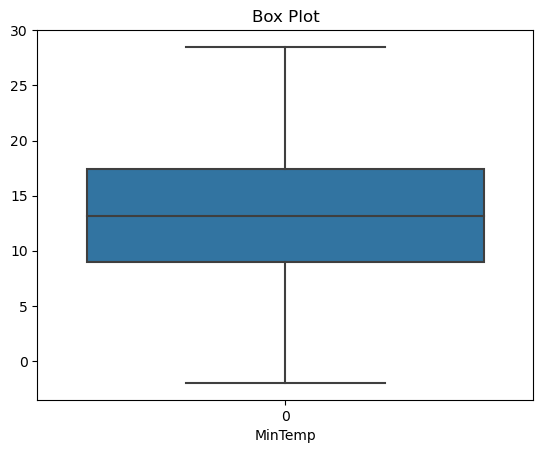

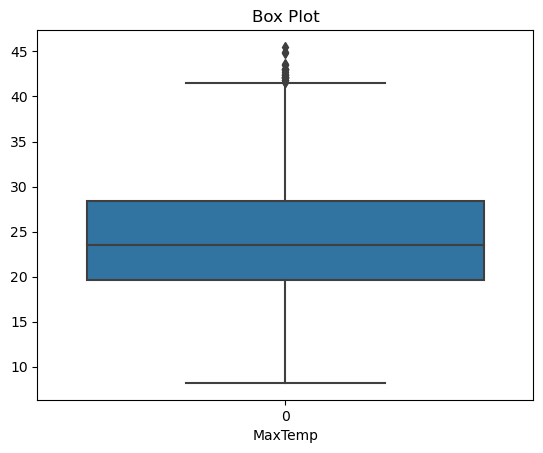

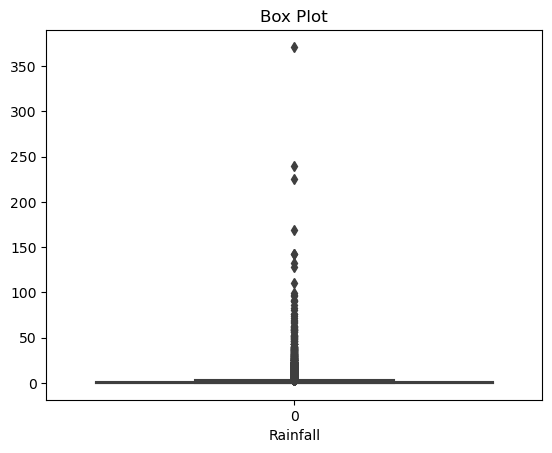

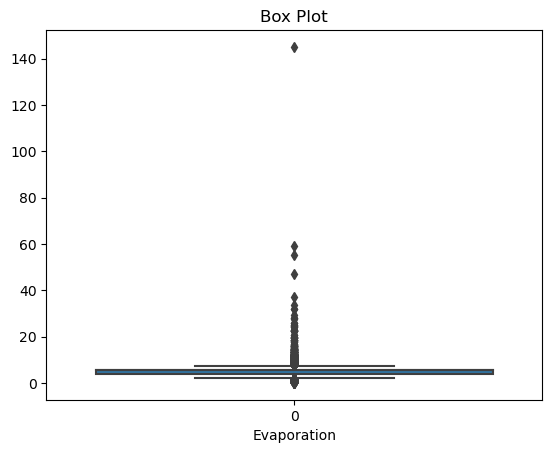

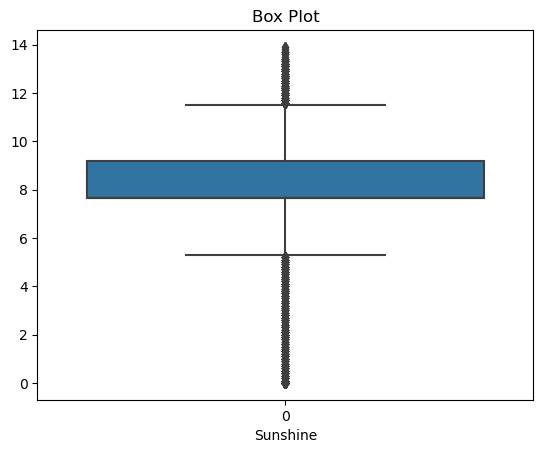

...

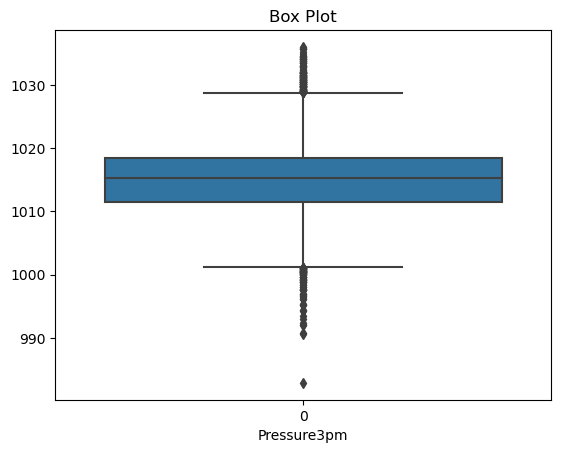

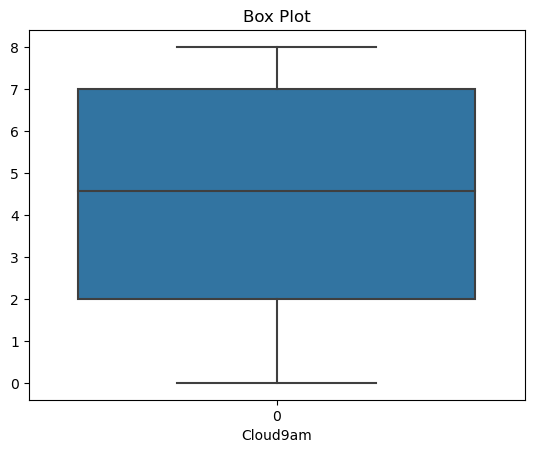

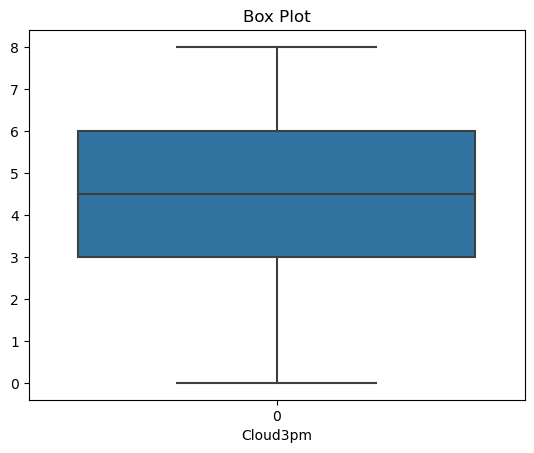

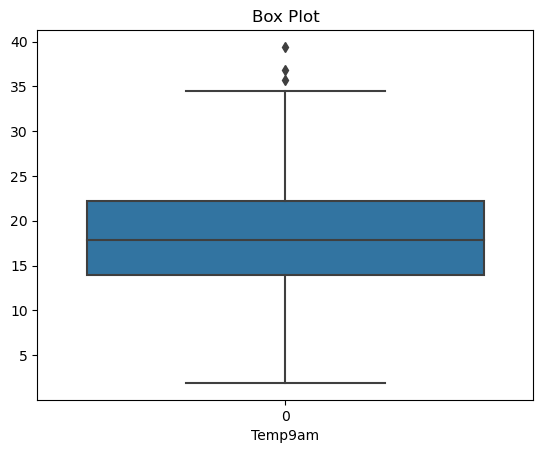

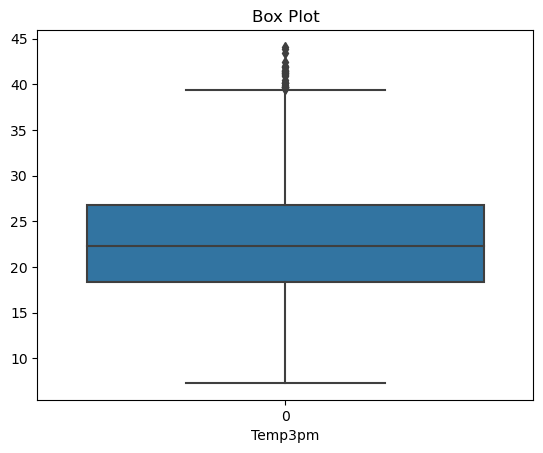

In [87]:
col=df.columns.to_list()#storing columns of data frame in 'col' variable


#creating empty list
num_c=[]
cat_c=[]

#Checking outliers via Box Plot
for i in col:#iterating through 'col' variable 
    
    if df[i].dtypes=='float64':#using if condition to execute the following code only if the columns contains numeric values
        num_c.append(i)#appending 'i' in 'num_c' list

    elif df[i].dtypes=='object':#using if condition to execute the following code only if the columns contains catagorical values
        cat_c.append(i)#appending 'i' in 'cat_c' list


for i in num_c:
    sb.boxplot(df[i])
    plt.xlabel(i)
    plt.title('Box Plot')
    plt.show()

**All of these features** contains outliers **except** for **'MinTemp', 'Cloud9am' and 'Cloud3pm'** features.

In [88]:
out=list(num_c)#copying data of 'num_c' list

out.remove('MinTemp')#removing 'MinTemp' feature from the list
out.remove('Cloud9am')#removing 'Cloud9am' feature from the list
out.remove('Cloud3pm')#removing 'Cloud3pm' feature from the list

#removing outliers using zscore method
#Importing necessary libraries
from scipy.stats import zscore as zs

f_outlier=df[out]
z=np.abs(zs(f_outlier))
z

,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
Date,,,,,,,,,,,,,
2008-12-01,0.195170,0.208040,0.014779,0.049294,0.362850,0.736444,0.671784,0.203179,1.539598,1.647292,1.347736,0.173722,0.151545
2008-12-02,0.163738,0.265281,0.014779,0.049294,0.362850,0.898312,0.462330,1.368283,1.377411,1.166162,1.230431,0.121292,0.267112
2008-12-03,0.261622,0.265281,0.014779,0.049294,0.512305,0.634272,0.881238,1.717496,1.107100,1.663883,1.079611,0.542811,0.082903
2008-12-04,0.636844,0.265281,0.014779,0.049294,1.131708,0.183106,0.899122,1.310080,1.863971,0.004812,0.392542,0.035995,0.635529
2008-12-05,1.338345,0.169879,0.014779,0.049294,0.138666,0.591796,0.252876,0.843405,0.944913,1.132980,1.532071,0.016434,1.171410
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,0.113600,0.265281,0.014779,0.049294,0.608613,0.021238,0.689668,0.960867,1.431473,1.156538,0.864293,1.362117,0.051067
2017-06-22,0.196366,0.265281,0.014779,0.049294,1.281164,0.021238,0.899122,0.669855,1.593660,0.974040,0.663199,1.222306,0.300604
2017-06-23,0.457390,0.265281,0.014779,0.049294,0.160246,0.387451,0.899122,0.844462,1.431473,0.559272,0.277770,0.942683,0.568544


The **variable 'z'** holds the **zscores values** of these features.

In [89]:
#checking outliers as per the threshold value as '3'
np.where(z>3)

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
          62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
         381,  405,  406,  407,  431,  462,  466,  466,  563,  567,  568,
         568,  569,  602,  602,  603,  683,  683,  699,  713,  748,  748,
         770,  795,  796,  797,  802,  928,  928,  935,  949,  979,  980,
         980,  980, 1008, 1009, 1011, 1138, 1148, 1149, 1151, 1189, 1203,
        1237, 1241, 1264, 1265, 1357, 1411, 1412, 1413, 1479, 1480, 1481,
        1513, 1535, 1587, 1644, 1661, 1665, 1673, 1680, 1774, 1819, 1873,
        1898, 1903, 1945, 2016, 2028, 2043, 2074, 2108, 2116, 2186, 2201,
        2219, 2219, 2230, 2231, 2265, 2429, 2488, 2500, 2505, 2527, 2527,
        2541, 2593, 2676, 2677, 2735, 2827, 2835, 2849, 2849, 2855, 2859,
        2863, 2869, 2877, 2883, 2890, 2891, 2897, 2898, 2900, 2900, 2901,
        2905, 2909, 2911, 2919, 2925, 2933, 2939, 2947, 2953, 2961, 2967,
        2975, 2989, 3003, 3027, 3045, 

In [90]:
#checking value of the outliers
z.iloc[8,4]

3.053053245174385

In [91]:
z.iloc[12,9]

3.8704468972704786

In [92]:
z.iloc[12,10]

3.71058425323124

In [93]:
z.iloc[44,0]

3.0839420651839156

We can confirm that these values holds outlier as per the threshold value.

In [94]:
#Removing outliers 
zscore=df[(z<3).all(axis=1)]#storing values in 'zscore' variable

In [95]:
#Using IQR method to remove outliers from the original data frame
q1=f_outlier.quantile(.25)
q3=f_outlier.quantile(.75)
iqr=q3-q1
IQR=df[~((df< (q1-1.5*iqr)) | (df>(q3+1.5*iqr))).any(axis=1)]

In [96]:
print('Data loss percentage after removing outliers via zscore method',((df.shape[0]-zscore.shape[0])/df.shape[0])*100)
print('Data loss percentage after removing outliers via IQR method',((df.shape[0]-IQR.shape[0])/df.shape[0])*100)

Data loss percentage after removing outliers via zscore method 5.220349009168885
Data loss percentage after removing outliers via IQR method 45.459923099674654


We can observe that **zscore method performed well** than IQR method, hence, we will **update** the data frame with **zscore method.**

In [97]:
outliers=df.shape[0]-zscore.shape[0]#storing number of outliers removed in 'outliers' variable

print(f'Outliers removed : {outliers}')#printing
df=zscore#Updating data frame

Outliers removed : 353


In [98]:
df.shape#checking shape of data frame

(6409, 22)

Now the data frame has **6409 rows.**

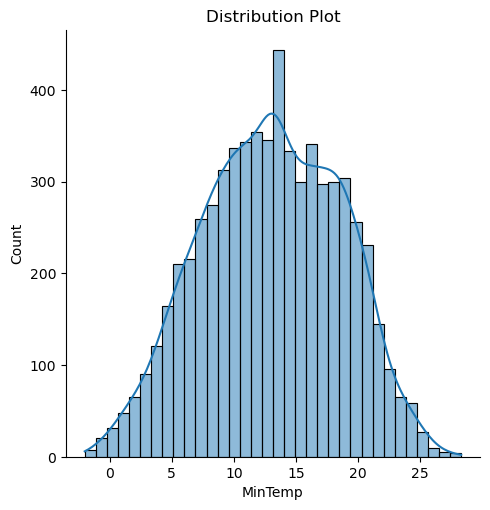

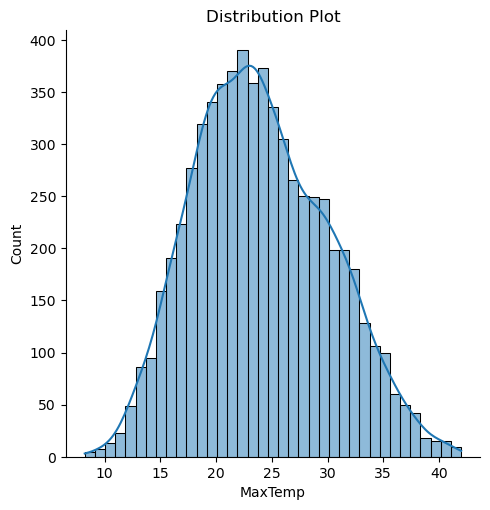

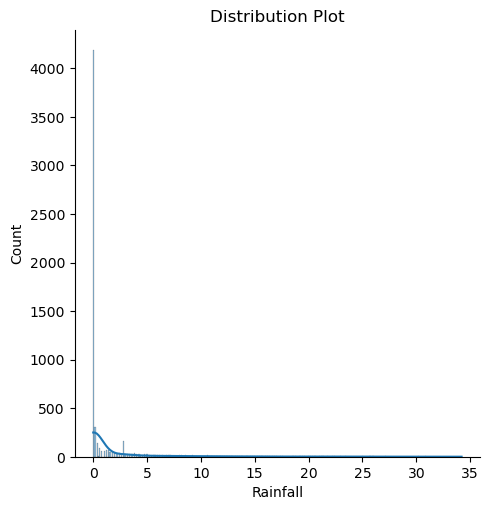

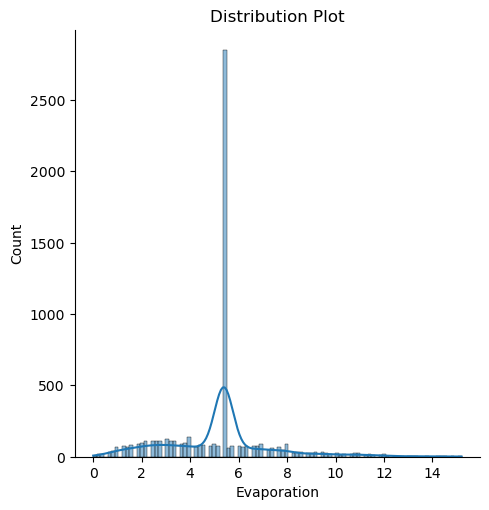

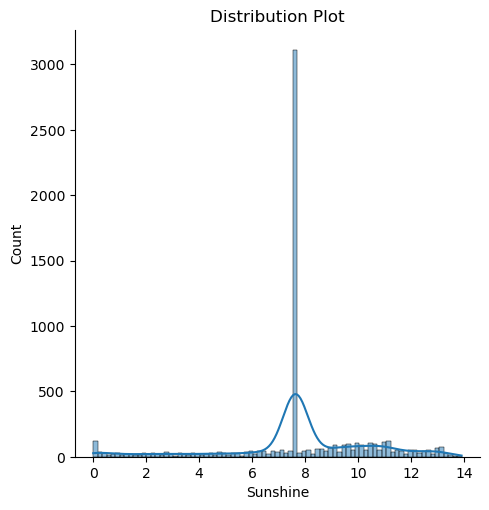

...

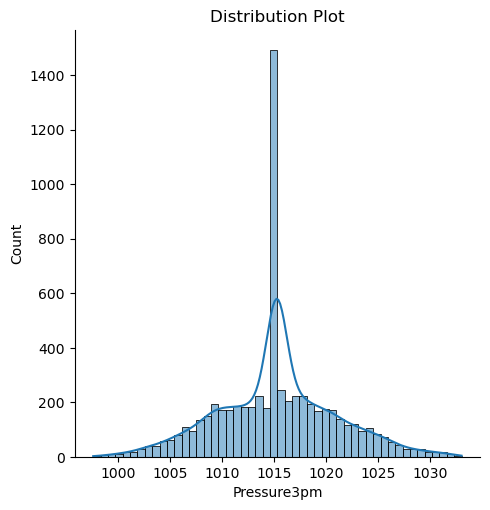

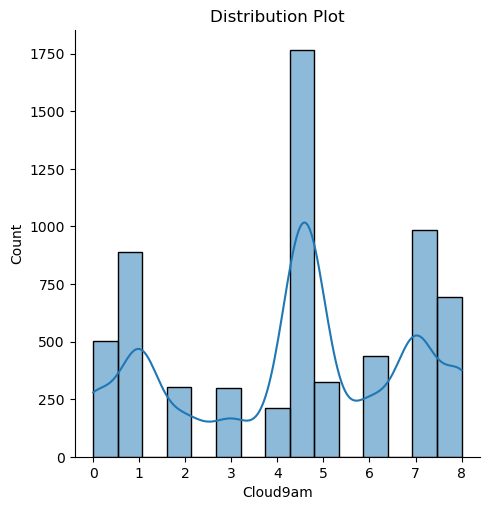

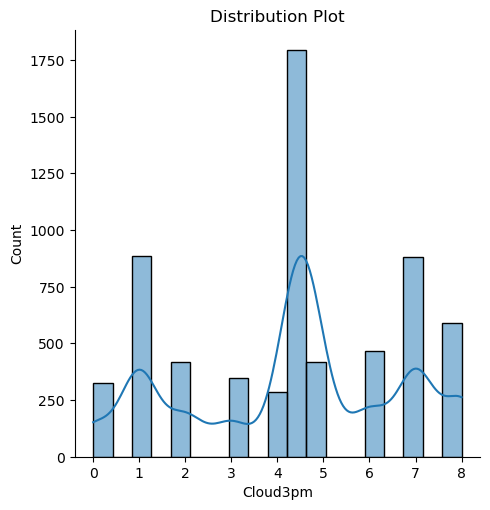

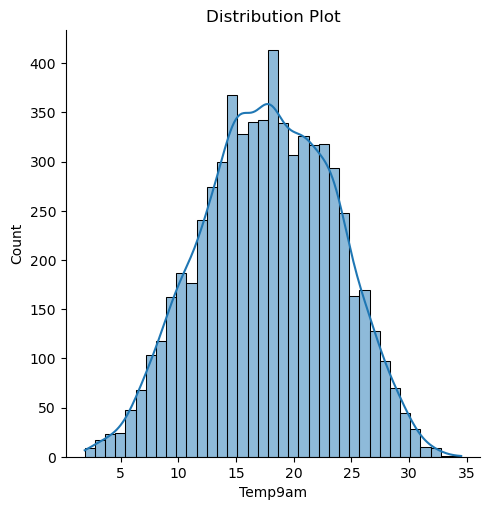

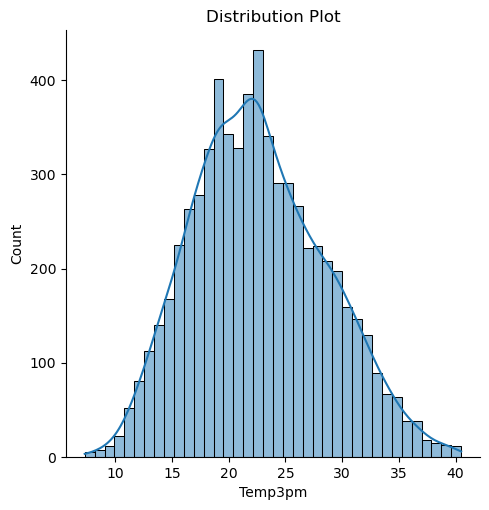

In [99]:
#checking distribution of columns
for i in num_c:
    sb.displot(df[i],kde=True)
    plt.title('Distribution Plot')    

**'Rainfall', 'Evaporation' and 'WindSpeed9am'** columns are skewed to the right.  
  
**'Sunshine'** feature is skewed to the left.

In [100]:
df.skew()

MinTemp         -0.079583
MaxTemp          0.266849
Rainfall         3.514866
Evaporation      0.666495
Sunshine        -0.747742
WindGustSpeed    0.434313
WindSpeed9am     0.673887
WindSpeed3pm     0.336515
Humidity9am     -0.233515
Humidity3pm      0.156591
Pressure9am      0.062576
Pressure3pm      0.077866
Cloud9am        -0.279140
Cloud3pm        -0.212402
Temp9am         -0.071954
Temp3pm          0.292131
dtype: float64

**'Rainfall', 'Evaporation', 'WindSpeed9am' and 'Sunshine'** columns are in **unacceptable range**, thus , we can use **yeojohnson method** to remove skewness. 

In [101]:
a=['Rainfall', 'Evaporation', 'WindSpeed9am' , 'Sunshine'] #creating list

from scipy.stats import yeojohnson as yj #importing library

for i in a:#iterating through 'a' variable
    df[i],p=yj(df[i])

df.skew()

MinTemp         -0.079583
MaxTemp          0.266849
Rainfall         0.970967
Evaporation      0.070907
Sunshine        -0.031067
WindGustSpeed    0.434313
WindSpeed9am    -0.133006
WindSpeed3pm     0.336515
Humidity9am     -0.233515
Humidity3pm      0.156591
Pressure9am      0.062576
Pressure3pm      0.077866
Cloud9am        -0.279140
Cloud3pm        -0.212402
Temp9am         -0.071954
Temp3pm          0.292131
dtype: float64

Skewness is reduced, however **'Rainfall'** column is still in  **unacceptable range**, thus , we can try **square root method**.         

In [102]:
df['Rainfall']=np.sqrt(df['Rainfall']) 

df.skew()

MinTemp         -0.079583
MaxTemp          0.266849
Rainfall         0.779983
Evaporation      0.070907
Sunshine        -0.031067
WindGustSpeed    0.434313
WindSpeed9am    -0.133006
WindSpeed3pm     0.336515
Humidity9am     -0.233515
Humidity3pm      0.156591
Pressure9am      0.062576
Pressure3pm      0.077866
Cloud9am        -0.279140
Cloud3pm        -0.212402
Temp9am         -0.071954
Temp3pm          0.292131
dtype: float64

Skewness is reduced, however **'Rainfall'** column is still in  **unacceptable range**, thus , we can try **log + 1 method**.         

In [103]:
df['Rainfall']=np.log1p(df['Rainfall']) 

df.skew()

MinTemp         -0.079583
MaxTemp          0.266849
Rainfall         0.737653
Evaporation      0.070907
Sunshine        -0.031067
WindGustSpeed    0.434313
WindSpeed9am    -0.133006
WindSpeed3pm     0.336515
Humidity9am     -0.233515
Humidity3pm      0.156591
Pressure9am      0.062576
Pressure3pm      0.077866
Cloud9am        -0.279140
Cloud3pm        -0.212402
Temp9am         -0.071954
Temp3pm          0.292131
dtype: float64

Skewness is reduced, however **'Rainfall'** column is still in  **unacceptable range**, thus , we can try **cuberoot method**.         

In [104]:
df['Rainfall']=np.cbrt(df['Rainfall']) 

df.skew()

MinTemp         -0.079583
MaxTemp          0.266849
Rainfall         0.640784
Evaporation      0.070907
Sunshine        -0.031067
WindGustSpeed    0.434313
WindSpeed9am    -0.133006
WindSpeed3pm     0.336515
Humidity9am     -0.233515
Humidity3pm      0.156591
Pressure9am      0.062576
Pressure3pm      0.077866
Cloud9am        -0.279140
Cloud3pm        -0.212402
Temp9am         -0.071954
Temp3pm          0.292131
dtype: float64

Skewness is reduced, however **'Rainfall'** column is still in  **unacceptable range**. We have applied various applicable methods, thus we can **accept  this value as a threshold value**.           

In [105]:
#Encoding categorical columns using Label Encoder
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,Albury,13.4,22.900000,0.767927,3.634391,15.44646,W,44.000000,W,WNW,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
2008-12-02,Albury,7.4,25.100000,-0.000000,3.634391,15.44646,WNW,44.000000,NNW,WSW,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2008-12-03,Albury,12.9,25.700000,-0.000000,3.634391,15.44646,WSW,46.000000,W,WSW,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
2008-12-04,Albury,9.2,28.000000,-0.000000,3.634391,15.44646,NE,24.000000,SE,E,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
2008-12-05,Albury,17.5,32.300000,0.792214,3.634391,15.44646,W,41.000000,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,Uluru,2.8,23.400000,-0.000000,3.634391,15.44646,E,31.000000,SE,ENE,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No
2017-06-22,Uluru,3.6,25.300000,-0.000000,3.634391,15.44646,NNW,22.000000,SE,N,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No
2017-06-23,Uluru,5.4,26.900000,-0.000000,3.634391,15.44646,N,37.000000,SE,WNW,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No


In [106]:
for i in cat_c:#iterating through 'cat_c' list
    
    df[i]=le.fit_transform(df[i])#Transforming columns
    
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Date,,,,,,,,,,,,,,,,,,,,,
2008-12-01,1,13.4,22.900000,0.767927,3.634391,15.44646,13,44.000000,13,14,...,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0
2008-12-02,1,7.4,25.100000,-0.000000,3.634391,15.44646,14,44.000000,6,15,...,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0
2008-12-03,1,12.9,25.700000,-0.000000,3.634391,15.44646,15,46.000000,13,15,...,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0
2008-12-04,1,9.2,28.000000,-0.000000,3.634391,15.44646,4,24.000000,9,0,...,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0
2008-12-05,1,17.5,32.300000,0.792214,3.634391,15.44646,13,41.000000,1,7,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-06-21,9,2.8,23.400000,-0.000000,3.634391,15.44646,0,31.000000,9,1,...,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,0
2017-06-22,9,3.6,25.300000,-0.000000,3.634391,15.44646,6,22.000000,9,3,...,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,0
2017-06-23,9,5.4,26.900000,-0.000000,3.634391,15.44646,3,37.000000,9,14,...,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,0


All the catagorical data have been encoded. In target variable, **'0'** represents **'No'** and **'1'** represents **'Yes'**.

In [107]:
#Checking correlation between independant and dependant variables
cor=df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,1.000000,0.091472,0.073476,0.015646,0.120698,0.059977,-0.074386,0.278172,-0.102857,-0.000346,...,-0.033315,-0.000235,-0.031874,-0.016914,-0.009118,-0.008124,0.098645,0.069616,-0.004653,0.000418
MinTemp,0.091472,1.000000,0.730197,0.055071,0.356246,0.083192,-0.156466,0.243404,-0.021378,-0.143699,...,-0.149335,0.078433,-0.447361,-0.448220,0.087362,0.038108,0.892858,0.699266,0.072717,0.093236
MaxTemp,0.073476,0.730197,1.000000,-0.261722,0.467492,0.384410,-0.224821,0.169838,-0.193261,-0.165585,...,-0.415637,-0.417903,-0.349021,-0.426730,-0.242385,-0.241603,0.865385,0.975024,-0.219629,-0.158441
Rainfall,0.015646,0.055071,-0.261722,1.000000,-0.213383,-0.295936,0.128824,0.058804,0.147316,0.115707,...,0.431929,0.401214,-0.104637,-0.027225,0.315764,0.279941,-0.129857,-0.273156,0.767057,0.308693
Evaporation,0.120698,0.356246,0.467492,-0.213383,1.000000,0.409871,-0.141429,0.204492,-0.133403,-0.025161,...,-0.323684,-0.247647,-0.283205,-0.302988,-0.108773,-0.157580,0.416743,0.456559,-0.180150,-0.108306
Sunshine,0.059977,0.083192,0.384410,-0.295936,0.409871,1.000000,-0.110321,0.062705,-0.079424,-0.060341,...,-0.419544,-0.439220,-0.040121,-0.101325,-0.559259,-0.577608,0.285834,0.400907,-0.240596,-0.329677
WindGustDir,-0.074386,-0.156466,-0.224821,0.128824,-0.141429,-0.110321,1.000000,-0.010865,0.386957,0.503272,...,0.035186,0.040636,-0.095646,-0.011860,0.119399,0.084497,-0.175939,-0.235985,0.118631,0.038153
WindGustSpeed,0.278172,0.243404,0.169838,0.058804,0.204492,0.062705,-0.010865,1.000000,-0.074751,0.090649,...,-0.267617,-0.098736,-0.362557,-0.327705,-0.007896,0.030581,0.223257,0.138323,0.077139,0.163416
WindDir9am,-0.102857,-0.021378,-0.193261,0.147316,-0.133403,-0.079424,0.386957,-0.074751,1.000000,0.207631,...,-0.000659,0.119977,-0.021884,0.056991,0.070784,0.054446,-0.066889,-0.201804,0.149524,0.034901
WindDir3pm,-0.000346,-0.143699,-0.165585,0.115707,-0.025161,-0.060341,0.503272,0.090649,0.207631,1.000000,...,-0.004414,-0.012045,-0.130442,-0.040749,0.071769,0.050200,-0.150590,-0.176952,0.095603,-0.000224


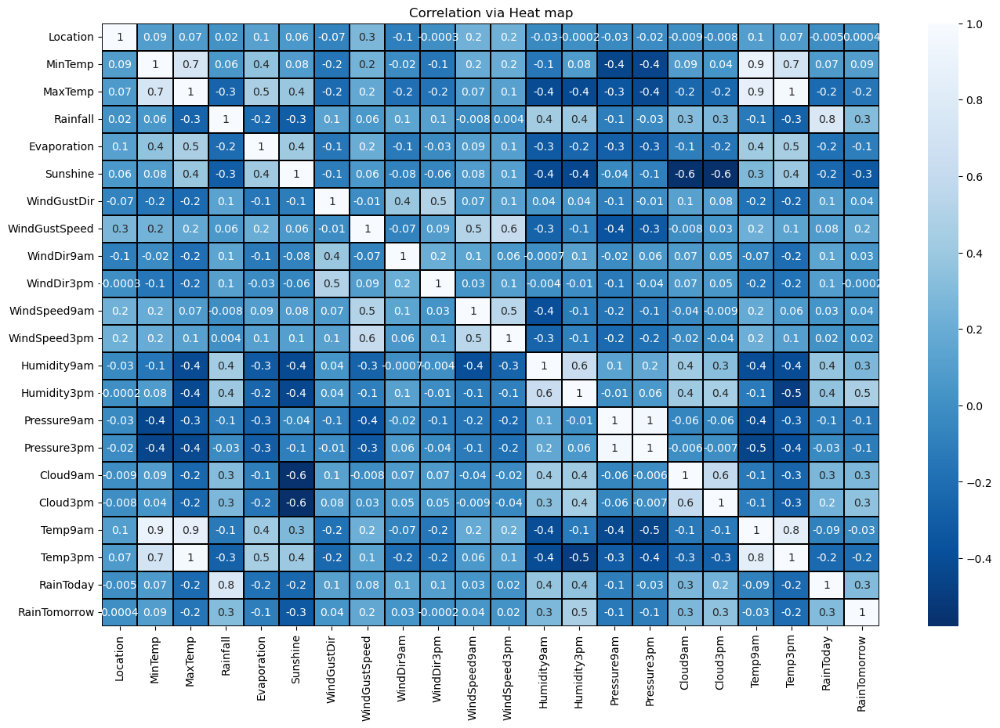

In [108]:
#Visualizing correlation via heat map
plt.figure(figsize=(16,10))
sb.heatmap(cor,annot=True,cmap="Blues_r",linecolor='black',linewidths=0.1,fmt='0.1g')
plt.title('Correlation via Heat map')
plt.show()

We can observe the following from this heatmap:  
  
1)**'Location', 'MinTemp', 'Rainfall','WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Cloud9am', 'Cloud3pm' and 'RainToday'** features have **low positive correlation** with **target variable.**  
  
2)**'Humidity3pm'** feature has **moderate positive correlation** with **target variable.** 
  
3)**'MaxTemp', 'Evaporation', 'Sunshine', 'WindDir3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am' and 'Temp3pm'** features have **low negative correlation** with  **target variable.**   
    
4)These are the following **pairs with high positive correlation with each other:**  
  
**'MinTemp' and 'Temp9am'** features   
**'MaxTemp' and 'Temp9am'** features  
**'Rainfall' and 'RainToday'** features   
**'Pressure9am' and 'Pressure3pm'** features  
**'Temp9am' and 'Temp3pm'** features   

In [109]:
#Separating features and target variable 
x=df.drop('RainTomorrow',axis=1)
y=df['RainTomorrow']    

In [110]:
#checking dimensions of features and label 
print('Dimensions of features:',x.shape,'\nDimensions of label:',y.shape)

Dimensions of features: (6409, 21) 
Dimensions of label: (6409,)


We can observe that both features and lable have **same number of rows**.  
'x' contains 21 features.

In [111]:
#Importing required library to apply StandardScaler
from sklearn.preprocessing import StandardScaler as sc

sc=sc()#creating instance

x=pd.DataFrame(sc.fit_transform(x),columns=x.columns)#transforming data
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,-1.391396,0.069013,-0.190468,1.284997,0.171997,-0.155572,1.248562,0.468774,1.317076,1.373685,...,0.755017,0.199453,-1.560200,-1.760338,-1.441102,1.468185,0.074091,-0.162504,-0.148977,-0.535675
1,-1.391396,-1.013984,0.174690,-0.733778,0.171997,-0.155572,1.457373,0.468774,-0.222676,1.596977,...,0.534451,-1.395784,-1.395411,-1.253293,-1.317590,0.081898,0.074091,-0.109750,0.277068,-0.535675
2,-1.391396,-0.021237,0.274278,-0.733778,0.171997,-0.155572,1.666183,0.631846,1.317076,1.596977,...,0.975583,-1.750281,-1.120763,-1.777822,-1.158788,0.081898,-1.003845,0.558474,0.089608,-0.535675
3,-1.391396,-0.689085,0.656034,-0.733778,0.171997,-0.155572,-0.630732,-1.161942,0.437218,-1.752399,...,-0.899227,-1.336701,-1.889778,-0.029393,-0.435358,0.081898,0.074091,0.048514,0.651988,-0.535675
4,-1.391396,0.809061,1.369752,1.348846,0.171997,-0.155572,1.248562,0.224167,-1.322499,-0.189357,...,0.313885,0.849364,-0.955974,-1.218325,-1.635194,1.064417,1.579912,-0.004241,1.197325,-0.535675
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6404,1.203340,-1.844282,-0.107478,-0.733778,0.171997,-0.155572,-1.465974,-0.591191,0.437218,-1.529108,...,-0.678661,-0.982204,-1.450341,1.194508,0.887991,0.081898,0.074091,-1.358272,-0.046726,-0.535675
6405,1.203340,-1.699882,0.207886,-0.733778,0.171997,-0.155572,-0.213111,-1.325014,0.437218,-1.082524,...,-0.899227,-0.686790,-1.615130,1.002180,0.676255,0.081898,0.074091,-1.217594,0.311152,-0.535675
6406,1.203340,-1.374983,0.473455,-0.733778,0.171997,-0.155572,-0.839543,-0.101977,0.437218,1.373685,...,-0.899227,-0.864038,-1.450341,0.565073,0.270428,0.081898,0.074091,-0.936237,0.583821,-0.535675
6407,1.203340,-0.941784,0.490054,-0.733778,0.171997,-0.155572,0.413320,-0.835799,0.657182,-1.082524,...,-1.119793,-0.982204,-1.450341,0.285324,0.217494,-0.550654,-1.003845,-0.479031,0.566779,-0.535675


The data is scaled using StandarScaler method to overcome the **issue of biasness.**

In [112]:
#Checking varience inflation factor
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif #Importing required library

v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.164015,Location
1,9.018501,MinTemp
2,26.380020,MaxTemp
3,2.717474,Rainfall
4,1.606024,Evaporation
5,2.165861,Sunshine
6,1.618748,WindGustDir
7,2.119280,WindGustSpeed
8,1.350309,WindDir9am
9,1.468794,WindDir3pm


**'MaxTemp', 'MinTemp', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', and 'Temp3pm'** features have **high VIF value**, thus posing **multicollinearity problem**. We can **drop 'Temp3pm'** feature as it has the **highest VIF value.** 

In [113]:
x.drop('Temp3pm',axis=1,inplace=True)#Dropping 'Temp3pm' feature
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday
0,-1.391396,0.069013,-0.190468,1.284997,0.171997,-0.155572,1.248562,0.468774,1.317076,1.373685,0.904165,0.755017,0.199453,-1.560200,-1.760338,-1.441102,1.468185,0.074091,-0.162504,-0.535675
1,-1.391396,-1.013984,0.174690,-0.733778,0.171997,-0.155572,1.457373,0.468774,-0.222676,1.596977,-0.859874,0.534451,-1.395784,-1.395411,-1.253293,-1.317590,0.081898,0.074091,-0.109750,-0.535675
2,-1.391396,-0.021237,0.274278,-0.733778,0.171997,-0.155572,1.666183,0.631846,1.317076,1.596977,0.821577,0.975583,-1.750281,-1.120763,-1.777822,-1.158788,0.081898,-1.003845,0.558474,-0.535675
3,-1.391396,-0.689085,0.656034,-0.733778,0.171997,-0.155572,-0.630732,-1.161942,0.437218,-1.752399,0.065993,-0.899227,-1.336701,-1.889778,-0.029393,-0.435358,0.081898,0.074091,0.048514,-0.535675
4,-1.391396,0.809061,1.369752,1.348846,0.171997,-0.155572,1.248562,0.224167,-1.322499,-0.189357,-0.412396,0.313885,0.849364,-0.955974,-1.218325,-1.635194,1.064417,1.579912,-0.004241,-0.535675
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6404,1.203340,-1.844282,-0.107478,-0.733778,0.171997,-0.155572,-1.465974,-0.591191,0.437218,-1.529108,0.274378,-0.678661,-0.982204,-1.450341,1.194508,0.887991,0.081898,0.074091,-1.358272,-0.535675
6405,1.203340,-1.699882,0.207886,-0.733778,0.171997,-0.155572,-0.213111,-1.325014,0.437218,-1.082524,0.274378,-0.899227,-0.686790,-1.615130,1.002180,0.676255,0.081898,0.074091,-1.217594,-0.535675
6406,1.203340,-1.374983,0.473455,-0.733778,0.171997,-0.155572,-0.839543,-0.101977,0.437218,1.373685,-0.160941,-0.899227,-0.864038,-1.450341,0.565073,0.270428,0.081898,0.074091,-0.936237,-0.535675
6407,1.203340,-0.941784,0.490054,-0.733778,0.171997,-0.155572,0.413320,-0.835799,0.657182,-1.082524,0.274378,-1.119793,-0.982204,-1.450341,0.285324,0.217494,-0.550654,-1.003845,-0.479031,-0.535675


**'Temp3pm'** feature is **dropped successfully.**

In [114]:
#re-checking varience inflation factor 
v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.163412,Location
1,8.944464,MinTemp
2,9.643347,MaxTemp
3,2.716967,Rainfall
4,1.604879,Evaporation
5,2.165733,Sunshine
6,1.615100,WindGustDir
7,2.111007,WindGustSpeed
8,1.348910,WindDir9am
9,1.468371,WindDir3pm


**'MaxTemp', 'MinTemp', 'Pressure9am', 'Pressure3pm'  and 'Temp9am'** features still have **high VIF value**. We can **drop 'Pressure9am'** feature as it has the **highest VIF value.** 

In [115]:
x.drop('Pressure9am',axis=1,inplace=True)#Dropping 'Pressure9am' feature
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,RainToday
0,-1.391396,0.069013,-0.190468,1.284997,0.171997,-0.155572,1.248562,0.468774,1.317076,1.373685,0.904165,0.755017,0.199453,-1.560200,-1.441102,1.468185,0.074091,-0.162504,-0.535675
1,-1.391396,-1.013984,0.174690,-0.733778,0.171997,-0.155572,1.457373,0.468774,-0.222676,1.596977,-0.859874,0.534451,-1.395784,-1.395411,-1.317590,0.081898,0.074091,-0.109750,-0.535675
2,-1.391396,-0.021237,0.274278,-0.733778,0.171997,-0.155572,1.666183,0.631846,1.317076,1.596977,0.821577,0.975583,-1.750281,-1.120763,-1.158788,0.081898,-1.003845,0.558474,-0.535675
3,-1.391396,-0.689085,0.656034,-0.733778,0.171997,-0.155572,-0.630732,-1.161942,0.437218,-1.752399,0.065993,-0.899227,-1.336701,-1.889778,-0.435358,0.081898,0.074091,0.048514,-0.535675
4,-1.391396,0.809061,1.369752,1.348846,0.171997,-0.155572,1.248562,0.224167,-1.322499,-0.189357,-0.412396,0.313885,0.849364,-0.955974,-1.635194,1.064417,1.579912,-0.004241,-0.535675
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6404,1.203340,-1.844282,-0.107478,-0.733778,0.171997,-0.155572,-1.465974,-0.591191,0.437218,-1.529108,0.274378,-0.678661,-0.982204,-1.450341,0.887991,0.081898,0.074091,-1.358272,-0.535675
6405,1.203340,-1.699882,0.207886,-0.733778,0.171997,-0.155572,-0.213111,-1.325014,0.437218,-1.082524,0.274378,-0.899227,-0.686790,-1.615130,0.676255,0.081898,0.074091,-1.217594,-0.535675
6406,1.203340,-1.374983,0.473455,-0.733778,0.171997,-0.155572,-0.839543,-0.101977,0.437218,1.373685,-0.160941,-0.899227,-0.864038,-1.450341,0.270428,0.081898,0.074091,-0.936237,-0.535675
6407,1.203340,-0.941784,0.490054,-0.733778,0.171997,-0.155572,0.413320,-0.835799,0.657182,-1.082524,0.274378,-1.119793,-0.982204,-1.450341,0.217494,-0.550654,-1.003845,-0.479031,-0.535675


**'Pressure9am'** feature is **dropped successfully.**

In [116]:
#re-checking varience inflation factor 
v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.162327,Location
1,8.846675,MinTemp
2,9.291780,MaxTemp
3,2.708363,Rainfall
4,1.584523,Evaporation
5,2.153752,Sunshine
6,1.597086,WindGustDir
7,2.093449,WindGustSpeed
8,1.326384,WindDir9am
9,1.404389,WindDir3pm


**'MaxTemp', 'MinTemp', 'Temp9am'** features still have **high VIF value**. We can **drop 'Temp9am'** feature as it has the **highest VIF value.** 

In [117]:
x.drop('Temp9am',axis=1,inplace=True)#Dropping 'Temp9am' feature
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday
0,-1.391396,0.069013,-0.190468,1.284997,0.171997,-0.155572,1.248562,0.468774,1.317076,1.373685,0.904165,0.755017,0.199453,-1.560200,-1.441102,1.468185,0.074091,-0.535675
1,-1.391396,-1.013984,0.174690,-0.733778,0.171997,-0.155572,1.457373,0.468774,-0.222676,1.596977,-0.859874,0.534451,-1.395784,-1.395411,-1.317590,0.081898,0.074091,-0.535675
2,-1.391396,-0.021237,0.274278,-0.733778,0.171997,-0.155572,1.666183,0.631846,1.317076,1.596977,0.821577,0.975583,-1.750281,-1.120763,-1.158788,0.081898,-1.003845,-0.535675
3,-1.391396,-0.689085,0.656034,-0.733778,0.171997,-0.155572,-0.630732,-1.161942,0.437218,-1.752399,0.065993,-0.899227,-1.336701,-1.889778,-0.435358,0.081898,0.074091,-0.535675
4,-1.391396,0.809061,1.369752,1.348846,0.171997,-0.155572,1.248562,0.224167,-1.322499,-0.189357,-0.412396,0.313885,0.849364,-0.955974,-1.635194,1.064417,1.579912,-0.535675
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6404,1.203340,-1.844282,-0.107478,-0.733778,0.171997,-0.155572,-1.465974,-0.591191,0.437218,-1.529108,0.274378,-0.678661,-0.982204,-1.450341,0.887991,0.081898,0.074091,-0.535675
6405,1.203340,-1.699882,0.207886,-0.733778,0.171997,-0.155572,-0.213111,-1.325014,0.437218,-1.082524,0.274378,-0.899227,-0.686790,-1.615130,0.676255,0.081898,0.074091,-0.535675
6406,1.203340,-1.374983,0.473455,-0.733778,0.171997,-0.155572,-0.839543,-0.101977,0.437218,1.373685,-0.160941,-0.899227,-0.864038,-1.450341,0.270428,0.081898,0.074091,-0.535675
6407,1.203340,-0.941784,0.490054,-0.733778,0.171997,-0.155572,0.413320,-0.835799,0.657182,-1.082524,0.274378,-1.119793,-0.982204,-1.450341,0.217494,-0.550654,-1.003845,-0.535675


**'Temp9am'** feature is **dropped successfully.**

In [118]:
#re-checking varience inflation factor 
v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.154188,Location
1,4.671303,MinTemp
2,5.653150,MaxTemp
3,2.707517,Rainfall
4,1.569795,Evaporation
5,2.125559,Sunshine
6,1.596283,WindGustDir
7,2.058671,WindGustSpeed
8,1.324991,WindDir9am
9,1.404357,WindDir3pm


**'MaxTemp'** feature still have **high VIF value**. We can **drop 'MaxTemp'** feature as it has the **highest VIF value.** 

In [119]:
x.drop('MaxTemp',axis=1,inplace=True)#Dropping 'MaxTemp' feature
x

,Location,MinTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday
0,-1.391396,0.069013,1.284997,0.171997,-0.155572,1.248562,0.468774,1.317076,1.373685,0.904165,0.755017,0.199453,-1.560200,-1.441102,1.468185,0.074091,-0.535675
1,-1.391396,-1.013984,-0.733778,0.171997,-0.155572,1.457373,0.468774,-0.222676,1.596977,-0.859874,0.534451,-1.395784,-1.395411,-1.317590,0.081898,0.074091,-0.535675
2,-1.391396,-0.021237,-0.733778,0.171997,-0.155572,1.666183,0.631846,1.317076,1.596977,0.821577,0.975583,-1.750281,-1.120763,-1.158788,0.081898,-1.003845,-0.535675
3,-1.391396,-0.689085,-0.733778,0.171997,-0.155572,-0.630732,-1.161942,0.437218,-1.752399,0.065993,-0.899227,-1.336701,-1.889778,-0.435358,0.081898,0.074091,-0.535675
4,-1.391396,0.809061,1.348846,0.171997,-0.155572,1.248562,0.224167,-1.322499,-0.189357,-0.412396,0.313885,0.849364,-0.955974,-1.635194,1.064417,1.579912,-0.535675
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6404,1.203340,-1.844282,-0.733778,0.171997,-0.155572,-1.465974,-0.591191,0.437218,-1.529108,0.274378,-0.678661,-0.982204,-1.450341,0.887991,0.081898,0.074091,-0.535675
6405,1.203340,-1.699882,-0.733778,0.171997,-0.155572,-0.213111,-1.325014,0.437218,-1.082524,0.274378,-0.899227,-0.686790,-1.615130,0.676255,0.081898,0.074091,-0.535675
6406,1.203340,-1.374983,-0.733778,0.171997,-0.155572,-0.839543,-0.101977,0.437218,1.373685,-0.160941,-0.899227,-0.864038,-1.450341,0.270428,0.081898,0.074091,-0.535675
6407,1.203340,-0.941784,-0.733778,0.171997,-0.155572,0.413320,-0.835799,0.657182,-1.082524,0.274378,-1.119793,-0.982204,-1.450341,0.217494,-0.550654,-1.003845,-0.535675


**'MaxTemp'** feature is **dropped successfully.**

In [120]:
#re-checking varience inflation factor 
v=pd.DataFrame()#creating empty data frame

v['VIF']=[vif(x.values,i) for i in range(len(x.columns))]#Storing varience inflation factor values in 'VIF' column
v['Features']=x.columns#creating new column named 'Features'
v

,VIF,Features
0,1.151282,Location
1,1.565969,MinTemp
2,2.679395,Rainfall
3,1.563592,Evaporation
4,2.088471,Sunshine
5,1.594961,WindGustDir
6,2.052311,WindGustSpeed
7,1.296037,WindDir9am
8,1.402746,WindDir3pm
9,1.842695,WindSpeed9am


Now the multicollinearity problem is solved. 

In [121]:
x.shape#checking shape of x

(6409, 17)

Now **'x'** has **17 features**.

In [122]:
y.value_counts()#checking value counts of 'y'

0    4979
1    1430
Name: RainTomorrow, dtype: int64

This shows that this data is imbalanced , to balance data, we can use oversampling method.

In [123]:
#oversampling the data
from imblearn.over_sampling import SMOTE #importing necessary library

sm=SMOTE()#creating instance

x1,y1=sm.fit_resample(x,y)#sampling data

In [124]:
y1.value_counts()#checking value counts of 'y1'

0    4979
1    4979
Name: RainTomorrow, dtype: int64

The data is balanced now.

In [125]:
#checking number of sampled data  
print('Dimensions of features before sampling:',x.shape[0],'\nDimensions of label before sampling:',y.shape[0],'\nDimensions of features after sampling:',x1.shape[0],'\nDimensions of label after sampling:',y1.shape[0],'\nDiffernce = ',x1.shape[0]-x.shape[0])#printing

#Updating features and label
x=x1
y=y1

Dimensions of features before sampling: 6409 
Dimensions of label before sampling: 6409 
Dimensions of features after sampling: 9958 
Dimensions of label after sampling: 9958 
Differnce =  3549


In [126]:
#Importing libraries
from sklearn.model_selection import train_test_split as tts,cross_val_score as cvs
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier,GradientBoostingClassifier, AdaBoostClassifier,BaggingClassifier
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score
from sklearn.svm import SVC as SupportVectorClassifier

In [127]:
#Finding best random state on Random Forest Classifier
ac_updater=0#initilizing variable
rs_updater=0#initilizing variable

for i in range(1,50):#running 'if' loop for 49 times
    
    x_train,x_test,y_train,y_test=tts(x,y,test_size=0.30,random_state=i)#spliting data
    
    RFR=RandomForestClassifier()#creating instance
    
    RFR.fit(x_train,y_train)#fitting data
    pr=RFR.predict(x_test)#predicting data
    
    ac=accuracy_score(y_test,pr)#calculating accuracy score 
    
    if ac>ac_updater:#using if condition to update 'ac_updater' and 'rs_updater' only if 'ac' is greater than 'ac_updater'
        #updating values
        ac_updater=ac
        rs_updater=i

print('Max accuracy score during the iteration is ',ac_updater,'on randome state : ',rs_updater)#printing

Max accuracy score during the iteration is  0.9032797858099063 on randome state :  7


In [128]:
x_train,x_test,y_train,y_test=tts(x,y,test_size=0.30,random_state=rs_updater)#Spliting data on the best random state

In [129]:
#Creating instance of  various models
LR=LogisticRegression()
RFC=RandomForestClassifier()
ETC=ExtraTreesClassifier()
GBC=GradientBoostingClassifier()
ABC=AdaBoostClassifier()
BC=BaggingClassifier()
SVC=SupportVectorClassifier()

models=[LR,RFC,ETC,GBC,ABC,BC,SVC]#Creating list containing the instances of the models

log=float('inf')#Initializing 'log' variable  to positive infinity
    
for i in models:#Iterating models 
    
    i.fit(x_train,y_train)#fitting data 
    pr=i.predict(x_test)#predicting data
    
    A_score=accuracy_score(y_test,pr)#calculating accuracy  score
    C_matrix=confusion_matrix(y_test,pr)#calculating confusion matrix
    C_report=classification_report(y_test,pr)#calculating classification report
    
    score=cvs(i,x,y)#calculating Cross Validation Score
    diff=abs(A_score - score.mean())*100  #calculating difference of accuracy score and Cross Validation Score
    
    #Printing    
    print('\n','Accuracy score of',str(i).split('(')[0],'is',A_score,'\n','\nConfusion matrix of',str(i).split('(')[0],':\n',C_matrix,'\nClassification report of ',str(i).split('(')[0],':\n',C_report,'\n')
    print('\nCross validation Score of',str(i).split('(')[0],'is',score,'\nMean: ',score.mean(),'\nDifference between Accuracy score and cross validation is ',diff)

    if diff<log and score.mean()>=0:#Using two condition to execute the following codes i.e. when log is greater than diff and mean of score in not negative
        
        log=diff#Updating 'log' variable if condition is True
        b_d=diff#Storing difference to 'b_d' variable in context to  the corresponding iteration 
        model=str(i).split('(')[0]#Storing model name to 'model' variable in context to  the corresponding iteration

print(f'\n\n{model} is the best model with least difference between accuracy score and cross validation i.e {b_d}')#Printing 


 Accuracy score of LogisticRegression is 0.7874832663989291 
 
Confusion matrix of LogisticRegression :
 [[1205  301]
 [ 334 1148]] 
Classification report of  LogisticRegression :
               precision    recall  f1-score   support

           0       0.78      0.80      0.79      1506
           1       0.79      0.77      0.78      1482

    accuracy                           0.79      2988
   macro avg       0.79      0.79      0.79      2988
weighted avg       0.79      0.79      0.79      2988
 


Cross validation Score of LogisticRegression is [0.7188755  0.67620482 0.6626506  0.7654445  0.8297338 ] 
Mean:  0.7305818452110803 
Difference between Accuracy score and cross validation is  5.69014211878488

 Accuracy score of RandomForestClassifier is 0.8969210174029452 
 
Confusion matrix of RandomForestClassifier :
 [[1339  167]
 [ 141 1341]] 
Classification report of  RandomForestClassifier :
               precision    recall  f1-score   support

           0       0.90      0

Here by comparing difference of accuracy score and cross validation  of various models, we can conclude that **LogisticRegression  is the best performing model** as it has the least difference between accuracy score and cross validation than the rest of the models.

In [131]:
#Using GridSearchCV  for hyperparameter tuning
from sklearn.model_selection import GridSearchCV as GSC#Importing required library

pa={'penalty': ['l1', 'l2', 'elasticnet', None],'dual':[True,False],'C':[0.001,0.01,0.1,1,10],'fit_intercept':[True,False],'solver':['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']}#defining hyper parameters

gsc=GSC(LR,pa)#creating instance

gsc.fit(x_train,y_train)#fitting data
gsc.best_params_#fetching best parameters

{'C': 0.1,
 'dual': False,
 'fit_intercept': True,
 'penalty': 'l2',
 'solver': 'lbfgs'}

In [132]:
#Applying best parameters provided by GridSearchCV
final=LogisticRegression(C=0.1,dual=False,fit_intercept=True,penalty='l2',solver='lbfgs')

In [133]:
final.fit(x_train,y_train)#fitting data 
pr=final.predict(x_test)#predicting data

ac=accuracy_score(y_test,pr)
print(ac)

0.7874832663989291


Model's accuracy score is increased from 73% to 78%.

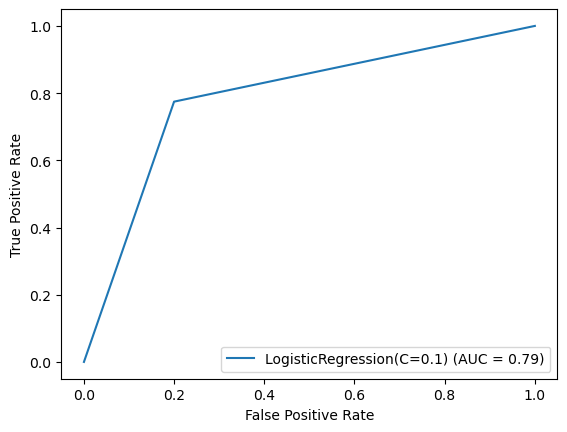

In [137]:
#Ploting roc curve
#Importing necessary libraries
from sklearn.metrics import roc_curve,auc,RocCurveDisplay

fpr,tpr,thresholds=roc_curve(y_test,pr)#Calculating ROC curve values
roc_auc=auc(fpr,tpr)#calculating AUC
display=RocCurveDisplay(fpr=fpr,tpr=tpr,roc_auc=roc_auc,estimator_name=final)#Creating a ROC curve display
display.plot()
plt.show()

**AUC** value is **0.79**, which means the model **performs Fairly well** in **distinguishing between the classes**.

In [138]:
#Conclusion
Predicted_values=final.predict(x_test)#storing predicted values in 'Predicted_values' variable
Original_values=y_test#storing original values in 'Original_values' variable

#creating new data frame with Predicted and Original values
conclusion=pd.DataFrame({'Predicted Values':Predicted_values,'Original Values':Original_values})

In [139]:
#replacing encoding values with original values
conclusion.replace(1,'Yes',inplace=True)
conclusion.replace(0,'No',inplace=True)

In [140]:
conclusion.sample(20)

,Predicted Values,Original Values
6931,Yes,Yes
748,No,No
2989,No,Yes
4003,Yes,No
9165,Yes,Yes
2554,No,No
5397,No,No
540,No,No
9602,No,Yes
5690,No,No


Here we can conclude that the model's overall **predicted values are close to original values.**

In [141]:
#Saving the model
import joblib#importing library
joblib.dump(final,r'D:\Models\RWF_C.obj')#saving model into desired path

['D:\\Models\\RWF_C.obj']